# Notebook d'exploration

#### Sommaire
<ol>
    <li ><a href=#Prise-en-main-des-données.> Prise en main des données.</a></li>
    <li> <a href=#Analyse-textuelle.> Analyse textuelle.</a></li>
    <ol>
        <li> <a href=#Tokenisation.>Tokenisation.</a></li>
        <li> <a href=#Fréquence-des-mots-du-corpus.>Fréquence des mots du corpus.</a></li>
        <li> <a href=#Bag-of-words.>Bag of words.</a></li>
    </ol>
    <li> <a href=#Suppression-des-tags-les-moins-courants.>Suppression des tags les moins courants.</a></li>
    <ol>
        <li> <a href=#Tags-synonymes.>Tags synonymes.</a></li>
        <li> <a href=#Tags-les-plus-fréquents.>Tags les plus fréquents.</a></li>
        <li> <a href=#Tags-présents-sur-plusieurs-années.>Tags présents sur plusieurs années.</a></li>
    </ol>
    <li> <a href=#Selection-de-colonnes-et-ajout-de-nouvelles-features.>Selection de colonnes et ajout de nouvelles features.</a></li>
    <li> <a href=#Modèle-retenu>Modèle retenu</a></li>
    <li> <a href=#Modèle-retenu>Modèle retenu</a></li>
    <li> <a href=#Modèle-retenu>Modèle retenu</a></li>
</ol>

## Prise en main des données.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from bs4 import BeautifulSoup
import xml
from sklearn.feature_extraction.text import TfidfVectorizer,TfidfTransformer,CountVectorizer
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import DBSCAN,AgglomerativeClustering,SpectralClustering, AffinityPropagation

In [2]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Niskiwork\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Nous avons retenu la requête SQL suivante.

SELECT * FROM Posts Where CreationDate >='2014-01-01' AND ViewCount > 5000  AND PostTypeId =1 AND Score>10 AND AnswerCount > 4 And FavoriteCount>1
SELECT * FROM Posts Where CreationDate >='2012-01-01' AND CreationDate <'2014-01-01' AND ViewCount > 5000  AND PostTypeId =1 AND Score>10 AND AnswerCount > 4 And FavoriteCount>1

In [3]:
query = pd.concat([pd.read_csv('FinalQuery1.csv'),pd.read_csv('FinalQuery2.csv')],sort=True,ignore_index=True)
common_tags= pd.read_csv('common_tags.csv')
tagsynonyms=pd.read_csv("tagsynonyms.csv")

## Nettoyage des données.

### Colonnes inutiles et valeurs manquantes.

In [4]:
query[query['CommunityOwnedDate'].notna()]

,AcceptedAnswerId,AnswerCount,Body,ClosedDate,CommentCount,CommunityOwnedDate,ContentLicense,CreationDate,DeletionDate,FavoriteCount,...,LastEditorDisplayName,LastEditorUserId,OwnerDisplayName,OwnerUserId,ParentId,PostTypeId,Score,Tags,Title,ViewCount
180,16595708.0,9,<p>I have just updated my android SDK tools to...,NaN,7,2013-05-19 18:17:59,CC BY-SA 3.0,2013-05-16 14:14:04,NaN,10,...,NaN,1832221.0,NaN,1832221.0,NaN,1,36,<java><android><sdk><crash>,Android app crashes after SDK-tools update ver...,12148
333,10846088.0,11,<p>Why does C's printf format string have both...,NaN,6,2012-07-20 03:49:40,CC BY-SA 3.0,2012-06-01 07:16:54,NaN,13,...,NaN,3830694.0,NaN,1418135.0,NaN,1,71,<c><string-formatting>,Why does C's printf format string have both %c...,23384
341,11016306.0,5,<p>Hope that someone can share their experienc...,2017-01-06 17:14:23,1,2012-11-28 14:10:51,CC BY-SA 3.0,2012-06-01 09:36:28,NaN,144,...,NaN,-1.0,NaN,1197370.0,NaN,1,186,<backbone.js><javascript-framework>,What are the real-world strengths and weakness...,21864
2306,17805277.0,14,<p>I'm running an Express.js application using...,NaN,14,2013-07-22 11:56:37,CC BY-SA 4.0,2013-06-21 23:49:22,NaN,100,...,NaN,189687.0,NaN,971459.0,NaN,1,323,<node.js><sockets><tcp><express>,How do I debug error ECONNRESET in Node.js?,618772
6190,15489975.0,6,<p><strong>edit 4/15:</strong> Catching nullpo...,NaN,3,2013-04-15 21:05:13,CC BY-SA 3.0,2013-03-17 00:45:50,NaN,22,...,NaN,-1.0,NaN,1851478.0,NaN,1,53,<android><in-app-billing>,Billing API v3 IabHelper NullPointerException,13473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67817,21973010.0,13,"<p>This works fine on my WAMP server, but does...",NaN,3,2014-03-04 23:29:29,CC BY-SA 3.0,2014-02-18 17:28:50,NaN,11,...,NaN,555222.0,NaN,555222.0,NaN,1,59,<php><soap>,SOAP-ERROR: Parsing WSDL: Couldn't load from -...,219783
67847,21881993.0,15,<p>I have created my tables in my <code>SQLite...,NaN,1,2014-02-19 16:52:15,CC BY-SA 4.0,2014-02-19 13:31:07,NaN,72,...,NaN,6819340.0,NaN,101361.0,NaN,1,305,<android><sqlite><android-sqlite><sqlexception...,When does SQLiteOpenHelper onCreate() / onUpgr...,123799
67934,NaN,5,<p>Why do some numbers lose accuracy when stor...,NaN,3,2014-06-12 18:34:39,CC BY-SA 4.0,2014-02-20 00:39:02,NaN,130,...,NaN,13860.0,NaN,3130539.0,NaN,1,213,<floating-point><language-agnostic><precision>,Why are floating point numbers inaccurate?,42122
74141,22823641.0,7,<p>We have recently purchased some new servers...,NaN,37,2014-04-03 03:18:29,CC BY-SA 3.0,2014-04-01 18:14:08,NaN,31,...,NaN,988348.0,NaN,988348.0,NaN,1,72,<c++><c><linux><memcpy><numa>,Poor memcpy Performance on Linux,13557


In [5]:
query.drop(query[query['CommunityOwnedDate'].notna()].index,axis=0,inplace=True)

In [6]:
query.drop('CommunityOwnedDate',axis=1,inplace=True)

In [7]:
query.nunique()

AcceptedAnswerId         74108
AnswerCount                 69
Body                     95442
ClosedDate                2897
CommentCount                49
ContentLicense               2
CreationDate             95410
DeletionDate                 0
FavoriteCount              498
Id                       95442
LastActivityDate         95369
LastEditDate             67942
LastEditorDisplayName      515
LastEditorUserId         29777
OwnerDisplayName          1184
OwnerUserId              70875
ParentId                     0
PostTypeId                   1
Score                     1024
Tags                     65241
Title                    95436
ViewCount                68206
dtype: int64

On supprime les colonnes suivante car elles ne nous seront pas utiles.

In [8]:
query.drop(['PostTypeId','ParentId','DeletionDate','ContentLicense','OwnerDisplayName'],axis=1,inplace=True)

In [9]:
Min=common_tags.Count.min()
Max=common_tags.Count.max()
(np.round((np.log1p(common_tags.Count)-np.log1p(Min))/np.log1p(Max),decimals=1)*10).value_counts()

0.0    579
1.0    474
2.0    102
3.0     23
4.0      8
Name: Count, dtype: int64

In [10]:
for i in query.columns:
    print(i,query[i].hasnans)

AcceptedAnswerId True
AnswerCount False
Body False
ClosedDate True
CommentCount False
CreationDate False
FavoriteCount False
Id False
LastActivityDate False
LastEditDate True
LastEditorDisplayName True
LastEditorUserId True
OwnerUserId True
Score False
Tags False
Title False
ViewCount False


In [11]:
query.count()

AcceptedAnswerId         74108
AnswerCount              95442
Body                     95442
ClosedDate                2898
CommentCount             95442
CreationDate             95442
FavoriteCount            95442
Id                       95442
LastActivityDate         95442
LastEditDate             71692
LastEditorDisplayName     1154
LastEditorUserId         70920
OwnerUserId              94059
Score                    95442
Tags                     95442
Title                    95442
ViewCount                95442
dtype: int64

Pour restreindre un peu plus le jeu de données on va se concentrer sur les questions qui ont des réponses acceptées.

In [12]:
query=query[query.AcceptedAnswerId.notna()]

In [13]:
query.count()

AcceptedAnswerId         74108
AnswerCount              74108
Body                     74108
ClosedDate                2209
CommentCount             74108
CreationDate             74108
FavoriteCount            74108
Id                       74108
LastActivityDate         74108
LastEditDate             55762
LastEditorDisplayName      887
LastEditorUserId         55190
OwnerUserId              73084
Score                    74108
Tags                     74108
Title                    74108
ViewCount                74108
dtype: int64

In [14]:
query=query[query.OwnerUserId.notna()]

In [15]:
query.count()

AcceptedAnswerId         73084
AnswerCount              73084
Body                     73084
ClosedDate                2158
CommentCount             73084
CreationDate             73084
FavoriteCount            73084
Id                       73084
LastActivityDate         73084
LastEditDate             54983
LastEditorDisplayName      657
LastEditorUserId         54556
OwnerUserId              73084
Score                    73084
Tags                     73084
Title                    73084
ViewCount                73084
dtype: int64

On a maintenant 73000 entrées

Regardons la forme de la colonne "Tags"

In [16]:
query.Tags.loc[37687]

'<javascript><angularjs>'

In [17]:
query.loc[1]

AcceptedAnswerId                                               1.09963e+07
AnswerCount                                                              6
Body                     <p>In following example:</p>\n\n<pre><code>Lin...
ClosedDate                                                             NaN
CommentCount                                                             5
CreationDate                                           2012-06-12 12:00:50
FavoriteCount                                                            3
Id                                                                10996237
LastActivityDate                                       2014-12-18 21:24:22
LastEditDate                                           2012-06-12 12:01:34
LastEditorDisplayName                                                  NaN
LastEditorUserId                                                    790695
OwnerUserId                                                         720943
Score                    

## Analyse textuelle.

### Tokenisation.

Dans les cellules suivante on va préparer des colonnes textuelles pour pouvoir les utiliser ensuite.

In [18]:
query['Body_text'] = [BeautifulSoup(query.loc[i].Body, 'html.parser').get_text() for i in query.index]

In [19]:
query['first_paragraph_uncleaned'] = [BeautifulSoup(query.loc[i].Body, 'html.parser').p for i in query.index]

In [20]:
query['all_paragraphs']=[[j for j in BeautifulSoup(query.loc[i].Body, 'html.parser').stripped_strings] for i in query.index]

On regarde un exemple des phrases extraites.

In [21]:
[i for i in BeautifulSoup(query.loc[4].Body, 'html.parser').strings]

['If I declare an object wrapped in a shared pointer:',
 '\n',
 'std::shared_ptr<myClass> myClassObject(new myClass());\n',
 '\n',
 'then I wanted to pass it as an argument to a method:',
 '\n',
 'DoSomething(myClassObject);\n\n//the called method\nvoid DoSomething(std::shared_ptr<myClass> arg1)\n{\n   arg1->someField = 4;\n}\n',
 '\n',
 "Does the above simply increment the shared_pt's reference count and everything is cool? Or does it leave a dangling pointer?",
 '\n',
 'Are you still supposed to do this?:',
 '\n',
 'DoSomething(myClassObject.Get());\n\nvoid DoSomething(std::shared_ptr<myClass>* arg1)\n{\n   (*arg1)->someField = 4;\n}\n',
 '\n',
 "I think that the 2nd way may be more efficient because it only has to copy 1 address (as opposed to the whole smart pointer), but the 1st way seems more readable and I do not anticipate pushing performance limits. I just want to make sure there's not something dangerous about it.",
 '\n',
 'Thank you.',
 '\n']

<AxesSubplot:>

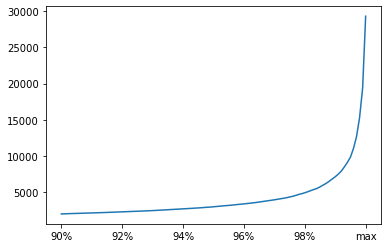

In [22]:
query['Body_text'].apply(len).describe(percentiles=np.arange(1000)/1000)[904:].plot()

In [23]:
query=query[query.Body_text.apply(len)<=query.Body_text.apply(len).quantile(0.98)]

On tokenise les questions et leurs titres.

In [24]:
Toknzr=nltk.RegexpTokenizer(r'\w+')

In [25]:
query["Body_words"]=query.all_paragraphs.apply(str).apply(str.lower).apply(Toknzr.tokenize)

<AxesSubplot:>

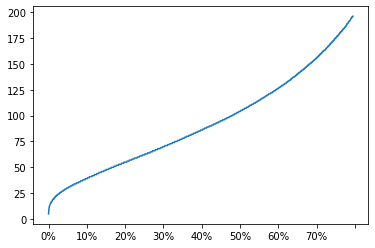

In [26]:
query.Body_words.apply(len).describe(percentiles=np.arange(1000)/1000.)[4:800].plot()

In [27]:
query.Body_words.apply(len).describe(percentiles=np.arange(20)/20.)

count    71622.000000
mean       138.654827
std        114.158197
min          5.000000
0%           5.000000
5%          30.000000
10%         39.000000
15%         47.000000
20%         55.000000
25%         62.000000
30%         70.000000
35%         78.000000
40%         86.000000
45%         95.000000
50%        104.000000
55%        115.000000
60%        126.000000
65%        140.000000
70%        156.000000
75%        175.000000
80%        199.000000
85%        232.000000
90%        283.000000
95%        375.000000
max       1031.000000
Name: Body_words, dtype: float64

On applique le même traitement à la colonne titre.

In [28]:
query["Title_words"]=query.Title.apply(str).apply(str.lower).apply(Toknzr.tokenize)

In [29]:
query.Title_words.apply(len).describe(percentiles=np.arange(10)/10.)

count    71622.000000
mean         8.826911
std          3.396591
min          1.000000
0%           1.000000
10%          5.000000
20%          6.000000
30%          7.000000
40%          8.000000
50%          8.000000
60%          9.000000
70%         10.000000
80%         11.000000
90%         13.000000
max         51.000000
Name: Title_words, dtype: float64

In [30]:
query[query.Title_words.apply(len)<3].Title

486      SSL_CTX_use_PrivateKey_file() failed
1633                          python compiler
2156                        Image Placeholder
2406              Offsetting UIRefreshControl
2563                    CompoundDrawable size
                         ...                 
87124              RecyclerView ClassNotFound
87777                        Typescript sleep
90125                       Disable TabLayout
90817                   Node MODULE_NOT_FOUND
91984                    RecyclerView onClick
Name: Title, Length: 147, dtype: object

In [31]:
query.drop(query[query.Title_words.apply(len)<3].index,axis=0,inplace=True)

On voit que certains titres sont la reproduction exact du message d'erreur et peuvent nous être utile même s'ils contiennent peu de mots.

Maintenant que l'on a tokenisé nos textes on va les décrire.

###  Fréquence des mots du corpus.

Commençons par regarder les mot les plus fréquents.

In [32]:
frequency=dict()
frequency={i:nltk.FreqDist(query.Body_words[i]) for i in query.index}

In [33]:
word_frequency_body=dict()
for idx in query.index:
    for key,value in frequency[idx].items():
        if key not in word_frequency_body.keys():
            word_frequency_body[key]=0
        word_frequency_body[key]+=value

On peut voir que l'on a une distribution très irrégulière des mots dans le corpus.

In [34]:
word_frequency_body=pd.Series(word_frequency_body)

<AxesSubplot:>

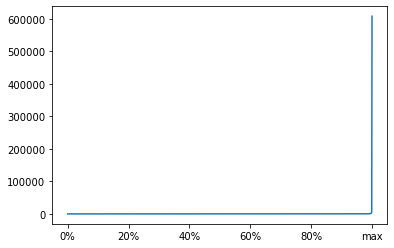

In [35]:
word_frequency_body.describe(percentiles=np.arange(1000)/1000.)[4:].plot()

In [36]:
word_frequency_body=word_frequency_body.sort_values(ascending=False)

De nombreux mots sont des mots de la langue anglaise, d'autre sont certainement des relicat de notre extraction de l'html.

In [37]:
word_frequency_body[:50]

n          608275
the        324299
i          309862
to         233123
a          166015
is         130511
in         116361
and        112247
this       102270
it          92021
of          82277
that        67123
0           63863
for         61983
1           59658
my          57105
but         56413
have        54653
with        50135
not         47649
on          45646
can         44352
if          41488
t           40071
android     39772
be          36619
2           36616
as          36114
from        35328
how         34561
an          33278
do          32504
using       31558
error       31047
m           30965
s           30714
get         30081
like        29981
when        29805
am          29518
class       28673
or          28097
code        28080
new         27979
file        27611
there       27348
so          27166
what        25761
at          24858
string      24355
dtype: int64

On va maintenant nettoyer un peu les mots, on applique successivement un nettoyage par fréquence, puis les mots qui snt en fait des nombre et en fin les mots d'une seule lettre.

In [38]:
word_frequency_body=word_frequency_body[word_frequency_body>=50]

In [39]:
for i in word_frequency_body.index:
    try:
        int(i)
    except:
        None
    else:
        print("deleting", i,"whose frequency is", word_frequency_body[i])
        del word_frequency_body[i]

deleting 0 whose frequency is 63863
deleting 1 whose frequency is 59658
deleting 2 whose frequency is 36616
deleting 3 whose frequency is 23507
deleting 4 whose frequency is 17223
deleting 5 whose frequency is 15035
deleting 7 whose frequency is 10676
deleting 10 whose frequency is 10359
deleting 6 whose frequency is 9722
deleting 8 whose frequency is 9688
deleting 9 whose frequency is 6427
deleting 12 whose frequency is 4943
deleting 11 whose frequency is 4621
deleting 00 whose frequency is 4331
deleting 100 whose frequency is 3925
deleting 20 whose frequency is 3337
deleting 15 whose frequency is 3053
deleting 16 whose frequency is 3036
deleting 13 whose frequency is 2850
deleting 01 whose frequency is 2742
deleting 14 whose frequency is 2654
deleting 2012 whose frequency is 2255
deleting 23 whose frequency is 2176
deleting 30 whose frequency is 2134
deleting 17 whose frequency is 2014
deleting 22 whose frequency is 2003
deleting 50 whose frequency is 1936
deleting 21 whose frequency

deleting 422 whose frequency is 67
deleting 129 whose frequency is 67
deleting 502 whose frequency is 66
deleting 123456 whose frequency is 66
deleting 132 whose frequency is 65
deleting 254 whose frequency is 65
deleting 179 whose frequency is 65
deleting 114 whose frequency is 65
deleting 165 whose frequency is 65
deleting 2004 whose frequency is 65
deleting 9999 whose frequency is 64
deleting 152 whose frequency is 64
deleting 133 whose frequency is 64
deleting 9200 whose frequency is 63
deleting 188 whose frequency is 63
deleting 131 whose frequency is 63
deleting 175 whose frequency is 62
deleting 0400 whose frequency is 62
deleting 181 whose frequency is 62
deleting 194 whose frequency is 62
deleting 124 whose frequency is 61
deleting 0700 whose frequency is 61
deleting 248 whose frequency is 61
deleting 587 whose frequency is 61
deleting 191 whose frequency is 61
deleting 507 whose frequency is 60
deleting 113 whose frequency is 60
deleting 2048 whose frequency is 60
deleting 22

In [40]:
for i in word_frequency_body.index:
    if len(i)==1 and i !="c" and i!="r":
        print("deleting", i,"whose frequency is", word_frequency_body[i])
        del word_frequency_body[i]

deleting n whose frequency is 608275
deleting i whose frequency is 309862
deleting a whose frequency is 166015
deleting t whose frequency is 40071
deleting m whose frequency is 30965
deleting s whose frequency is 30714
deleting x whose frequency is 11803
deleting e whose frequency is 10583
deleting d whose frequency is 10103
deleting b whose frequency is 8298
deleting p whose frequency is 5516
deleting y whose frequency is 4567
deleting g whose frequency is 3833
deleting v whose frequency is 3365
deleting f whose frequency is 3319
deleting h whose frequency is 3168
deleting o whose frequency is 2627
deleting j whose frequency is 1895
deleting u whose frequency is 1722
deleting w whose frequency is 1569
deleting k whose frequency is 1451
deleting l whose frequency is 1444
deleting _ whose frequency is 1436
deleting z whose frequency is 1311
deleting q whose frequency is 1215


<AxesSubplot:>

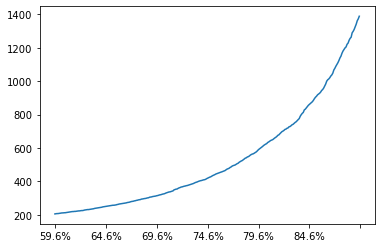

In [41]:
word_frequency_body.describe(percentiles=np.arange(1000)/1000.)[600:900].plot()

In [42]:
word_frequency_body=word_frequency_body[word_frequency_body>10]

<AxesSubplot:>

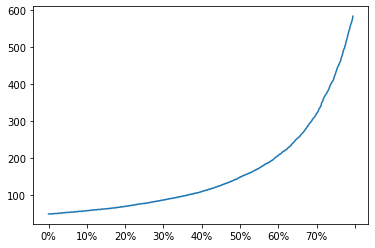

In [43]:
word_frequency_body.describe(percentiles=np.arange(1000)/1000.)[4:800].plot()

On voit que la nouvelle distribution est un peu plus lisse.

On va regarder la distribution des mot de longueur supérieur à 5 strictement.

<AxesSubplot:>

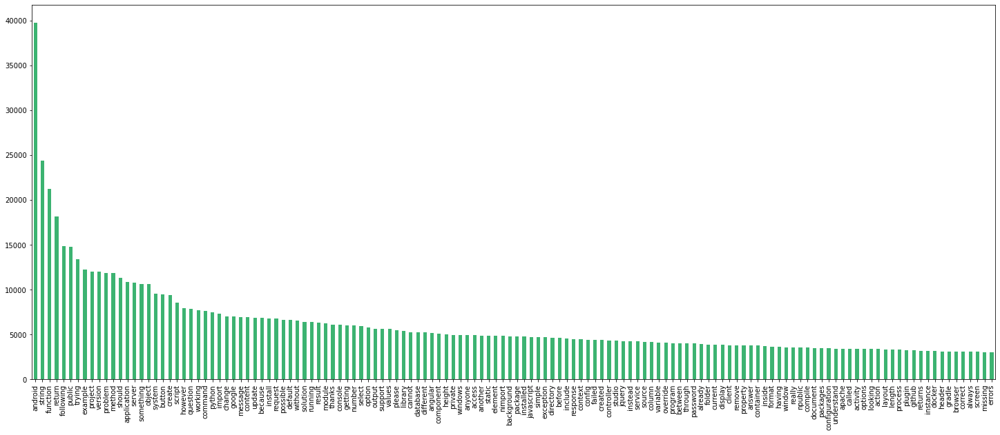

In [44]:
plt.figure(figsize=(25,10))
word_frequency_body[[i for i in word_frequency_body.index if len(i)>5 and word_frequency_body[i]>3000]].plot(kind='bar',color='mEdIuMSeaGreen', )

On voit déjà que certain mots nous donne des informations précise sur le sujet de la question comme "python" par exemple alors que d'autre comme "String" sont très généraux en informatique.

On va maintenant regarder un peu plus en détail les tags fournit avec le jeu de données. On utilise une recherche par expressions régulières.

In [45]:
tags_extracted=query.Tags.str.extractall(r'<([^>^<]+)>')

In [46]:
query[['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ]]=tags_extracted.unstack()[0]

In [47]:
query[['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ]].value_counts()

Tag_list0   Tag_list1       Tag_list2        Tag_list3              Tag_list4        
javascript  jquery          html             css                    twitter-bootstrap    18
android     android-studio  gradle           android-gradle-plugin  build.gradle          8
python      apache-spark    dataframe        pyspark                apache-spark-sql      6
java        spring          jpa              spring-data            spring-data-jpa       5
angular     typescript      ionic-framework  ionic2                 ionic3                5
                                                                                         ..
javascript  node.js         reactjs          webpack                babeljs               1
                                             react-scripts          pkill                 1
                                             react-router           react-router-v4       1
                                             npm                    node-modules      

On crée un dataframe avec les tags et leur fréquences.

In [48]:
tags_frequency= pd.Series(0,index={k  for i in ['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ] for k in query[i].unique() if k is not np.nan})
temp=pd.DataFrame()
for i in['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ]:
    temp[i]=query[i].value_counts().reindex(tags_frequency.keys())
tags_frequency=temp.fillna(0).transpose().apply(sum).sort_values(ascending=False)
del temp

<AxesSubplot:>

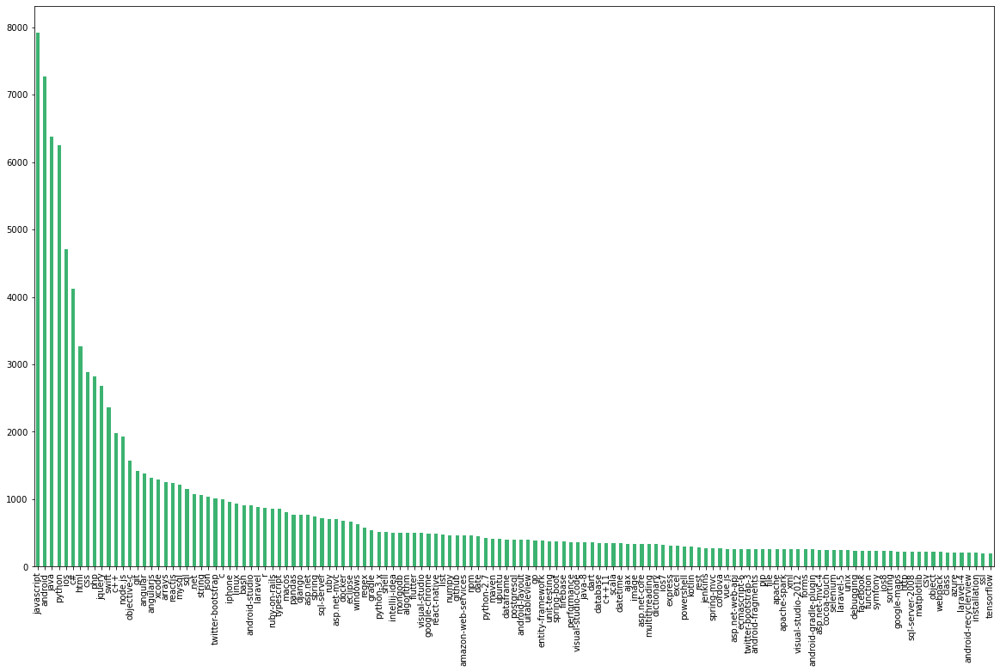

In [49]:
plt.figure(figsize=(20,12))
tags_frequency[tags_frequency >200].plot(kind='bar',color='mediumseagreen', )

On va retracer le graphique mais avec un sous-ensemble de tag tiré du jeu common_tags qui regroupe les tags les plus utilisé sur la plateforme.

In [50]:
tags_frequency_mf=tags_frequency[set(tags_frequency.index)&set(common_tags.TagName)].sort_values(ascending=False)

In [51]:
tags_frequency_mf

javascript      7916.0
android         7268.0
java            6378.0
python          6249.0
ios             4708.0
                 ...  
nhibernate         1.0
sapui5             1.0
dojo               1.0
discord.py         1.0
actionscript       1.0
Length: 1178, dtype: float64

<AxesSubplot:>

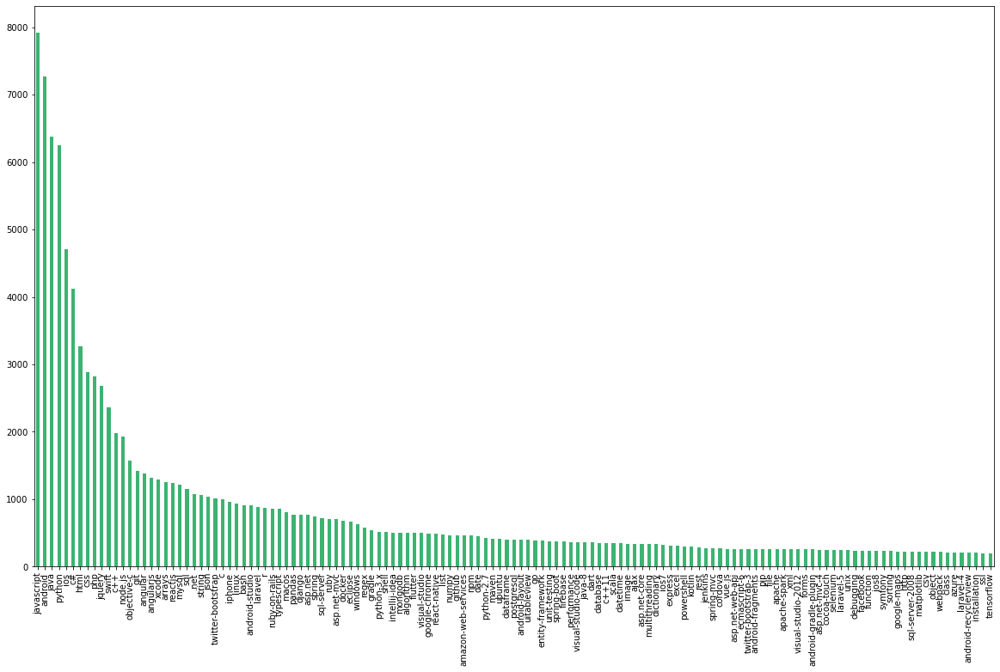

In [52]:
plt.figure(figsize=(20,12))
tags_frequency_mf[tags_frequency >200].plot(kind='bar',color='MediumSeaGreen', )

Pour indication les tags les plus fréquent dans le jeu common_tags:

<Figure size 2160x864 with 0 Axes>

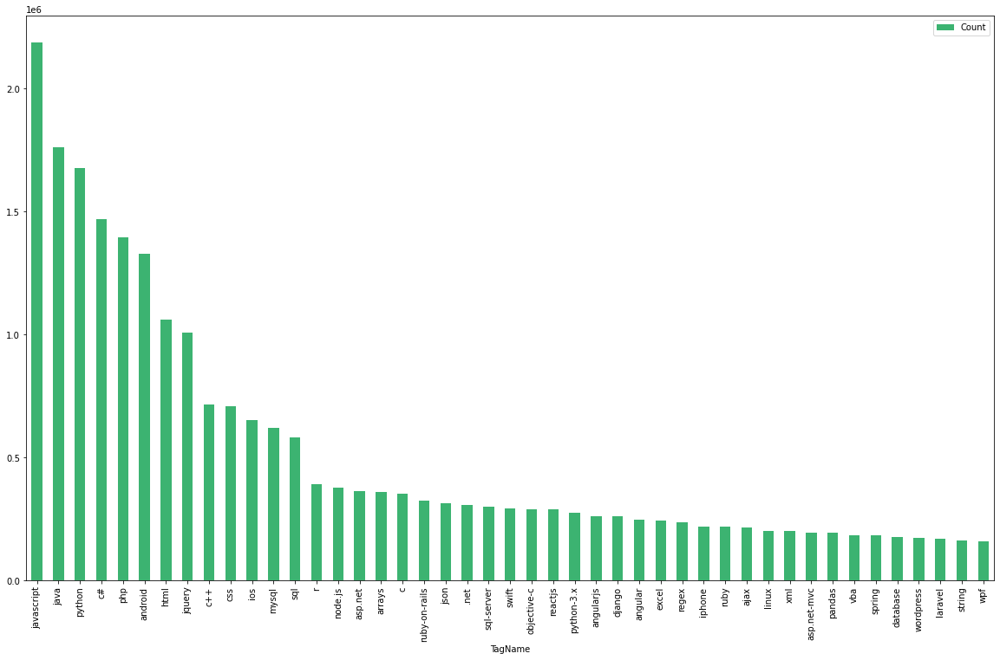

In [53]:
plt.figure(figsize=(30,12))
common_tags.sort_values(ascending=False,by='Count').loc[common_tags.Count>150000,['TagName','Count']].plot(kind='bar',color='mEdIuMSeaGreen',x='TagName',y='Count',figsize=(20,12))
plt.show()

In [54]:
common_tags=common_tags.sort_values(ascending=False,by='Count')

On va comparer la fréquence des tags extraits de notre jeu de questions sur la plateforme avec le jeu de donnée qui correspond aux tags les plus utilisés généralement (la fréquence correspond alors au décompte fournit par StackOverflow).

No handles with labels found to put in legend.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


<Figure size 2880x864 with 0 Axes>

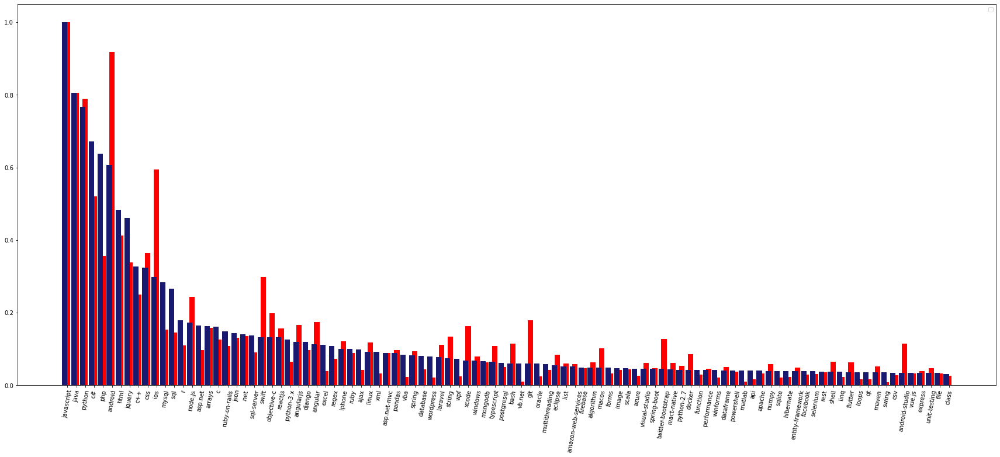

In [55]:
plt.figure(figsize=(40,12))
fig, ax=plt.subplots(figsize=(30,12))
ax.bar(x=np.arange(100),height=tags_frequency_mf[common_tags.TagName[:100]]/tags_frequency_mf.max(),width=0.6,color='red')
ax.bar(x=np.arange(100),height=common_tags.Count[:100]/common_tags.Count.max(),width=-0.6,align='edge',color='midnightblue',alpha=1)
ax.set_xticks(np.arange(100))
ax.set_xticklabels(common_tags.TagName[:100],rotation=80)
ax.legend()
fig.show()

Pour avoir une meilleure idée de la forme générale d'un tag, on utilise une table de correspondance fournit par la plateforme pour réunir des synonymes de tags ensembles.

In [56]:
tagsynonyms=pd.read_csv("tagsynonyms.csv")

In [57]:
map_dict=dict()
for i in set(tags_frequency.index)&set(tagsynonyms['SourceTagName']):
    map_dict[i]=tagsynonyms[tagsynonyms.SourceTagName == i].TargetTagName.values[0]

In [58]:
for i in tags_frequency.index:
    if i in map_dict.keys():
        if map_dict[i] not in tags_frequency.index:
            tags_frequency[map_dict[i]]=0
        tags_frequency[map_dict[i]]=tags_frequency[i]+tags_frequency[map_dict[i]]
        del tags_frequency[i]
common_tags.TagName=common_tags.TagName.replace(map_dict)

In [59]:
tags_frequency_mf=tags_frequency[set(tags_frequency.index)&set(common_tags.TagName)].sort_values(ascending=False)

No handles with labels found to put in legend.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


<Figure size 2880x864 with 0 Axes>

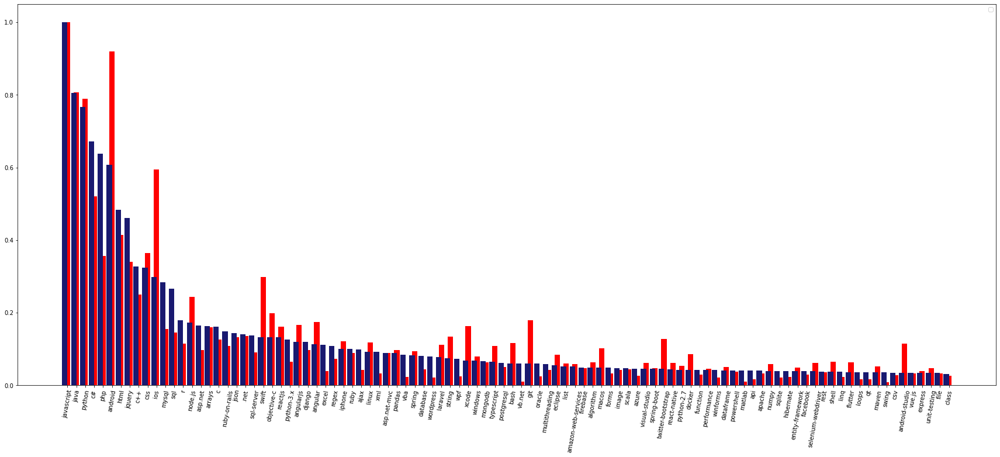

In [60]:
plt.figure(figsize=(40,12))
fig, ax=plt.subplots(figsize=(30,12))
ax.bar(x=np.arange(100),height=tags_frequency_mf[common_tags.TagName[:100]]/tags_frequency_mf.max(),width=0.6,color='red')
ax.bar(x=np.arange(100),height=common_tags.Count[:100]/common_tags.Count.max(),width=-0.6,align='edge',color='midnightblue',alpha=1)
ax.set_xticks(np.arange(100))
ax.set_xticklabels(common_tags.TagName[:100],rotation=80)
ax.legend()
fig.show()

On trace maintenant le même graphique en s'appuyant sur la part relative des tags. (les deux graphique ci-dessus étaient simplement normalisé par le maximum des occurence).

No handles with labels found to put in legend.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


<Figure size 2880x864 with 0 Axes>

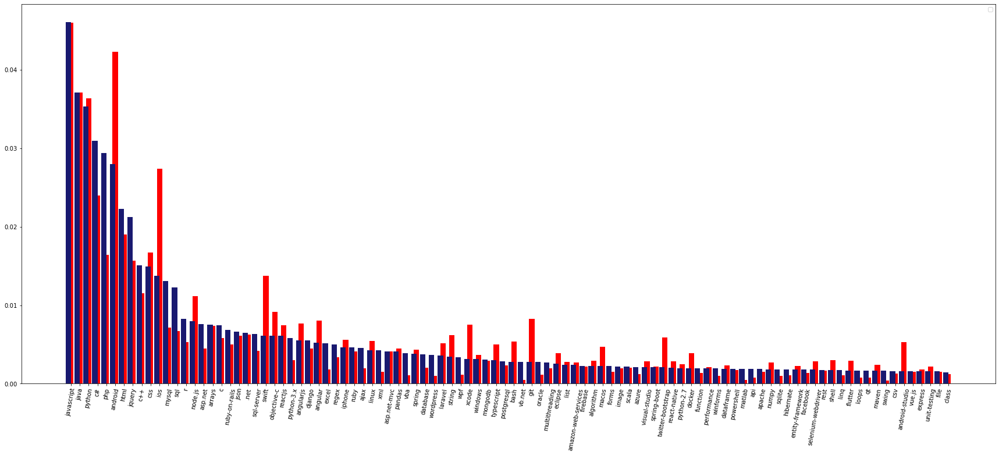

In [61]:
plt.figure(figsize=(40,12))
fig, ax=plt.subplots(figsize=(30,12))
ax.bar(x=np.arange(100),height=tags_frequency_mf[common_tags.TagName[:100]]/tags_frequency_mf.sum(),width=0.6,color='red')
ax.bar(x=np.arange(100),height=common_tags.Count[:100]/common_tags.Count.sum(),width=-0.6,align='edge',color='midnightblue',alpha=1)
ax.set_xticks(np.arange(100))
ax.set_xticklabels(common_tags.TagName[:100],rotation=80)
ax.legend()
fig.show()

### Bag of words.

On va utiliser une vectorisation et un algorithme de manifold learning pour visualiser nos données.

On regarde la repartition en bigrams et trigrams que l'on stocke pour une utilisation ultérieure, et on va calculer les fréquence TfIdf des textes.

In [62]:
query['Body_Bigrams']=query.Body_words.apply(nltk.ngrams,**{'n':2}).apply(list)
query['Body_Trigrams']=query.Body_words.apply(nltk.ngrams,**{'n':3}).apply(list)

In [63]:
tfidf=TfidfVectorizer(max_features=65000,ngram_range=(1,3),stop_words='english')

On va regarder la similarité des mots entre les différents tag, pour cela on va regrouper les différents texte par tags. Cela va nous permettre d'établir un vocabulaire propre à chaque tag. La manière dont on l'implémente permet à l'un de nos texte (question posé) d'être présent dans le corpus de plusieurs tag et donc d'établir un vocabulaire plus proche entre par exemple "python" et "pip" qu'entre "python" et "java".

<AxesSubplot:>

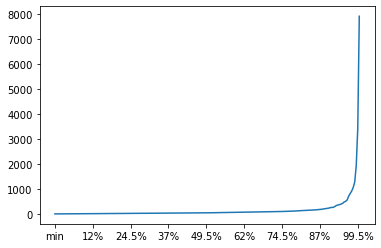

In [64]:
tags_frequency_mf.describe(percentiles=np.arange(200)/200.)[3:].plot()

In [65]:
tags_frequency_mf.describe(percentiles=np.arange(200)/200.)[150:]

73%        92.000
73.5%      94.805
74%        96.000
74.5%      98.000
75%       100.000
75.5%     101.000
76%       103.000
76.5%     105.000
77%       108.000
77.5%     109.325
78%       111.000
78.5%     113.000
79%       117.770
79.5%     124.000
80%       127.000
80.5%     130.000
81%       132.030
81.5%     136.845
82%       138.660
82.5%     142.000
83%       143.000
83.5%     147.105
84%       149.920
84.5%     152.000
85%       155.000
85.5%     162.730
86%       167.540
86.5%     173.990
87%       179.000
87.5%     186.000
88%       195.440
88.5%     203.765
89%       218.070
89.5%     227.885
90%       234.400
90.5%     255.515
91%       260.330
91.5%     266.145
92%       302.720
92.5%     342.550
93%       356.180
93.5%     374.215
94%       398.660
94.5%     422.120
95%       480.900
95.5%     502.995
96%       561.720
96.5%     713.655
97%       812.280
97.5%     918.625
98%      1059.320
98.5%    1283.770
99%      1944.980
99.5%    3432.510
max      7916.000
dtype: flo

On crée notre corpus par tag.

In [66]:
tag_similarity_df=dict()
for i in tags_frequency_mf[tags_frequency_mf>=100].index:
    tag_similarity_df[i]=str()
    print(i)
    for j in query.index:
        if sum([i == query.loc[j,t] for t in query.columns if 'Tag_l' in t]):
            tag_similarity_df[i]=tag_similarity_df[i]+" "+str(query.loc[j,'Body_words'])


javascript
android
java
python
ios
c#
html
css
php
jquery
swift
c++
node.js
objective-c
git
angular
angularjs
xcode
reactjs
arrays
mysql
sql
.net
string
json
twitter-bootstrap
c
iphone
linux
bash
r
android-studio
laravel
ruby-on-rails
typescript
macos
pandas
django
asp.net
spring
sql-server
ruby
asp.net-mvc
docker
eclipse
windows
regex
gradle
python-3.x
shell
intellij-idea
mongodb
algorithm
flutter
selenium-webdriver
visual-studio
google-chrome
react-native
list
numpy
github
amazon-web-services
npm
date
python-2.7
maven
ubuntu
dataframe
postgresql
uitableview
android-layout
go
laravel-5
entity-framework
unit-testing
dictionary
spring-boot
firebase
performance
visual-studio-code
java-8
dart
database
c++11
scala
datetime
ajax
image
asp.net-core
multithreading
ios7
express
excel
powershell
kotlin
rest
spring-mvc
jenkins
cordova
ecmascript-6
vue.js
asp.net-web-api
exception
twitter-bootstrap-3
android-fragments
pip
apache
file
apache-spark
xml
visual-studio-2012
forms
android-gradle-plugin

In [67]:
tsvd=TruncatedSVD(n_components=250, n_iter=25, random_state=2)

On vectorise notre corpus puis on sélectionne un nombre restreint de feature.

In [68]:
values=tfidf.fit_transform(tag_similarity_df.values())

In [69]:
decomposed_values=tsvd.fit_transform(values)

[ 1.58  5.63  9.31 12.83 15.9  18.44 20.4  22.23 23.93 25.5  26.89 28.23
 29.47 30.62 31.69 32.67 33.63 34.58 35.49 36.35 37.18 37.99 38.79 39.56
 40.32 41.07 41.8  42.51 43.2  43.86 44.5  45.14 45.76 46.37 46.98 47.58
 48.17 48.75 49.33 49.89 50.44 50.97 51.5  52.01 52.52 53.02 53.51 54.
 54.49 54.97 55.44 55.9  56.35 56.8  57.24 57.67 58.09 58.5  58.91 59.32
 59.73 60.13 60.53 60.92 61.31 61.7  62.08 62.46 62.83 63.2  63.57 63.94
 64.3  64.66 65.02 65.37 65.72 66.07 66.42 66.76 67.1  67.44 67.78 68.12
 68.45 68.78 69.11 69.44 69.76 70.08 70.4  70.72 71.03 71.34 71.65 71.96
 72.26 72.56 72.86 73.16 73.46 73.75 74.04 74.33 74.62 74.91 75.2  75.48
 75.76 76.04 76.32 76.6  76.87 77.14 77.41 77.68 77.95 78.21 78.47 78.73
 78.99 79.25 79.5  79.75 80.   80.25 80.5  80.75 81.   81.24 81.48 81.72
 81.96 82.2  82.44 82.67 82.9  83.13 83.36 83.59 83.82 84.04 84.26 84.48
 84.7  84.92 85.14 85.35 85.56 85.77 85.98 86.19 86.4  86.6  86.8  87.
 87.2  87.4  87.6  87.79 87.98 88.17 88.36 88.55 88.73 

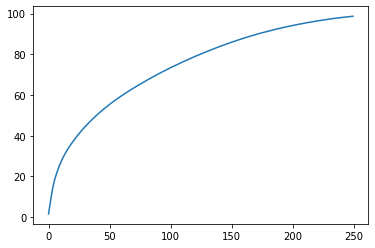

In [70]:
print(np.cumsum(np.round(tsvd.explained_variance_ratio_, decimals=4)*100))
plt.plot(np.cumsum(np.round(tsvd.explained_variance_ratio_, decimals=4)*100))

On va maintenant visualiser notre bag of words avec plusieurs paramètre de t-SNE

In [71]:
tsne=TSNE(perplexity= 20,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [72]:
sne_values=tsne.fit_transform(decomposed_values,)

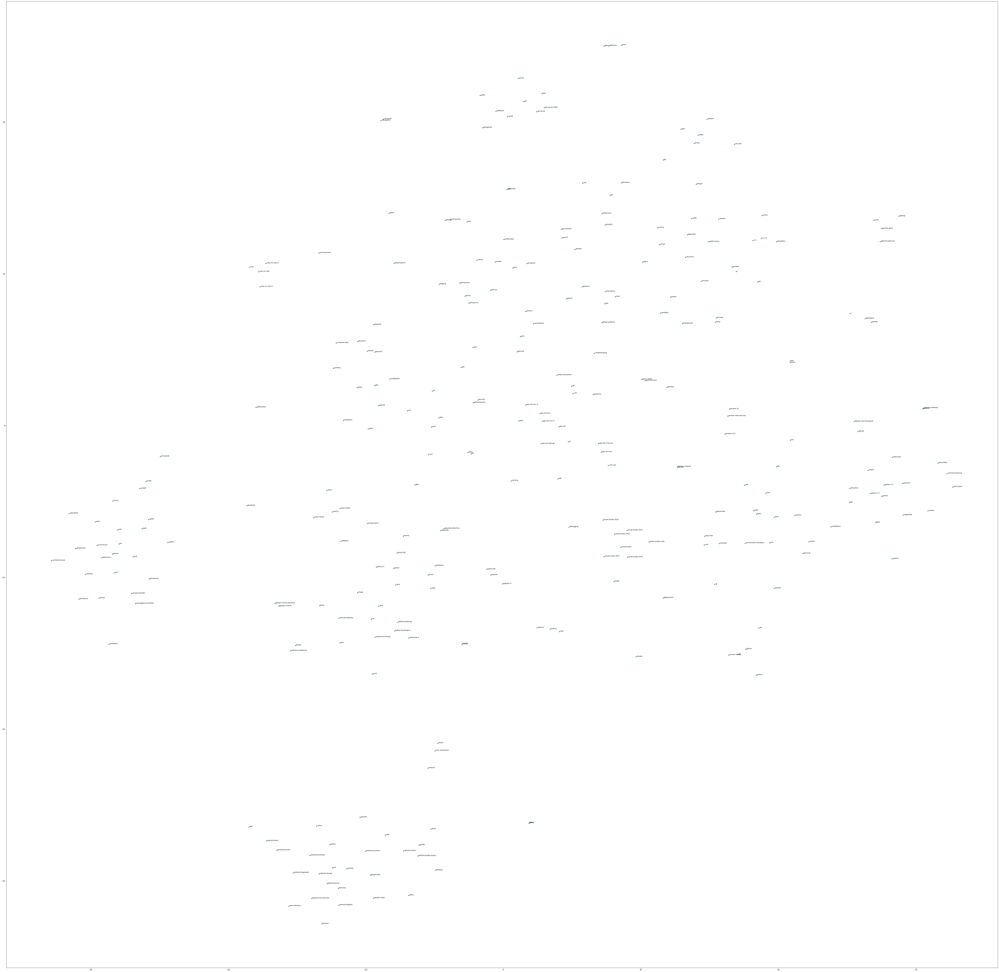

In [73]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


In [74]:
tsne=TSNE(perplexity= 40,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [75]:
sne_values=tsne.fit_transform(decomposed_values,)

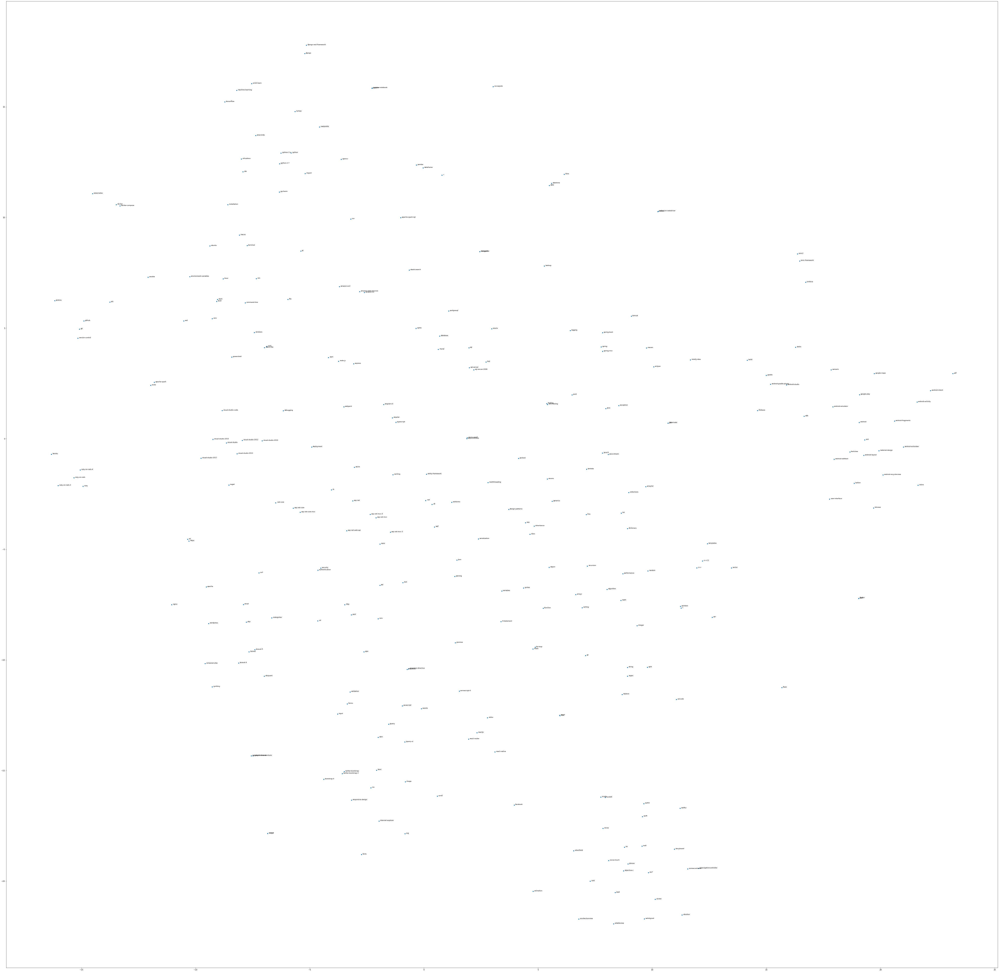

In [76]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


In [77]:
tsne=TSNE(perplexity= 50,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [78]:
sne_values=tsne.fit_transform(decomposed_values,)

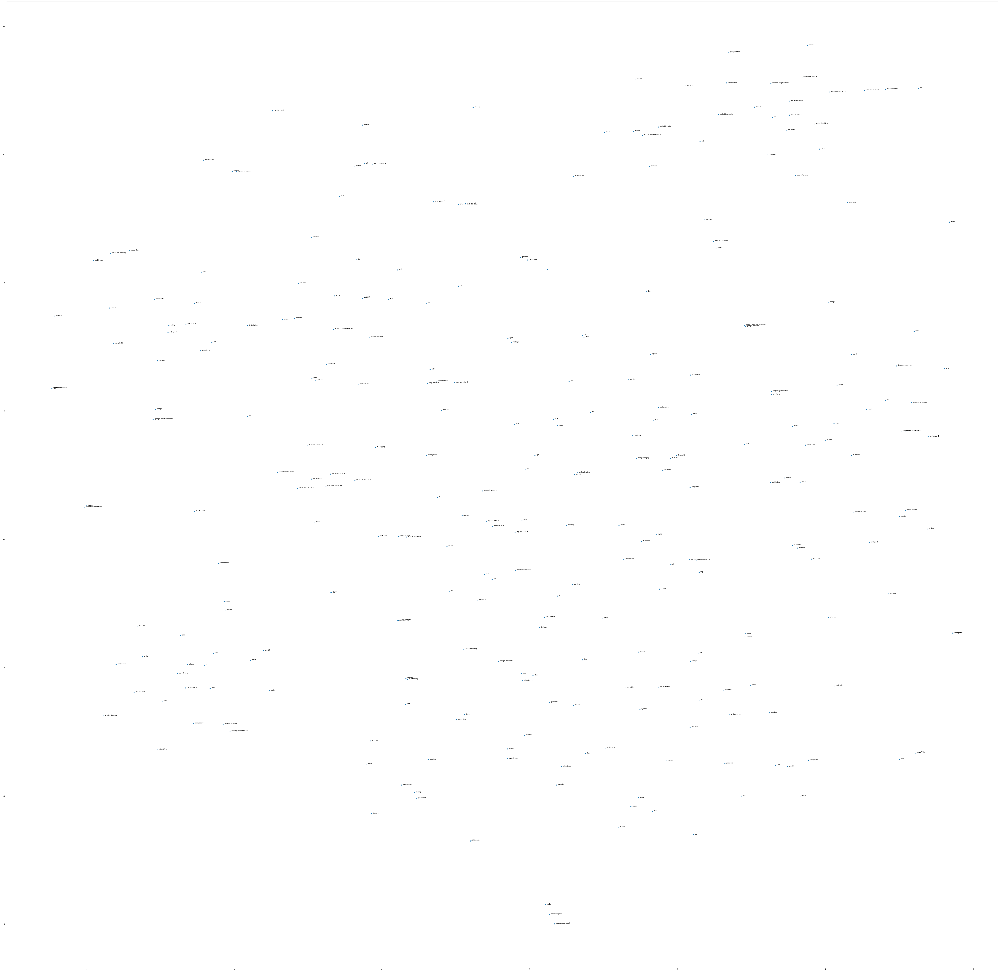

In [79]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


In [80]:
tsne=TSNE(perplexity= 5,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [81]:
sne_values=tsne.fit_transform(decomposed_values,)

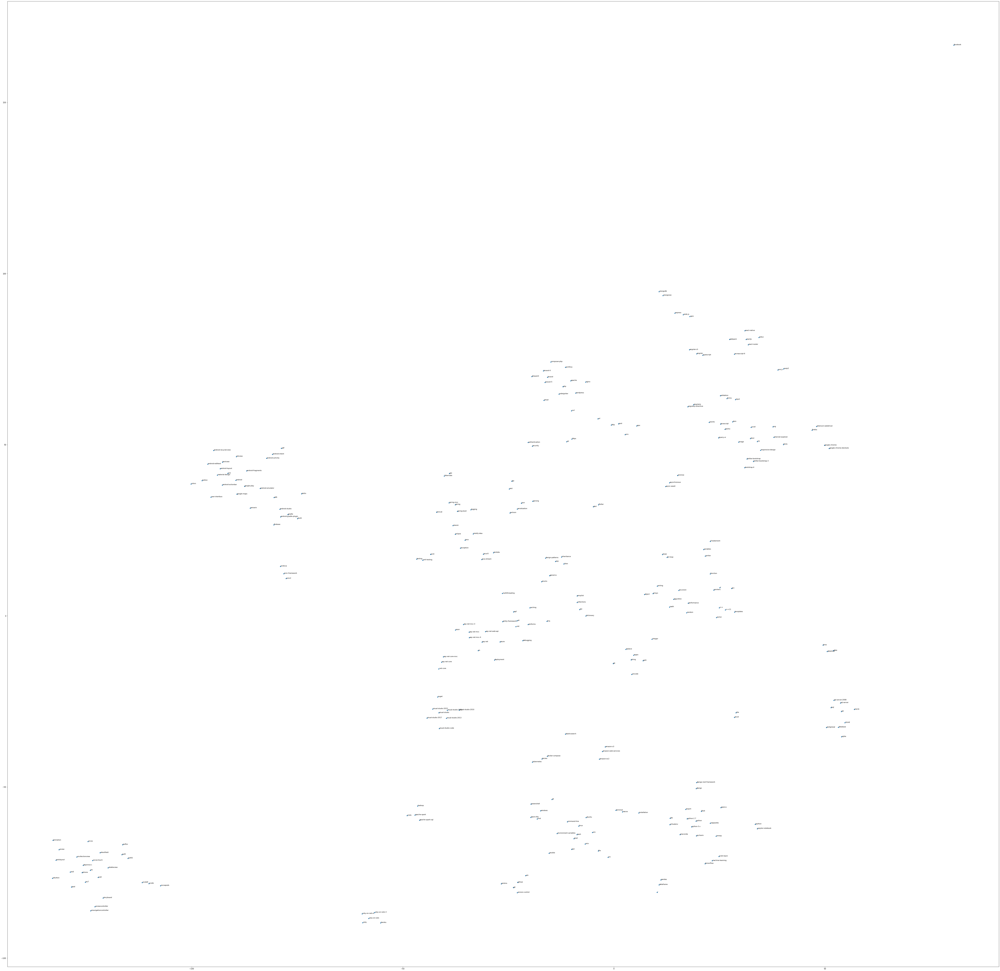

In [82]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


On remarque que la visualisation la plus clusterisé est celle pour une perplexité de 5. On garde celle ci et pour aider à mesurer sa qualité on utilise des algorithme de clusterisation pour colorer les points.

In [83]:
tsne=TSNE(perplexity= 5,early_exaggeration=100,learning_rate=25,n_iter=400000,init='pca',n_iter_without_progress=500,random_state=2,n_jobs=-1)

In [84]:
sne_values=tsne.fit_transform(decomposed_values,)

In [85]:
import sklearn
sorted(sklearn.neighbors.VALID_METRICS['brute'])

['braycurtis',
 'canberra',
 'chebyshev',
 'cityblock',
 'correlation',
 'cosine',
 'cosine',
 'dice',
 'euclidean',
 'hamming',
 'haversine',
 'jaccard',
 'kulsinski',
 'l1',
 'l2',
 'mahalanobis',
 'manhattan',
 'matching',
 'minkowski',
 'nan_euclidean',
 'precomputed',
 'rogerstanimoto',
 'russellrao',
 'seuclidean',
 'sokalmichener',
 'sokalsneath',
 'sqeuclidean',
 'wminkowski',
 'yule']

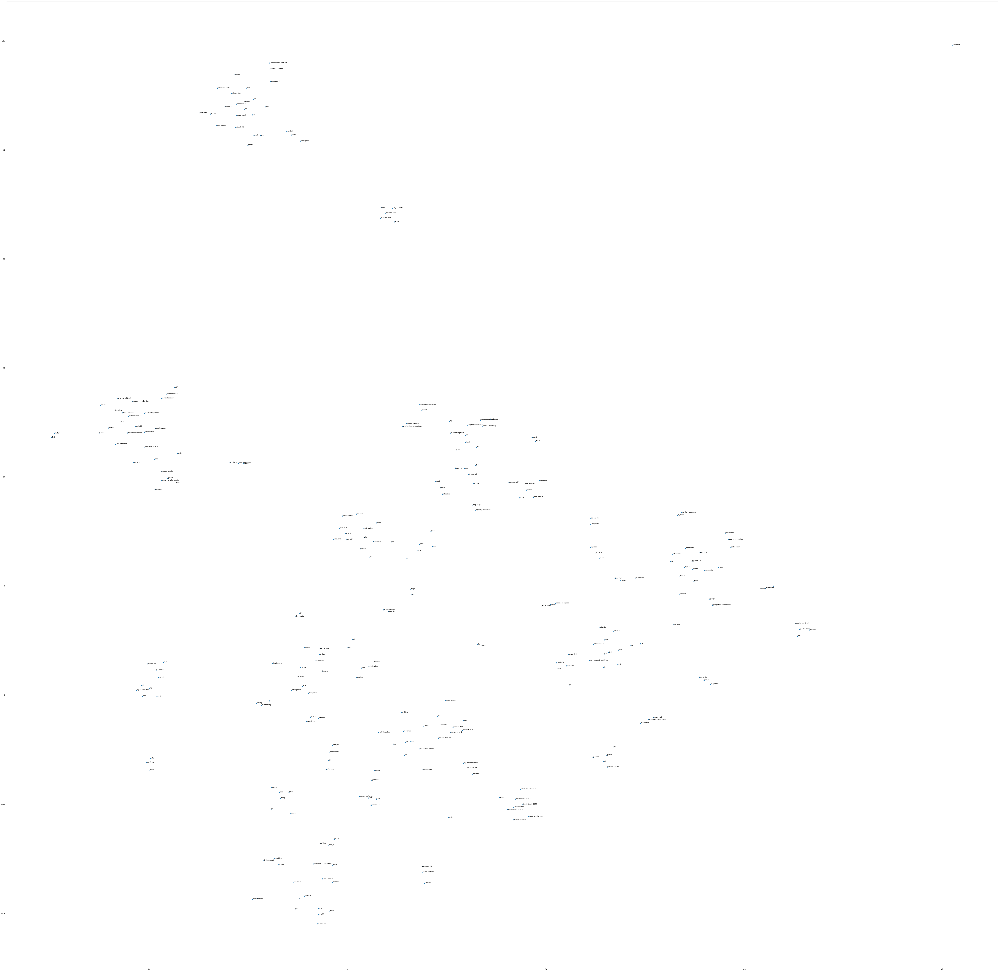

In [86]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


Sur les deux graphiques ci-dessus on voit déjà certains cluster, notamment autour de l'univers python avec plusieurs framework, bibliothèques et outils autour de "python".

In [87]:
cluster_df=pd.DataFrame({'x':sne_values[:,0],'y':sne_values[:,1],'keyword':tags_frequency_mf[tags_frequency_mf>=100].keys()})

In [88]:
cluster_df

,x,y,keyword
0,30.671577,25.599470,javascript
1,-53.286926,36.557556,android
2,-11.262023,-22.967218,java
3,86.963226,3.865454,python
4,-25.810354,109.352776,ios
...,...,...,...
287,-4.524613,-74.495636,vector
288,-26.057386,28.078569,ionic2
289,-7.510384,-77.412910,templates
290,31.825905,23.499359,events


In [89]:
tags_frequency_mf[tags_frequency_mf>10]

javascript           7916.0
android              7281.0
java                 6384.0
python               6249.0
ios                  4708.0
                      ...  
registry               11.0
scanf                  11.0
wsdl                   11.0
windows-phone-8.1      11.0
web-crawler            11.0
Length: 1040, dtype: float64

In [90]:
tags_frequency_mf.index[:20]

Index(['javascript', 'android', 'java', 'python', 'ios', 'c#', 'html', 'css',
       'php', 'jquery', 'swift', 'c++', 'node.js', 'objective-c', 'git',
       'angular', 'angularjs', 'xcode', 'reactjs', 'arrays'],
      dtype='object')

In [91]:
spec_clust=SpectralClustering(n_clusters=20)

In [92]:
spec_df=cluster_df.copy()
spec_df['label']=spec_clust.fit_predict(cluster_df[['x','y']])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:301: ConvergenceWarning: Number of distinct clusters (10) found smaller than n_clusters (20). Possibly due to duplicate points in X.
  ).fit(X, sample_weight=sample_weight)


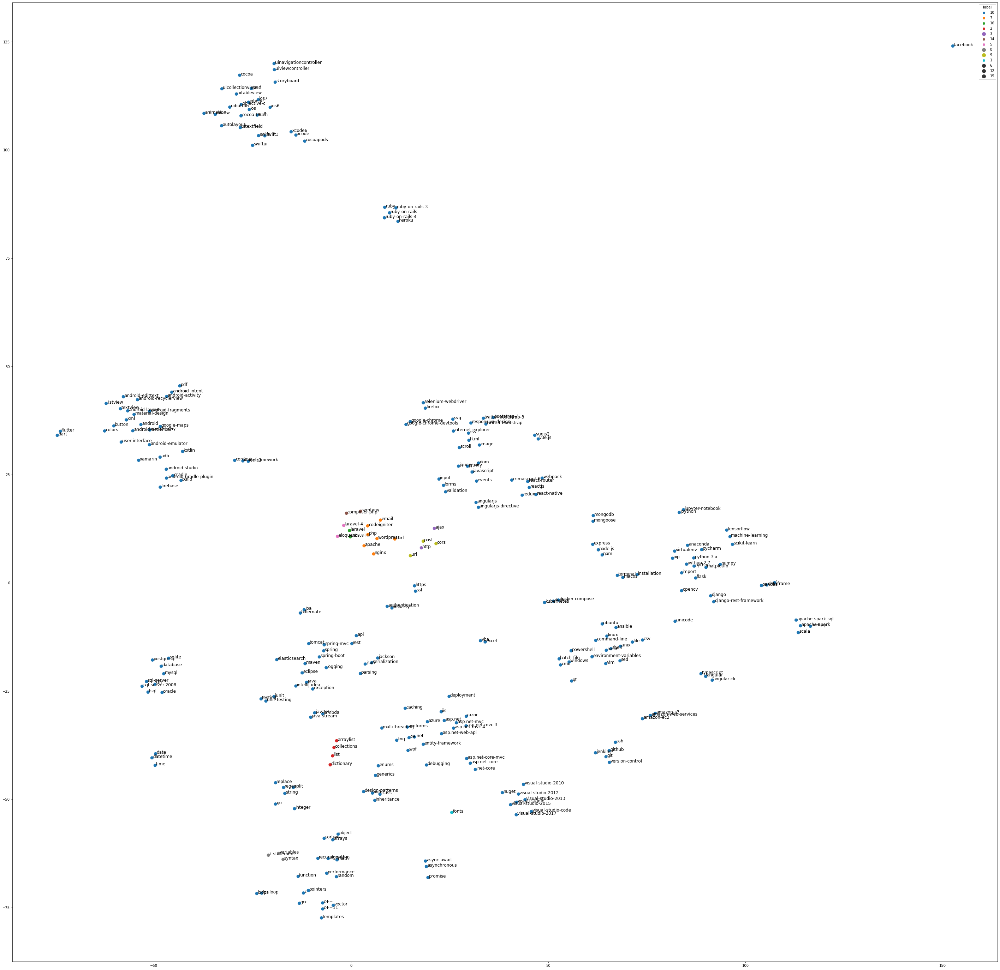

In [93]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=spec_df.label,sizes=(100,100),hue=spec_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [94]:
agg_ward_df=cluster_df.copy()
agg_clus_ward=AgglomerativeClustering(n_clusters=20)
agg_ward_df['label']=agg_clus_ward.fit_predict(cluster_df[['x','y']])

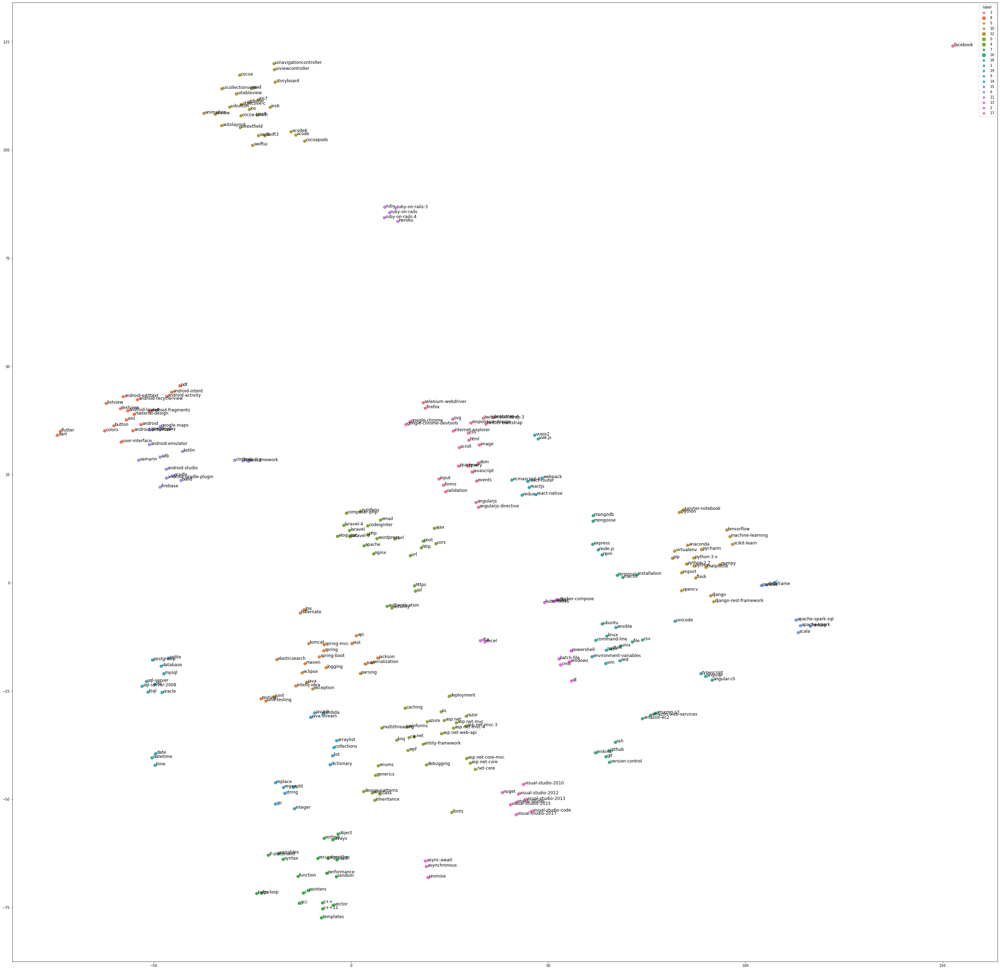

In [95]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=agg_ward_df.label,sizes=(100,100),hue=agg_ward_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [96]:
agg_avg_df=cluster_df.copy()
agg_clus_avg=AgglomerativeClustering(n_clusters=20,linkage='average',affinity='cosine')
agg_avg_df['label']=agg_clus_avg.fit_predict(cluster_df[['x','y']])

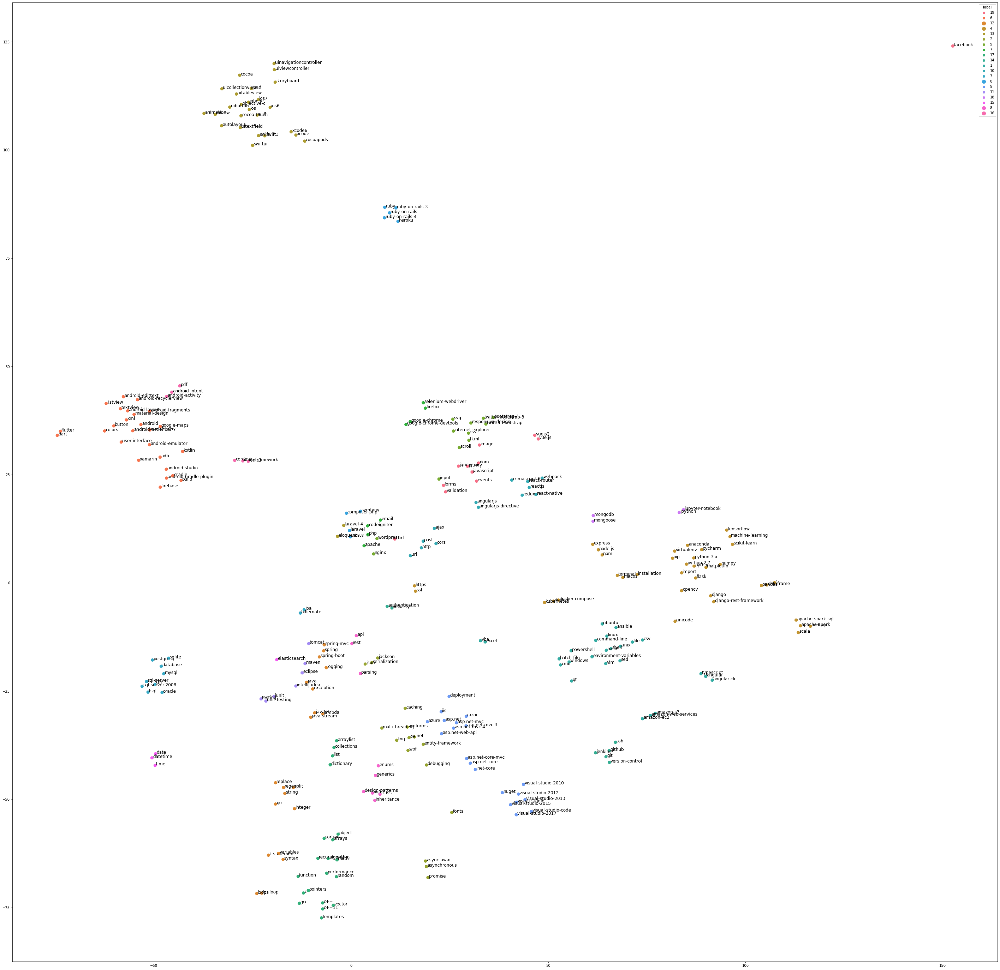

In [97]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=agg_avg_df.label,sizes=(100,100),hue=agg_avg_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [98]:
db_euc_df=cluster_df.copy()
db_euc=DBSCAN(eps=2,min_samples=3,)
db_euc_df['label']=db_euc.fit_predict(cluster_df[['x','y']])

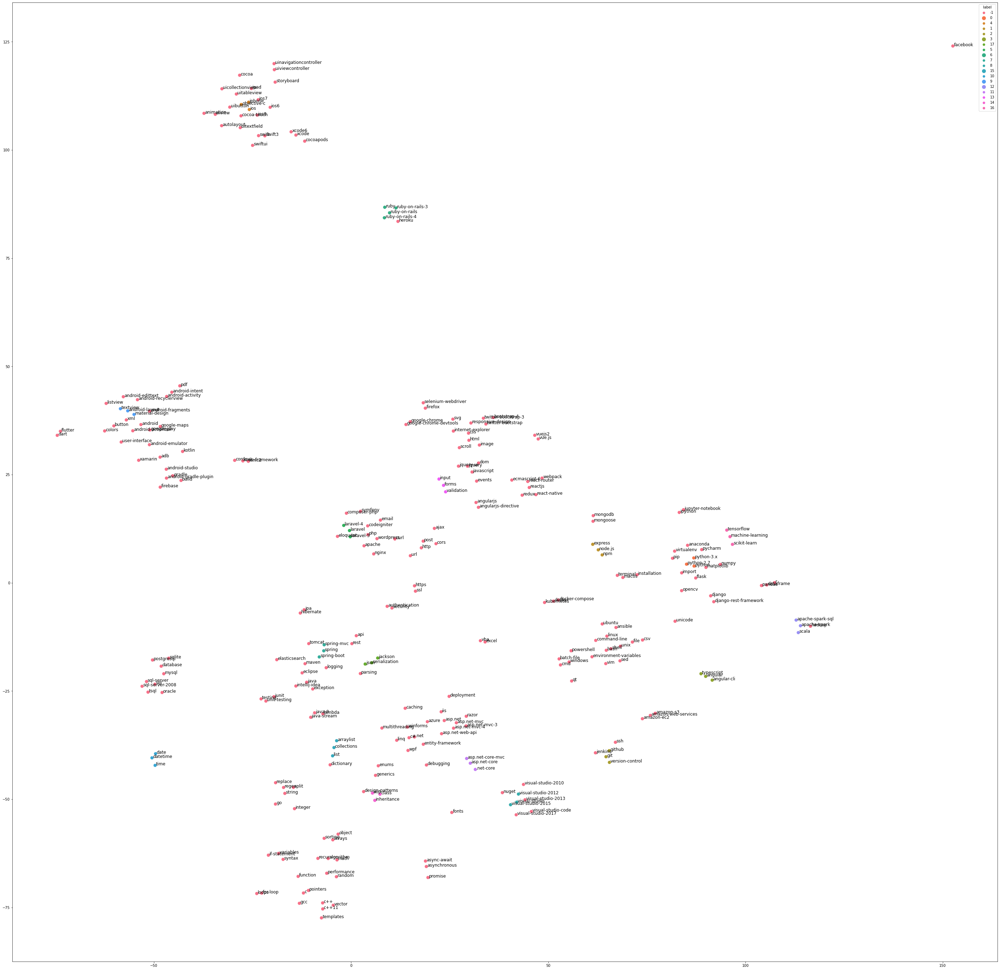

In [99]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=db_euc_df.label,sizes=(100,100),hue=db_euc_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [100]:
db_cos_df=cluster_df.copy()
db_cos=DBSCAN(eps=10,min_samples=3,)
db_cos_df['label']=db_cos.fit_predict(cluster_df[['x','y']])

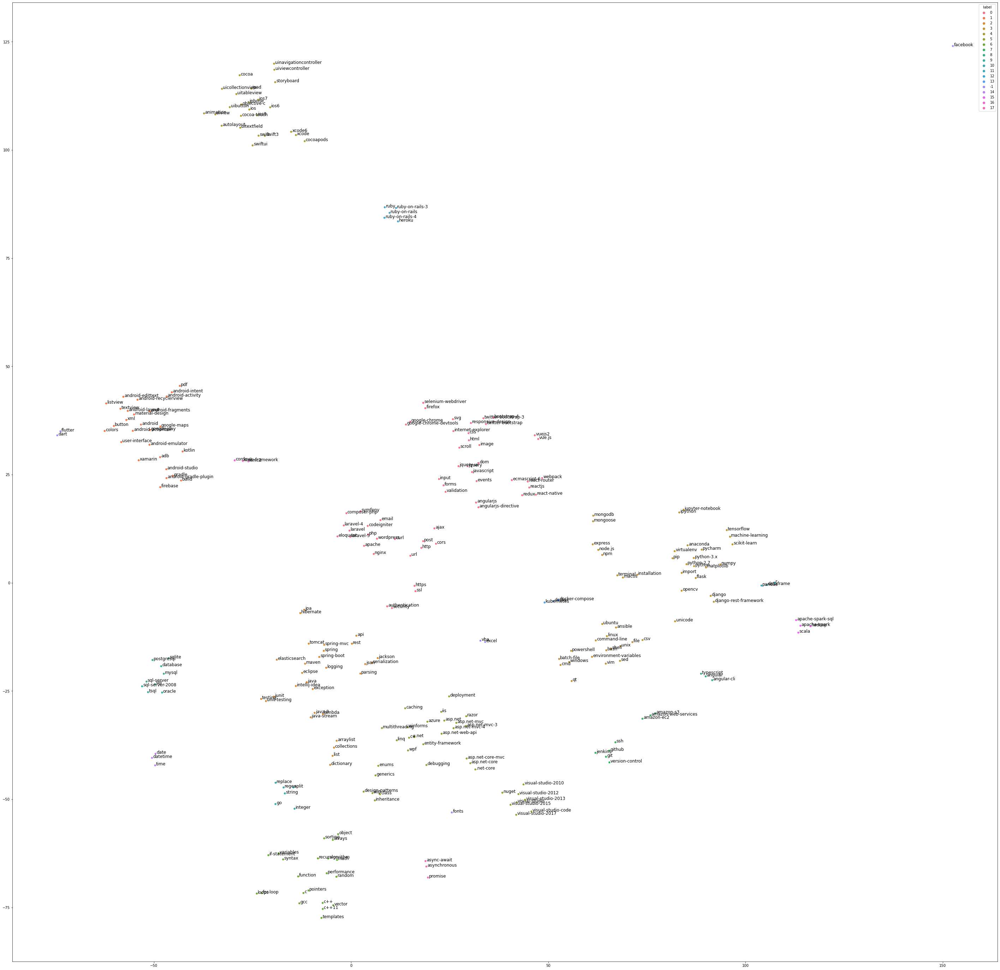

In [101]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],hue=db_cos_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


La clusterisation par affinitypropagation semble faire très peu d'erreur sur les thèmes proches.

In [102]:
aff_df=cluster_df.copy()
affprop= AffinityPropagation(random_state=2,max_iter=1000,)
aff_df['label']=affprop.fit_predict(cluster_df[['x','y']])
cluster_centers_indices = affprop.cluster_centers_indices_

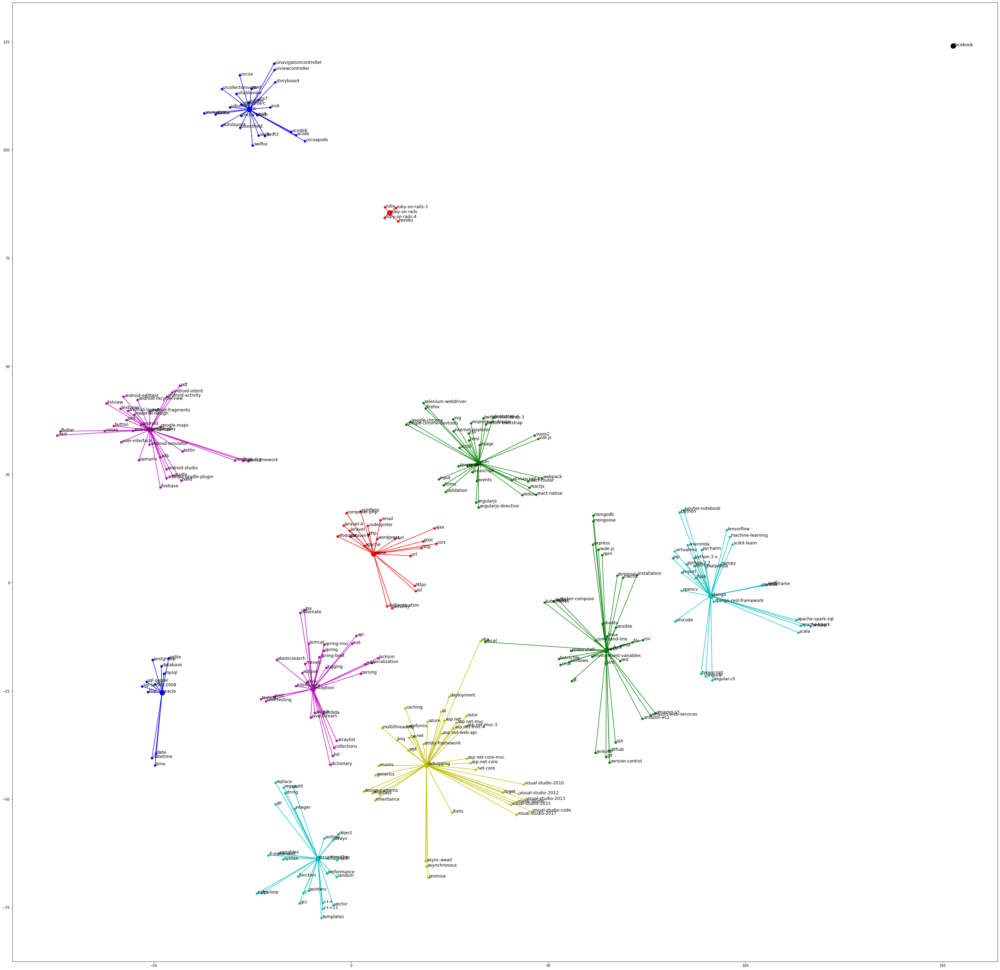

In [103]:
from itertools import cycle
colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
hue_colors=[col for k,col in zip(aff_df.label.unique(),colors)]
fig,ax = plt.subplots(figsize=(50,50))
#ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],hue=[hue_colors[i] for i in aff_df.label])
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)
for k,col in zip(range(aff_df.label.nunique()),colors):
    class_members = aff_df.label == k
    cluster_center = sne_values[cluster_centers_indices[k]]
    plt.plot(cluster_center[0], cluster_center[1], 'o',c=[hue_colors[i] for i in aff_df.label[class_members]][0],
              markersize=14)
    for x in sne_values[class_members]:
        plt.plot(x[0],x[1],marker='o',c=[hue_colors[i] for i in aff_df.label[class_members]][0])
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]],c=[hue_colors[i] for i in aff_df.label[class_members]][0])


In [104]:
pd.Series(tag_similarity_df).apply(len)

javascript       8971222
android         10920455
java             8350619
python           7302791
ios              5675032
                  ...   
vector            104034
ionic2             85972
templates         122312
events            115693
scikit-learn      149579
Length: 292, dtype: int64

In [105]:
query['Body_Trigrams'].head()

0    [(how, can, i), (can, i, get), (i, get, react)...
1    [(in, following, example), (following, example...
2    [(let, s, say), (s, say, i), (say, i, have), (...
3    [(i, have, a), (have, a, multi), (a, multi, pr...
4    [(if, i, declare), (i, declare, an), (declare,...
Name: Body_Trigrams, dtype: object

In [106]:
tag_similarity_df_words=pd.Series(tag_similarity_df).apply(str).apply(str.lower).apply(Toknzr.tokenize)

In [107]:
tag_similarity_df_words

javascript      [how, can, i, get, react, to, re, render, the,...
android         [i, have, a, multi, project, 10, modules, of, ...
java            [i, have, intellij, ultimate, 11, 1, with, the...
python          [if, ones, catches, an, exception, outside, of...
ios             [i, ve, been, trying, to, find, some, informat...
                                      ...                        
vector          [over, the, past, few, days, i, have, been, pr...
ionic2          [i, m, trying, to, implement, a, ngmodel, on, ...
templates       [how, can, i, output, the, value, of, an, enum...
events          [how, can, i, catch, the, event, of, the, wind...
scikit-learn    [i, want, to, plot, a, confusion, matrix, to, ...
Length: 292, dtype: object

In [108]:
frequency_by_tag=dict()
frequency_by_tag={i:nltk.FreqDist(tag_similarity_df_words[i]) for i in tag_similarity_df_words.index}


        

word_frequency_tags=dict()
for idx in tag_similarity_df_words.index:
    word_frequency_tags[idx]=dict()
    for key,value in frequency_by_tag[idx].items():
        if key not in word_frequency_tags[idx].keys():
            word_frequency_tags[idx][key]=0
        word_frequency_tags[idx][key]+=value

    word_frequency_tags[idx]=pd.Series(word_frequency_tags[idx]).sort_values(ascending=False)


In [109]:
for i in word_frequency_tags.keys(): 
    if 'android' in word_frequency_tags[i][:10]:
        print(i,'\n\n',word_frequency_tags[i][:20],4*'\n')

android 

 n          99220
android    38106
the        35749
i          32225
to         23973
is         13702
a          12758
and        11839
in         11358
this       10978
it          9971
com         8248
my          7816
0           7302
of          7202
java        6952
app         6834
id          6551
for         6283
but         6272
dtype: int64 




android-studio 

 n          7140
i          3944
android    3761
the        3630
to         2869
and        1511
com        1447
in         1400
0          1361
is         1273
studio     1267
1          1211
it         1170
a          1140
gradle     1111
java       1104
this       1053
my         1018
project    1014
build       952
dtype: int64 




gradle 

 n          7976
i          2464
the        2403
to         2049
android    1960
gradle     1895
0          1477
1          1424
com        1390
build      1149
and         951
is          902
in          884
a           873
project     862
2           828
this     

In [110]:
frequency_by_tag

{'javascript': FreqDist({'n': 83173, 'the': 35712, 'i': 34063, 'to': 24994, 'a': 19350, 'is': 15082, 'this': 14314, 'in': 11497, 'and': 11356, 'it': 10366, ...}),
 'android': FreqDist({'n': 99220, 'android': 38106, 'the': 35749, 'i': 32225, 'to': 23973, 'is': 13702, 'a': 12758, 'and': 11839, 'in': 11358, 'this': 10978, ...}),
 'java': FreqDist({'n': 69227, 'i': 27672, 'the': 27594, 'to': 19966, 'a': 14897, 'is': 12773, 'java': 10954, 'and': 10206, 'in': 9880, 'this': 9088, ...}),
 'python': FreqDist({'n': 39257, 'i': 28662, 'the': 26393, 'to': 20443, 'a': 17236, 'in': 13531, 'is': 10706, 'and': 9787, '1': 9394, '0': 9252, ...}),
 'ios': FreqDist({'n': 32802, 'the': 26408, 'i': 20881, 'to': 16706, 'a': 10298, 'is': 9044, 'in': 8884, 'and': 8347, 'it': 6678, 'this': 6383, ...}),
 'c#': FreqDist({'n': 45629, 'the': 21141, 'i': 20011, 'to': 14799, 'a': 10841, 'is': 8424, 'in': 7228, 'and': 7066, 'this': 6697, 'it': 5839, ...}),
 'html': FreqDist({'n': 34904, 'the': 16233, 'i': 13265, 'to':

In [111]:
word_frequency_tags

{'javascript': n             83173
 the           35712
 i             34063
 to            24994
 a             19350
               ...  
 cposelect         1
 tableshape        1
 ntraceback        1
 gyp_main          1
 000023            1
 Length: 34591, dtype: int64,
 'android': n                           99220
 android                     38106
 the                         35749
 i                           32225
 to                          23973
                             ...  
 onruninbackground               1
 message_additional_box1x        1
 quitbtn                         1
 paramview                       1
 setexpandedtitlecolor           1
 Length: 41107, dtype: int64,
 'java': n                       69227
 i                       27672
 the                     27594
 to                      19966
 a                       14897
                         ...  
 nbut2                       1
 chromedriver_win32_2        1
 apology                     1
 desperation

In [112]:
query['Score'].describe(percentiles=np.arange(50)/50.)[3:900]

min         11.0
0%          11.0
2%          11.0
4%          12.0
6%          13.0
8%          13.0
10%         14.0
12%         15.0
14%         16.0
16%         16.0
18%         17.0
20%         18.0
22%         19.0
24%         20.0
26%         21.0
28%         22.0
30%         23.0
32%         24.0
34%         25.0
36%         26.0
38%         27.0
40%         28.0
42%         30.0
44%         31.0
46%         33.0
48%         34.0
50%         36.0
52%         38.0
54%         39.0
56%         42.0
58.0%       44.0
60%         46.0
62%         49.0
64%         52.0
66%         55.0
68%         58.0
70%         62.0
72%         66.0
74%         70.0
76%         76.0
78%         81.0
80%         88.0
82%         96.0
84%        105.0
86%        117.0
88%        130.0
90%        148.0
92%        171.0
94%        205.0
96%        263.0
98%        385.0
max      25340.0
Name: Score, dtype: float64

In [113]:
tags_frequency[set(tags_frequency.keys()).difference(set(common_tags.TagName))].sort_values(ascending=False)[:50]

android-support-library            148.0
homebrew                           133.0
null                               110.0
app-store-connect                  107.0
android-5.0-lollipop               103.0
ios-simulator                      101.0
android-design-library              99.0
sublimetext2                        98.0
android-actionbar-compat            95.0
font-awesome                        92.0
ios9                                92.0
xcode8                              88.0
xcode5                              87.0
virtualbox                          85.0
android-appcompat                   84.0
sublimetext                         83.0
xcode7                              83.0
angular2-routing                    77.0
keyboard-shortcuts                  74.0
google-maps-android-api-2           71.0
navigation-drawer                   69.0
jquery-select2                      68.0
bundler                             67.0
uitextview                          64.0
adt             

In [114]:
common_tags

,Id,TagName,Count,ExcerptPostId,WikiPostId,IsModeratorOnly,IsRequired
2,3,javascript,2187828,3624960,3607052,NaN,NaN
11,17,java,1761781,3624966,3607018,NaN,NaN
10,16,python,1678094,3624965,3607014,NaN,NaN
6,9,c#,1469621,3624962,3607007,NaN,NaN
4,5,php,1396289,3624936,3607050,NaN,NaN
...,...,...,...,...,...,...,...
770,21398,avfoundation,6024,5307733,5307732,NaN,NaN
398,2347,fork,6011,5251997,5251996,NaN,NaN
522,4557,c++-cli,6010,5289304,5289303,NaN,NaN
1161,120383,pug,6006,37911435,37911434,NaN,NaN


In [115]:
query

,AcceptedAnswerId,AnswerCount,Body,ClosedDate,CommentCount,CreationDate,FavoriteCount,Id,LastActivityDate,LastEditDate,...,all_paragraphs,Body_words,Title_words,Tag_list0,Tag_list1,Tag_list2,Tag_list3,Tag_list4,Body_Bigrams,Body_Trigrams
0,19014495.0,20,<p>How can I get React to re-render the view w...,NaN,0,2013-09-25 20:06:06,110,19014250,2020-07-21 08:11:10,2018-04-26 16:32:13,...,[How can I get React to re-render the view whe...,"[how, can, i, get, react, to, re, render, the,...","[rerender, view, on, browser, resize, with, re...",javascript,reactjs,resize,NaN,NaN,"[(how, can), (can, i), (i, get), (get, react),...","[(how, can, i), (can, i, get), (i, get, react)..."
1,10996278.0,6,<p>In following example:</p>\n\n<pre><code>Lin...,NaN,5,2012-06-12 12:00:50,3,10996237,2014-12-18 21:24:22,2012-06-12 12:01:34,...,"[In following example:, Line1 <br /> Line2, I'...","[in, following, example, line1, br, line2, i, ...","[what, is, the, alternative, to, br, if, i, wa...",html,css,NaN,NaN,NaN,"[(in, following), (following, example), (examp...","[(in, following, example), (following, example..."
2,10998419.0,5,<p>Let's say I have a develop branch. I create...,NaN,1,2012-06-12 12:01:21,6,10996248,2019-06-11 13:13:27,NaN,...,[Let's say I have a develop branch. I create a...,"[let, s, say, i, have, a, develop, branch, i, ...","[freezing, a, git, branch]",git,branch,git-branch,NaN,NaN,"[(let, s), (s, say), (say, i), (i, have), (hav...","[(let, s, say), (s, say, i), (say, i, have), (..."
3,19500539.0,28,<p>I have a multi-project (~10 modules) of whi...,NaN,12,2013-05-27 14:20:09,258,16775197,2020-10-06 09:14:07,2015-10-09 12:49:57,...,[I have a multi-project (~10 modules) of which...,"[i, have, a, multi, project, 10, modules, of, ...","[building, and, running, app, via, gradle, and...",android,gradle,android-studio,build.gradle,NaN,"[(i, have), (have, a), (a, multi), (multi, pro...","[(i, have, a), (have, a, multi), (a, multi, pr..."
4,10826907.0,5,<p>If I declare an object wrapped in a shared ...,NaN,11,2012-05-31 01:59:56,47,10826541,2020-01-22 19:45:14,2012-08-04 03:18:43,...,[If I declare an object wrapped in a shared po...,"[if, i, declare, an, object, wrapped, in, a, s...","[passing, shared, pointers, as, arguments]",c++,c++11,shared-ptr,c++-faq,NaN,"[(if, i), (i, declare), (declare, an), (an, ob...","[(if, i, declare), (i, declare, an), (declare,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95511,41657604.0,6,<p>I would like to develop a Google Cloud Func...,NaN,0,2016-08-07 07:19:47,4,38811882,2020-08-17 20:31:54,2020-02-20 17:32:33,...,[I would like to develop a Google Cloud Functi...,"[i, would, like, to, develop, a, google, cloud...","[possible, to, get, static, ip, address, for, ...",google-cloud-platform,google-cloud-functions,NaN,NaN,NaN,"[(i, would), (would, like), (like, to), (to, d...","[(i, would, like), (would, like, to), (like, t..."
95512,38812198.0,6,<p>I'm using RxJava and I want to combine 12 d...,NaN,1,2016-08-07 07:25:29,3,38811923,2019-11-20 08:55:33,2016-08-07 15:23:17,...,[I'm using RxJava and I want to combine 12 dif...,"[i, m, using, rxjava, and, i, want, to, combin...","[how, to, use, rxjava, combinelatest, operator...",java,rx-java,NaN,NaN,NaN,"[(i, m), (m, using), (using, rxjava), (rxjava,...","[(i, m, using), (m, using, rxjava), (using, rx..."
95514,22697189.0,11,<p>I was wondering what the difference between...,NaN,2,2014-03-27 19:13:16,102,22697049,2020-05-16 14:15:52,2014-12-28 01:15:20,...,[I was wondering what the difference between A...,"[i, was, wondering, what, the, difference, bet...","[what, is, the, difference, between, google, a...",google-app-engine,google-compute-engine,google-cloud-platform,NaN,NaN,"[(i, was), (was, wondering), (wondering, what)...","[(i, was, wondering), (was, wondering, what), ..."
95516,48105688.0,6,<p><strong>Context</strong>: I am trying to bu...,NaN,7,2017-12-26 23:03:33,6,47984603,2020-09-08 11:32:32,NaN,...,"[Context, 

In [116]:
frequency_by_tag

{'javascript': FreqDist({'n': 83173, 'the': 35712, 'i': 34063, 'to': 24994, 'a': 19350, 'is': 15082, 'this': 14314, 'in': 11497, 'and': 11356, 'it': 10366, ...}),
 'android': FreqDist({'n': 99220, 'android': 38106, 'the': 35749, 'i': 32225, 'to': 23973, 'is': 13702, 'a': 12758, 'and': 11839, 'in': 11358, 'this': 10978, ...}),
 'java': FreqDist({'n': 69227, 'i': 27672, 'the': 27594, 'to': 19966, 'a': 14897, 'is': 12773, 'java': 10954, 'and': 10206, 'in': 9880, 'this': 9088, ...}),
 'python': FreqDist({'n': 39257, 'i': 28662, 'the': 26393, 'to': 20443, 'a': 17236, 'in': 13531, 'is': 10706, 'and': 9787, '1': 9394, '0': 9252, ...}),
 'ios': FreqDist({'n': 32802, 'the': 26408, 'i': 20881, 'to': 16706, 'a': 10298, 'is': 9044, 'in': 8884, 'and': 8347, 'it': 6678, 'this': 6383, ...}),
 'c#': FreqDist({'n': 45629, 'the': 21141, 'i': 20011, 'to': 14799, 'a': 10841, 'is': 8424, 'in': 7228, 'and': 7066, 'this': 6697, 'it': 5839, ...}),
 'html': FreqDist({'n': 34904, 'the': 16233, 'i': 13265, 'to':

In [117]:
mean_word_length ={i:sum([len(j)*word_frequency_tags[i][j]/word_frequency_tags[i].sum() for j in word_frequency_tags[i].index])
                   for i in word_frequency_tags.keys()}

In [118]:
mean_word_length=pd.Series(mean_word_length).sort_values(ascending=False)

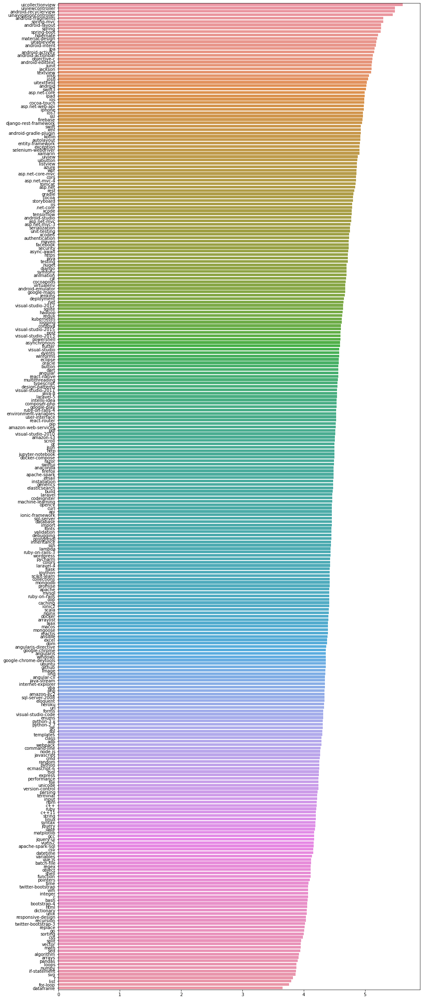

In [119]:
fig, ax = plt.subplots(figsize=(15,42))
ax= sns.barplot(y=mean_word_length.index,x=mean_word_length,orient='h')
plt.show()

In [120]:
pd.Series(tag_similarity_df).apply(str).to_csv('corpus_by_tag.csv',index=False)

In [121]:
query.columns

Index(['AcceptedAnswerId', 'AnswerCount', 'Body', 'ClosedDate', 'CommentCount',
       'CreationDate', 'FavoriteCount', 'Id', 'LastActivityDate',
       'LastEditDate', 'LastEditorDisplayName', 'LastEditorUserId',
       'OwnerUserId', 'Score', 'Tags', 'Title', 'ViewCount', 'Body_text',
       'first_paragraph_uncleaned', 'all_paragraphs', 'Body_words',
       'Title_words', 'Tag_list0', 'Tag_list1', 'Tag_list2', 'Tag_list3',
       'Tag_list4', 'Body_Bigrams', 'Body_Trigrams'],
      dtype='object')

In [122]:
query_to_export= query[['Id','CreationDate','AnswerCount', 'Body','CommentCount','FavoriteCount','Score',
                        'Title', 'ViewCount', 'Body_text',
                        'Tag_list0', 'Tag_list1', 'Tag_list2', 'Tag_list3',
                       'Tag_list4', ]]
query_to_export.to_csv("exported_query_df.csv",index=False)

In [123]:
len(frequency.keys())

71475

In [124]:
for i in frequency_by_tag.keys():
    frequency_by_tag[i]=pd.Series(frequency_by_tag[i])


In [125]:
for i in frequency_by_tag.keys():
    frequency_by_tag[i]=frequency_by_tag[i][frequency_by_tag[i]>50]
    for j in frequency_by_tag[i].keys():
        try:
            int(j)
        except:
            None
        else:
            print('deleting',str(j),'in',i)
            del frequency_by_tag[i][j]
        if len(j)==1 and j !="c" and j!='r':
            print('deleting',str(j),'in',i)
            try:        
                del frequency_by_tag[i][j]
            except:
                print('error, not found',j,'in',i)

deleting i in javascript
deleting s in javascript
deleting m in javascript
deleting a in javascript
deleting n in javascript
deleting p in javascript
deleting t in javascript
deleting d in javascript
deleting 2 in javascript
deleting 2 in javascript
error, not found 2 in javascript
deleting 000 in javascript
deleting 31 in javascript
deleting 2012 in javascript
deleting 08 in javascript
deleting 33 in javascript
deleting 1 in javascript
deleting 1 in javascript
error, not found 1 in javascript
deleting b in javascript
deleting 25 in javascript
deleting e in javascript
deleting 26 in javascript
deleting 32 in javascript
deleting j in javascript
deleting k in javascript
deleting 10 in javascript
deleting 0 in javascript
deleting 0 in javascript
error, not found 0 in javascript
deleting 5 in javascript
deleting 5 in javascript
error, not found 5 in javascript
deleting 9 in javascript
deleting 9 in javascript
error, not found 9 in javascript
deleting 3 in javascript
deleting 3 in javascrip

deleting 28 in python
deleting 01 in python
deleting 06 in python
deleting 14 in python
deleting 50 in python
deleting 02 in python
deleting 20 in python
deleting 05 in python
deleting 03 in python
deleting 04 in python
deleting 08 in python
deleting 52 in python
deleting 33 in python
deleting 255 in python
deleting u in python
deleting g in python
deleting q in python
deleting h in python
deleting 2013 in python
deleting 19 in python
deleting 24 in python
deleting 35 in python
deleting k in python
deleting f in python
deleting l in python
deleting 128 in python
deleting 11 in python
deleting o in python
deleting 31 in python
deleting 27 in python
deleting v in python
deleting 44 in python
deleting 60 in python
deleting 100 in python
deleting 400 in python
deleting 000 in python
deleting 18 in python
deleting 41 in python
deleting 42 in python
deleting 43 in python
deleting 30 in python
deleting 21 in python
deleting 90 in python
deleting 500 in python
deleting _ in python
deleting 37 

deleting z in jquery
deleting b in jquery
deleting d in jquery
deleting 1000 in jquery
deleting j in jquery
deleting 6 in jquery
deleting 6 in jquery
error, not found 6 in jquery
deleting 10 in jquery
deleting 00 in jquery
deleting 11 in jquery
deleting 5 in jquery
deleting 5 in jquery
error, not found 5 in jquery
deleting y in jquery
deleting 9 in jquery
deleting 9 in jquery
error, not found 9 in jquery
deleting 01 in jquery
deleting 12 in jquery
deleting 20 in jquery
deleting v in jquery
deleting 22 in jquery
deleting 200 in jquery
deleting 255 in jquery
deleting i in swift
deleting m in swift
deleting 7 in swift
deleting 7 in swift
error, not found 7 in swift
deleting a in swift
deleting s in swift
deleting d in swift
deleting 5 in swift
deleting 5 in swift
error, not found 5 in swift
deleting n in swift
deleting e in swift
deleting g in swift
deleting t in swift
deleting b in swift
deleting x in swift
deleting 13 in swift
deleting 3 in swift
deleting 3 in swift
error, not found 3 i

deleting 2013 in sql
deleting 50 in sql
deleting 30 in sql
deleting u in sql
deleting d in sql
deleting 03 in sql
deleting 07 in sql
deleting 06 in sql
deleting p in sql
deleting x in sql
deleting 08 in sql
deleting 21 in sql
deleting 13 in sql
deleting f in sql
deleting 05 in sql
deleting 02 in sql
deleting 04 in sql
deleting 18 in sql
deleting 2011 in sql
deleting 63 in sql
deleting i in .net
deleting m in .net
deleting a in .net
deleting t in .net
deleting s in .net
deleting n in .net
deleting 1 in .net
deleting 1 in .net
error, not found 1 in .net
deleting 2 in .net
deleting 2 in .net
error, not found 2 in .net
deleting 12 in .net
deleting 10 in .net
deleting 2012 in .net
deleting 2013 in .net
deleting 00 in .net
deleting d in .net
deleting 0 in .net
deleting 0 in .net
error, not found 0 in .net
deleting b in .net
deleting 4 in .net
deleting 4 in .net
error, not found 4 in .net
deleting 5 in .net
deleting 5 in .net
error, not found 5 in .net
deleting e in .net
deleting 7 in .net
de

deleting 6 in asp.net
deleting 6 in asp.net
error, not found 6 in asp.net
deleting 10 in asp.net
deleting 8 in asp.net
deleting 8 in asp.net
error, not found 8 in asp.net
deleting t in asp.net
deleting 2012 in asp.net
deleting d in asp.net
deleting x in asp.net
deleting 4 in asp.net
deleting 4 in asp.net
error, not found 4 in asp.net
deleting 2013 in asp.net
deleting i in spring
deleting t in spring
deleting s in spring
deleting a in spring
deleting n in spring
deleting 0 in spring
deleting 0 in spring
error, not found 0 in spring
deleting 3 in spring
deleting 3 in spring
error, not found 3 in spring
deleting 1 in spring
deleting 1 in spring
error, not found 1 in spring
deleting d in spring
deleting m in spring
deleting 2 in spring
deleting 2 in spring
error, not found 2 in spring
deleting e in spring
deleting 6 in spring
deleting 6 in spring
error, not found 6 in spring
deleting 5 in spring
deleting 5 in spring
error, not found 5 in spring
deleting x in spring
deleting p in spring
del

deleting m in intellij-idea
deleting 8 in intellij-idea
deleting 8 in intellij-idea
error, not found 8 in intellij-idea
deleting 6 in intellij-idea
deleting 6 in intellij-idea
error, not found 6 in intellij-idea
deleting 3 in intellij-idea
deleting 3 in intellij-idea
error, not found 3 in intellij-idea
deleting 4 in intellij-idea
deleting 4 in intellij-idea
error, not found 4 in intellij-idea
deleting 7 in intellij-idea
deleting 7 in intellij-idea
error, not found 7 in intellij-idea
deleting 10 in intellij-idea
deleting 12 in intellij-idea
deleting 0 in intellij-idea
deleting 0 in intellij-idea
error, not found 0 in intellij-idea
deleting a in mongodb
deleting 1 in mongodb
deleting 1 in mongodb
error, not found 1 in mongodb
deleting 2 in mongodb
deleting 2 in mongodb
error, not found 2 in mongodb
deleting 3 in mongodb
deleting 3 in mongodb
error, not found 3 in mongodb
deleting i in mongodb
deleting m in mongodb
deleting 127 in mongodb
deleting 0 in mongodb
deleting 0 in mongodb
error,

deleting s in maven
deleting t in maven
deleting 4 in maven
deleting 4 in maven
error, not found 4 in maven
deleting 0 in maven
deleting 0 in maven
error, not found 0 in maven
deleting 2 in maven
deleting 2 in maven
error, not found 2 in maven
deleting 8 in maven
deleting 8 in maven
error, not found 8 in maven
deleting 1 in maven
deleting 1 in maven
error, not found 1 in maven
deleting 3 in maven
deleting 3 in maven
error, not found 3 in maven
deleting 5 in maven
deleting 5 in maven
error, not found 5 in maven
deleting n in maven
deleting 6 in maven
deleting 6 in maven
error, not found 6 in maven
deleting 7 in maven
deleting 7 in maven
error, not found 7 in maven
deleting 10 in maven
deleting i in ubuntu
deleting a in ubuntu
deleting n in ubuntu
deleting 0 in ubuntu
deleting 0 in ubuntu
error, not found 0 in ubuntu
deleting 9 in ubuntu
deleting 9 in ubuntu
error, not found 9 in ubuntu
deleting 16 in ubuntu
deleting 7 in ubuntu
deleting 7 in ubuntu
error, not found 7 in ubuntu
deleting 

deleting 0 in ios7
error, not found 0 in ios7
deleting 5 in ios7
deleting 5 in ios7
error, not found 5 in ios7
deleting t in ios7
deleting n in ios7
deleting 1 in ios7
deleting 1 in ios7
error, not found 1 in ios7
deleting 2 in ios7
deleting 2 in ios7
error, not found 2 in ios7
deleting 6 in ios7
deleting 6 in ios7
error, not found 6 in ios7
deleting i in express
deleting t in express
deleting a in express
deleting s in express
deleting n in express
deleting 0 in express
deleting 0 in express
error, not found 0 in express
deleting m in express
deleting 1 in express
deleting 1 in express
error, not found 1 in express
deleting 3 in express
deleting 3 in express
error, not found 3 in express
deleting 5 in express
deleting 5 in express
error, not found 5 in express
deleting 2 in express
deleting 2 in express
error, not found 2 in express
deleting 3000 in express
deleting 4 in express
deleting 4 in express
error, not found 4 in express
deleting i in excel
deleting s in excel
deleting a in e

deleting 1 in apache-spark
error, not found 1 in apache-spark
deleting a in apache-spark
deleting i in apache-spark
deleting m in apache-spark
deleting t in apache-spark
deleting s in apache-spark
deleting n in apache-spark
deleting 2 in apache-spark
deleting 2 in apache-spark
error, not found 2 in apache-spark
deleting 5 in apache-spark
deleting 5 in apache-spark
error, not found 5 in apache-spark
deleting 3 in apache-spark
deleting 3 in apache-spark
error, not found 3 in apache-spark
deleting 4 in apache-spark
deleting 4 in apache-spark
error, not found 4 in apache-spark
deleting 10 in apache-spark
deleting 6 in apache-spark
deleting 6 in apache-spark
error, not found 6 in apache-spark
deleting i in xml
deleting a in xml
deleting 1 in xml
deleting 1 in xml
error, not found 1 in xml
deleting 0 in xml
deleting 0 in xml
error, not found 0 in xml
deleting 8 in xml
deleting 8 in xml
error, not found 8 in xml
deleting n in xml
deleting s in xml
deleting m in xml
deleting 2 in xml
deleting 

deleting 2 in command-line
deleting 2 in command-line
error, not found 2 in command-line
deleting 3 in command-line
deleting 3 in command-line
error, not found 3 in command-line
deleting 0 in command-line
deleting 0 in command-line
error, not found 0 in command-line
deleting i in tsql
deleting a in tsql
deleting t in tsql
deleting 1 in tsql
deleting 1 in tsql
error, not found 1 in tsql
deleting 2 in tsql
deleting 2 in tsql
error, not found 2 in tsql
deleting 3 in tsql
deleting 3 in tsql
error, not found 3 in tsql
deleting n in tsql
deleting 10 in tsql
deleting m in tsql
deleting 0 in tsql
deleting 0 in tsql
error, not found 0 in tsql
deleting 00 in tsql
deleting i in ssh
deleting a in ssh
deleting s in ssh
deleting m in ssh
deleting 1 in ssh
deleting 1 in ssh
error, not found 1 in ssh
deleting 0 in ssh
deleting 0 in ssh
error, not found 0 in ssh
deleting n in ssh
deleting t in ssh
deleting 10 in ssh
deleting 2 in ssh
deleting 2 in ssh
error, not found 2 in ssh
deleting i in vba
deletin

deleting 5 in if-statement
error, not found 5 in if-statement
deleting 3 in if-statement
deleting 3 in if-statement
error, not found 3 in if-statement
deleting m in if-statement
deleting i in kubernetes
deleting m in kubernetes
deleting 2 in kubernetes
deleting 2 in kubernetes
error, not found 2 in kubernetes
deleting a in kubernetes
deleting 1 in kubernetes
deleting 1 in kubernetes
error, not found 1 in kubernetes
deleting 3 in kubernetes
deleting 3 in kubernetes
error, not found 3 in kubernetes
deleting t in kubernetes
deleting n in kubernetes
deleting 0 in kubernetes
deleting 0 in kubernetes
error, not found 0 in kubernetes
deleting 503 in kubernetes
deleting i in material-design
deleting a in material-design
deleting t in material-design
deleting n in material-design
deleting 1 in material-design
deleting 1 in material-design
error, not found 1 in material-design
deleting s in material-design
deleting m in material-design
deleting 0 in material-design
deleting 0 in material-design


deleting a in swift3
deleting i in swift3
deleting n in swift3
deleting 2 in swift3
deleting 2 in swift3
error, not found 2 in swift3
deleting m in swift3
deleting 0 in swift3
deleting 0 in swift3
error, not found 0 in swift3
deleting 3 in swift3
deleting 3 in swift3
error, not found 3 in swift3
deleting i in for-loop
deleting a in for-loop
deleting 1 in for-loop
deleting 1 in for-loop
error, not found 1 in for-loop
deleting 2 in for-loop
deleting 2 in for-loop
error, not found 2 in for-loop
deleting 3 in for-loop
deleting 3 in for-loop
error, not found 3 in for-loop
deleting n in for-loop
deleting 0 in for-loop
deleting 0 in for-loop
error, not found 0 in for-loop
deleting t in for-loop
deleting 5 in for-loop
deleting 5 in for-loop
error, not found 5 in for-loop
deleting j in for-loop
deleting x in for-loop
deleting i in nginx
deleting a in nginx
deleting t in nginx
deleting 10 in nginx
deleting 0 in nginx
deleting 0 in nginx
error, not found 0 in nginx
deleting 1 in nginx
deleting 1 

deleting a in import
deleting t in import
deleting n in import
deleting m in import
deleting 0 in import
deleting 0 in import
error, not found 0 in import
deleting 1 in import
deleting 1 in import
error, not found 1 in import
deleting 2 in import
deleting 2 in import
error, not found 2 in import
deleting 7 in import
deleting 7 in import
error, not found 7 in import
deleting i in curl
deleting a in curl
deleting 1 in curl
deleting 1 in curl
error, not found 1 in curl
deleting 2 in curl
deleting 2 in curl
error, not found 2 in curl
deleting 3 in curl
deleting 3 in curl
error, not found 3 in curl
deleting n in curl
deleting 0 in curl
deleting 0 in curl
error, not found 0 in curl
deleting m in curl
deleting s in curl
deleting t in curl
deleting 7 in curl
deleting 7 in curl
error, not found 7 in curl
deleting x in curl
deleting 3 in pycharm
deleting 3 in pycharm
error, not found 3 in pycharm
deleting i in pycharm
deleting a in pycharm
deleting n in pycharm
deleting m in pycharm
deleting 1 i

deleting 0 in animation
deleting 0 in animation
error, not found 0 in animation
deleting t in animation
deleting n in animation
deleting 1 in animation
deleting 1 in animation
error, not found 1 in animation
deleting a in animation
deleting i in scroll
deleting m in scroll
deleting n in scroll
deleting a in scroll
deleting 0 in scroll
deleting 0 in scroll
error, not found 0 in scroll
deleting t in scroll
deleting i in redux
deleting t in redux
deleting m in redux
deleting n in redux
deleting a in redux
deleting i in serialization
deleting n in serialization
deleting a in serialization
deleting 1 in serialization
deleting 1 in serialization
error, not found 1 in serialization
deleting s in serialization
deleting m in serialization
deleting t in serialization
deleting a in vuejs2
deleting i in vuejs2
deleting n in vuejs2
deleting v in vuejs2
deleting t in vuejs2
deleting 2 in vuejs2
deleting 2 in vuejs2
error, not found 2 in vuejs2
deleting a in version-control
deleting i in version-cont

In [126]:
frequency_by_tag

{'javascript': how              4013
 can              4761
 get              2967
 react            1948
 to              24994
                 ...  
 usestate           74
 useeffect          58
 jest              127
 handlechange       51
 ngulp              53
 Length: 1659, dtype: int64,
 'android': have              5588
 project           2354
 modules            141
 of                7202
 which             1990
                   ... 
 navigationview      88
 runners             51
 datasnapshot        56
 xa0at               85
 awt                 51
 Length: 1841, dtype: int64,
 'java': have         4894
 intellij      393
 with         4153
 the         27594
 scala         227
             ...  
 gdx            63
 docker         68
 spark          55
 okhttp         54
 firebase       94
 Length: 1626, dtype: int64,
 'python': if           3788
 ones           61
 an           2474
 exception     346
 outside        52
              ... 
 asyncio        79
 anaconda2 

.htaccess 



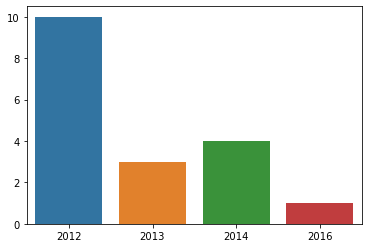

-------------------- 



.net 



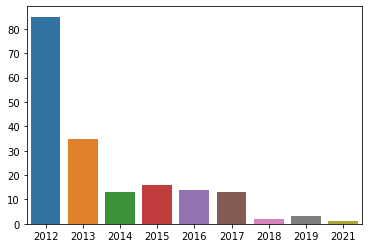

-------------------- 



.net-core 



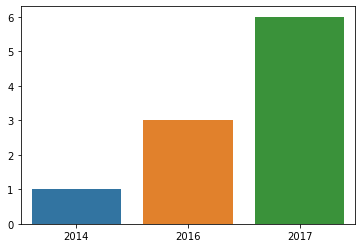

-------------------- 



active-directory 



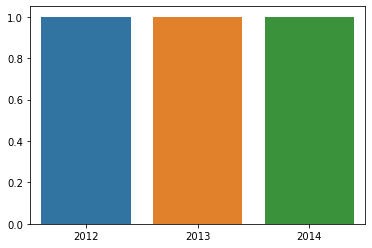

-------------------- 



activerecord 



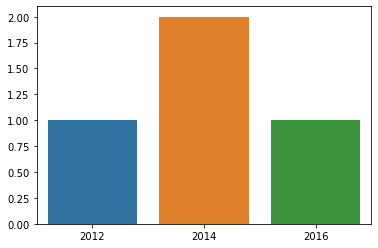

-------------------- 



ag-grid 



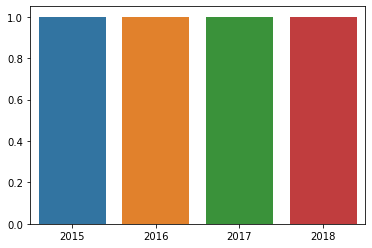

-------------------- 



airflow 



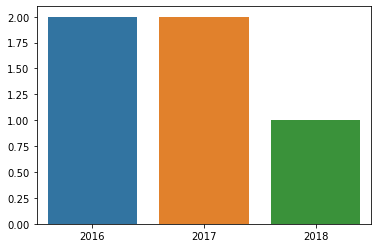

-------------------- 



ajax 



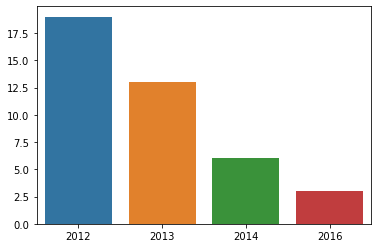

-------------------- 



algorithm 



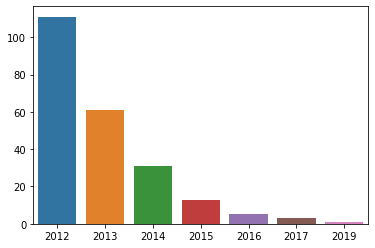

-------------------- 



amazon-dynamodb 



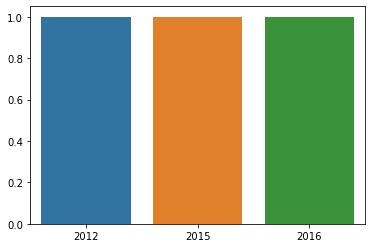

-------------------- 



amazon-ec2 



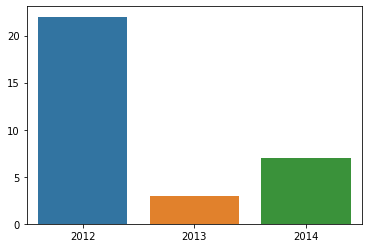

-------------------- 



amazon-redshift 



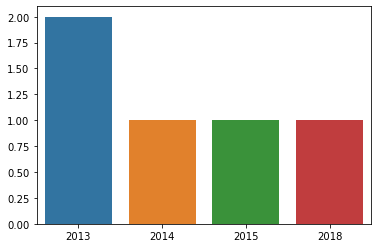

-------------------- 



amazon-s3 



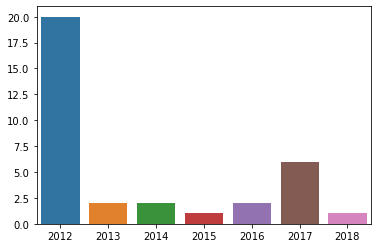

-------------------- 



amazon-web-services 



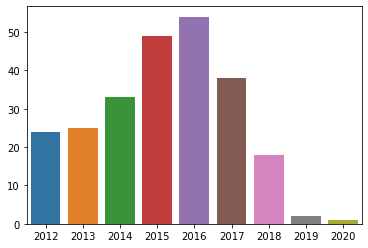

-------------------- 



anaconda 



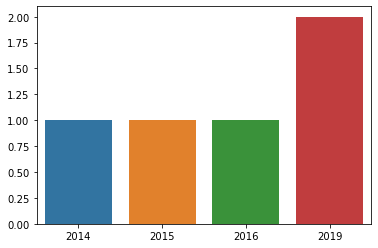

-------------------- 



android 



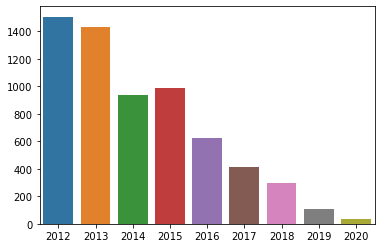

-------------------- 



android-emulator 



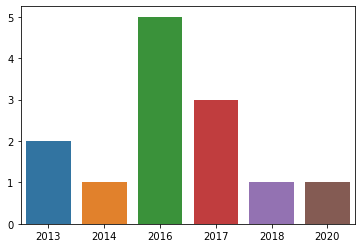

-------------------- 



android-studio 



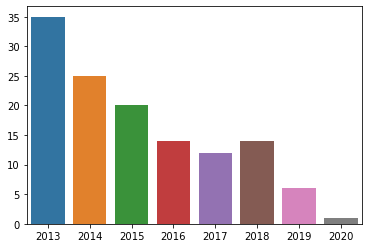

-------------------- 



angular 



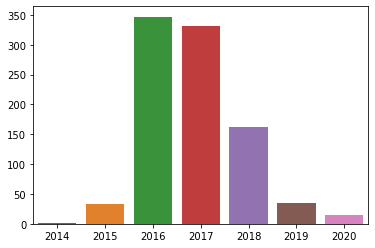

-------------------- 



angular-cli 



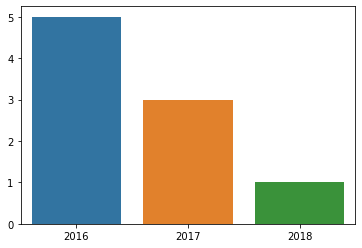

-------------------- 



angularjs 



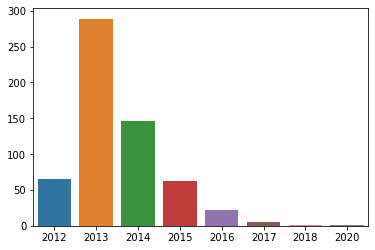

-------------------- 



animation 



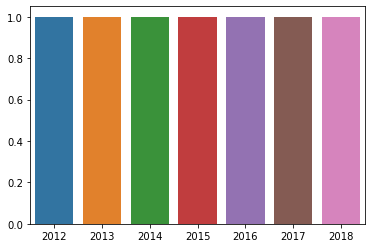

-------------------- 



ansible 



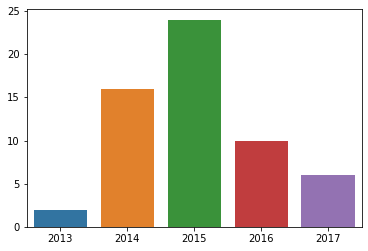

-------------------- 



apache 



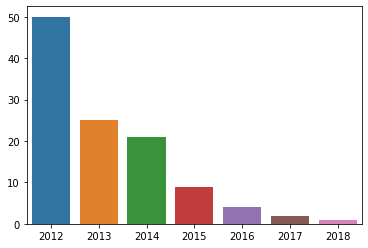

-------------------- 



apache-kafka 



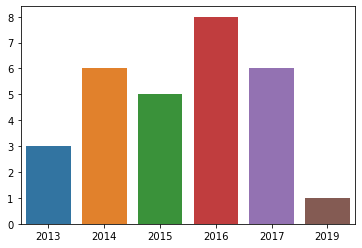

-------------------- 



apache-spark 



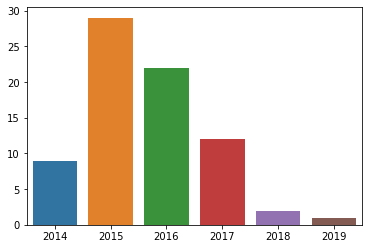

-------------------- 



apache-zookeeper 



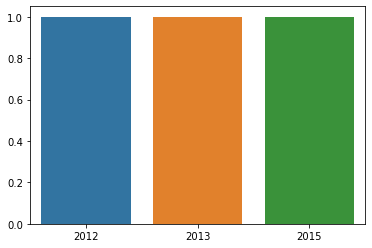

-------------------- 



api 



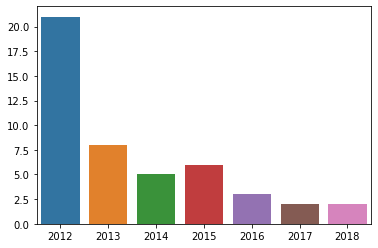

-------------------- 



app-store-connect 



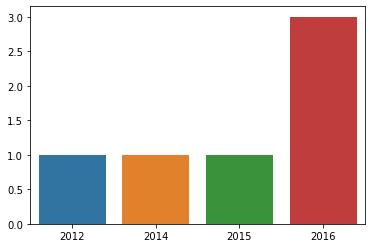

-------------------- 



architecture 



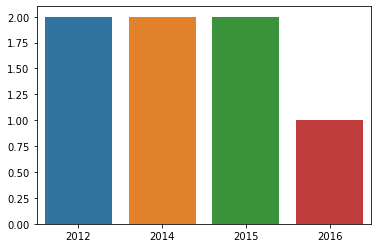

-------------------- 



arduino 



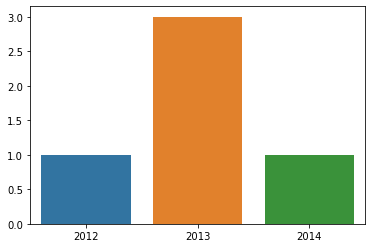

-------------------- 



arrays 



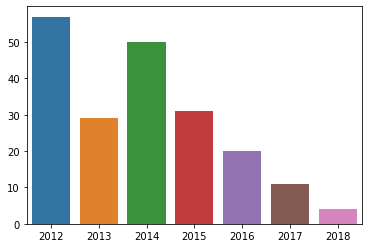

-------------------- 



asp.net 



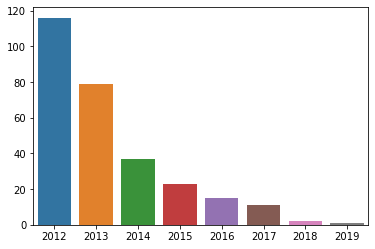

-------------------- 



asp.net-core 



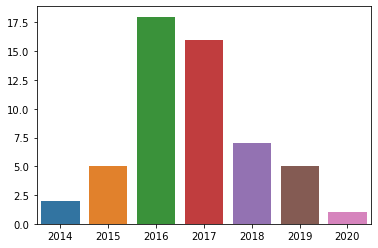

-------------------- 



asp.net-core-mvc 



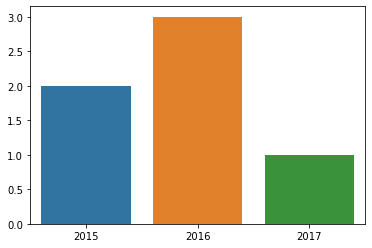

-------------------- 



asp.net-mvc 



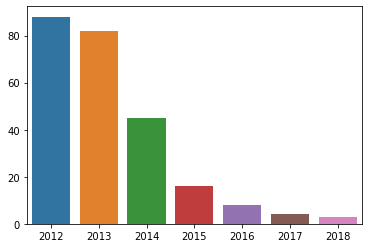

-------------------- 



asp.net-mvc-4 



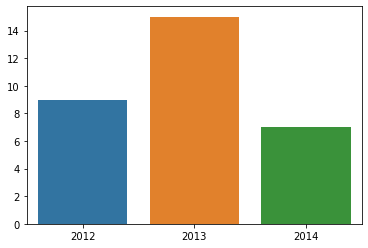

-------------------- 



asp.net-web-api 



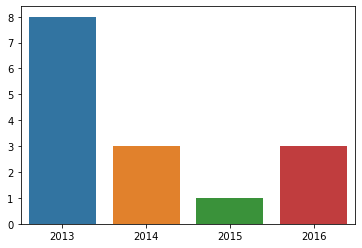

-------------------- 



assembly 



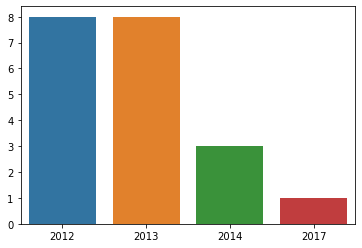

-------------------- 



asynchronous 



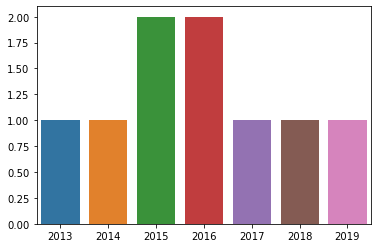

-------------------- 



atom-editor 



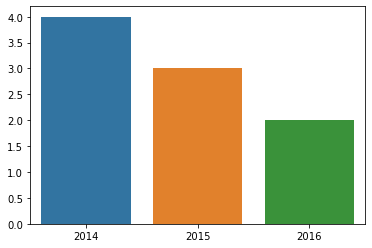

-------------------- 



audio 



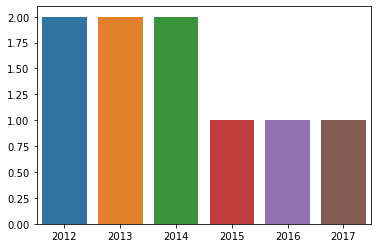

-------------------- 



authentication 



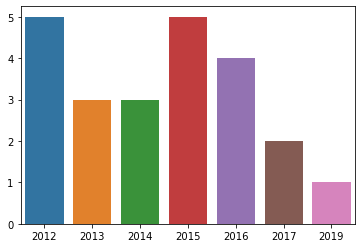

-------------------- 



autocomplete 



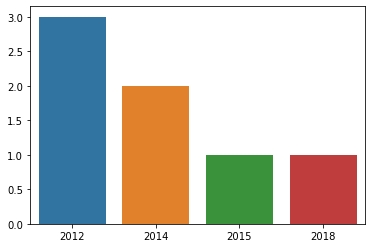

-------------------- 



aws-api-gateway 



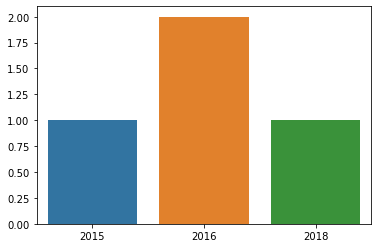

-------------------- 



aws-lambda 



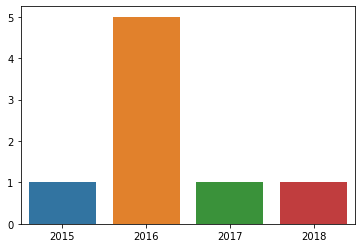

-------------------- 



azure 



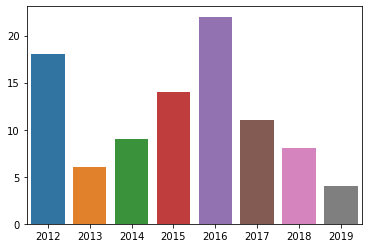

-------------------- 



azure-devops 



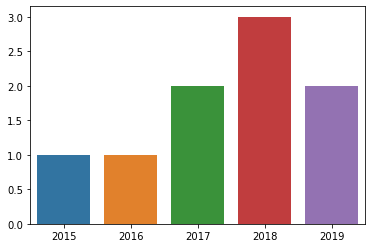

-------------------- 



backbone.js 



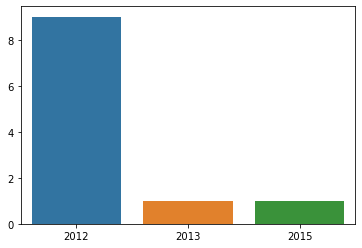

-------------------- 



backup 



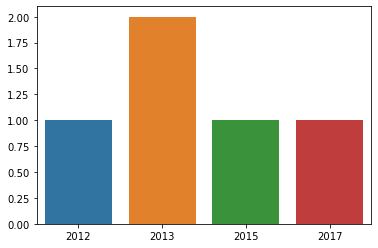

-------------------- 



bash 



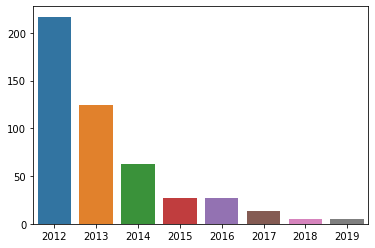

-------------------- 



batch-file 



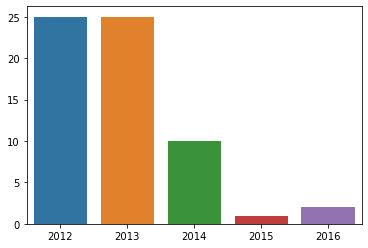

-------------------- 



binding 



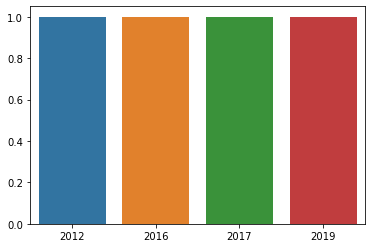

-------------------- 



bitbucket 



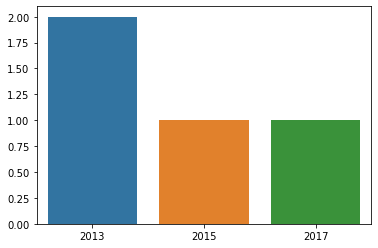

-------------------- 



bootstrap-4 



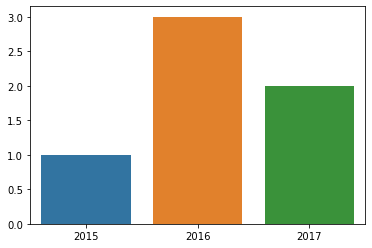

-------------------- 



browser 



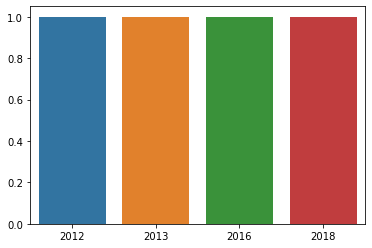

-------------------- 



build 



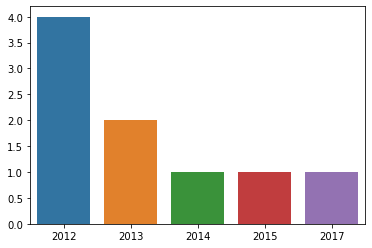

-------------------- 



button 



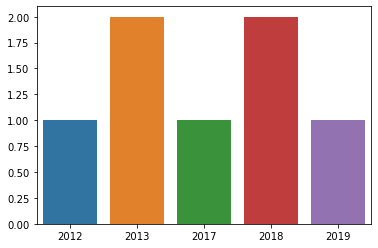

-------------------- 



c 



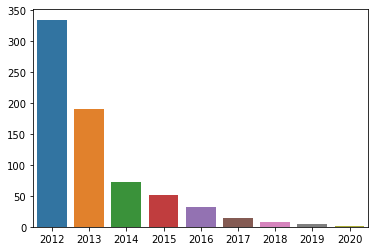

-------------------- 



c# 



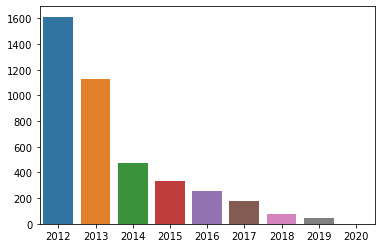

-------------------- 



c#-4.0 



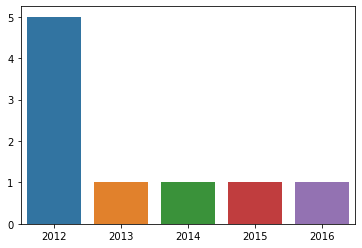

-------------------- 



c++ 



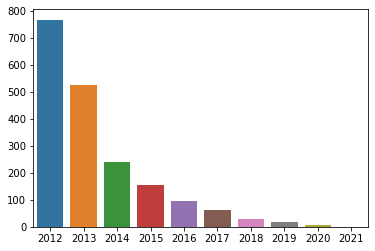

-------------------- 



c++11 



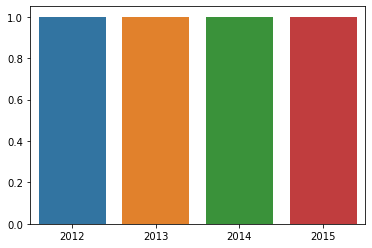

-------------------- 



caching 



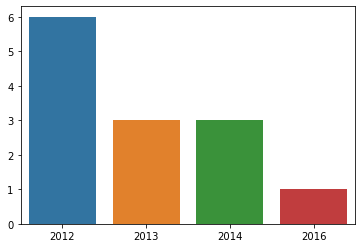

-------------------- 



cakephp 



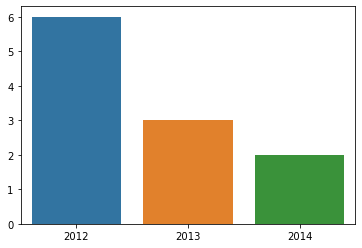

-------------------- 



cassandra 



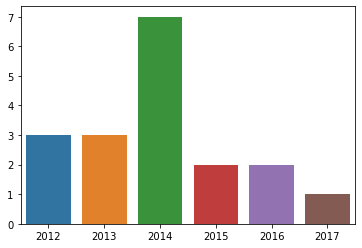

-------------------- 



centos 



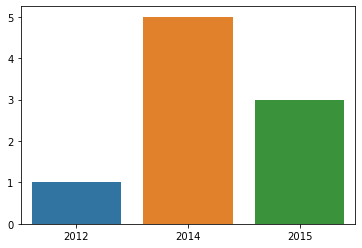

-------------------- 



chart.js 



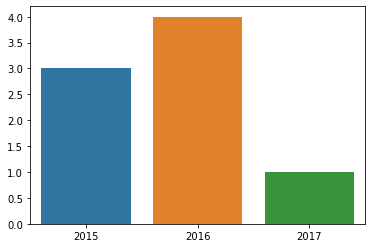

-------------------- 



charts 



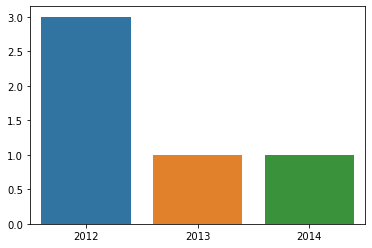

-------------------- 



checkbox 



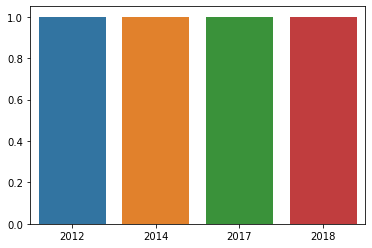

-------------------- 



chef-infra 



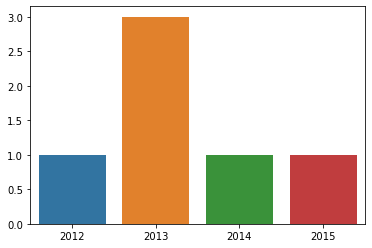

-------------------- 



ckeditor 



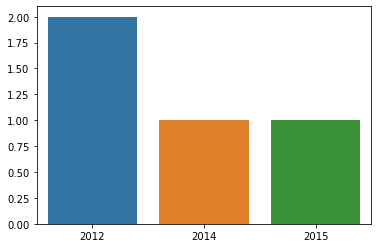

-------------------- 



class 



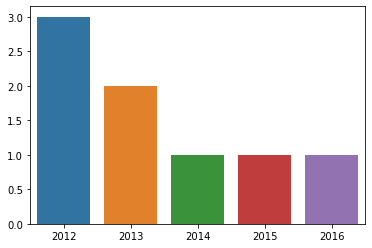

-------------------- 



clojure 



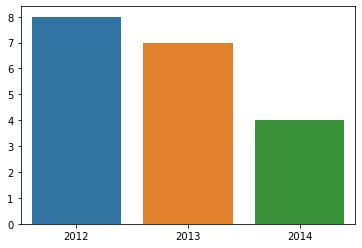

-------------------- 



cloud 



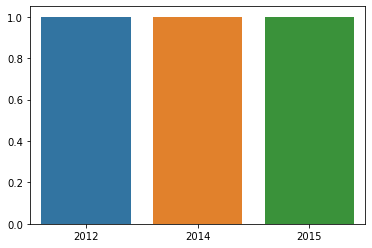

-------------------- 



cmake 



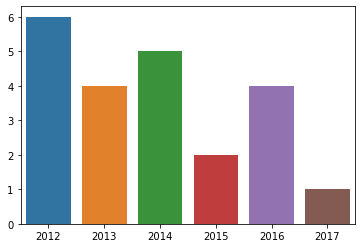

-------------------- 



cmd 



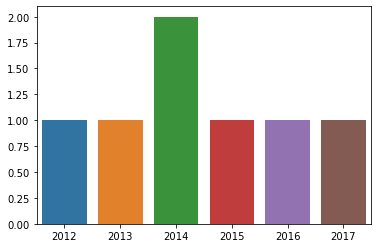

-------------------- 



cocoa 



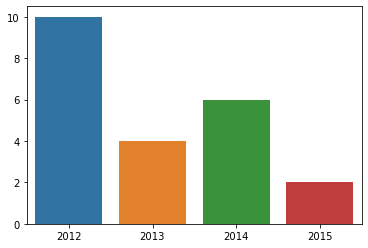

-------------------- 



cocoa-touch 



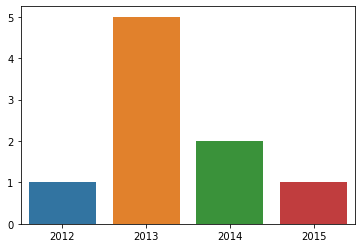

-------------------- 



cocoapods 



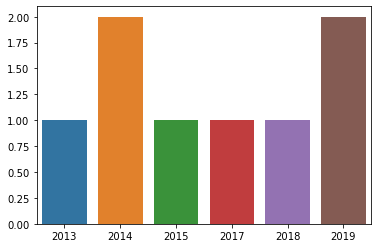

-------------------- 



codeigniter 



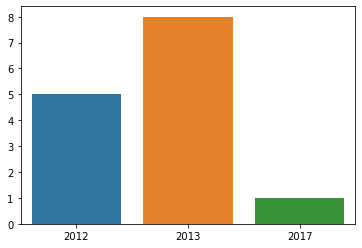

-------------------- 



collections 



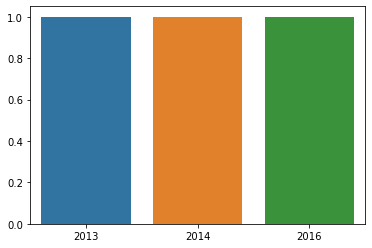

-------------------- 



colors 



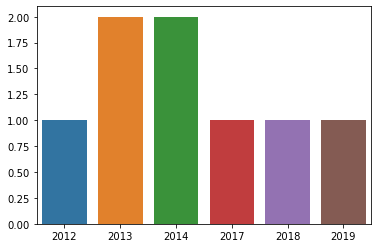

-------------------- 



command-line 



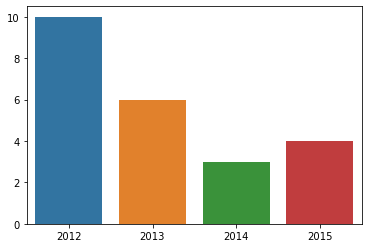

-------------------- 



comments 



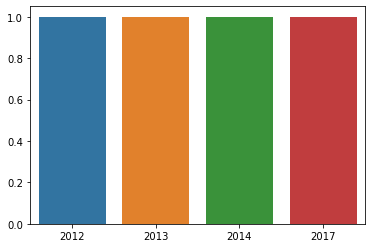

-------------------- 



compilation 



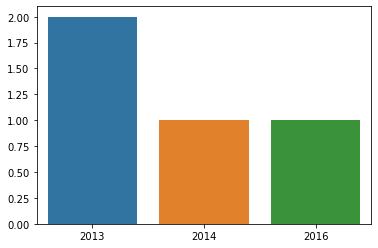

-------------------- 



compiler-construction 



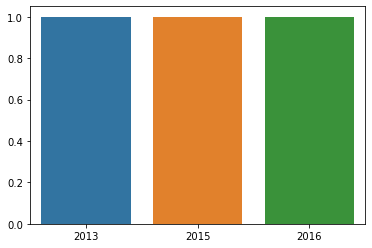

-------------------- 



compiler-errors 



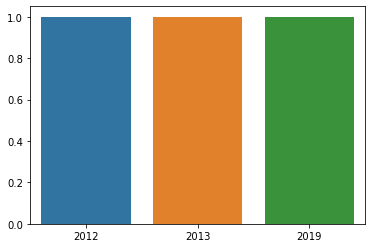

-------------------- 



composer-php 



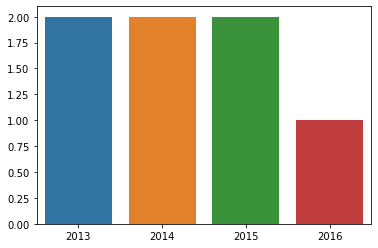

-------------------- 



compression 



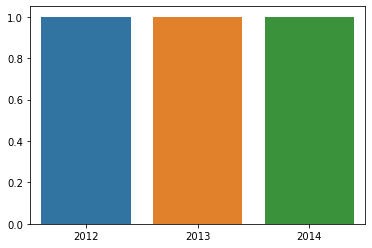

-------------------- 



concurrency 



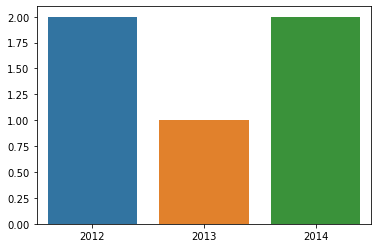

-------------------- 



configuration 



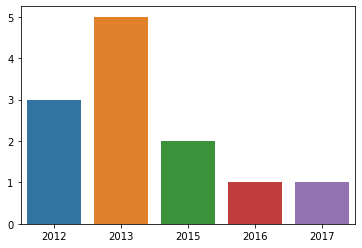

-------------------- 



console 



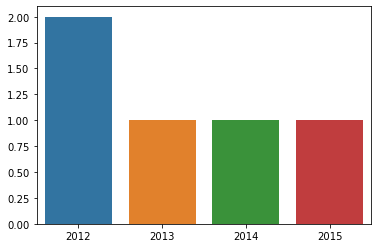

-------------------- 



constructor 



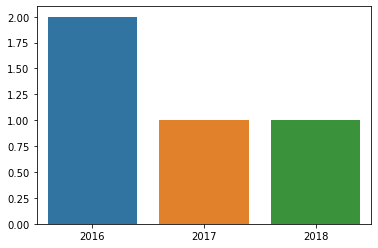

-------------------- 



continuous-integration 



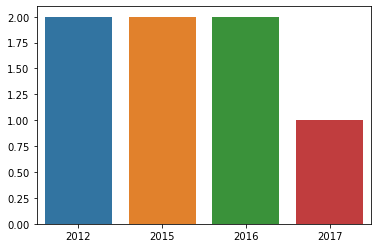

-------------------- 



cookies 



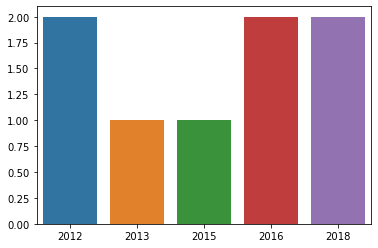

-------------------- 



cordova 



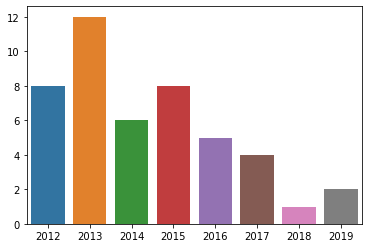

-------------------- 



core-data 



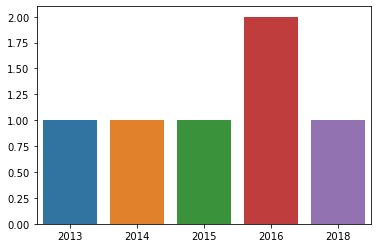

-------------------- 



cors 



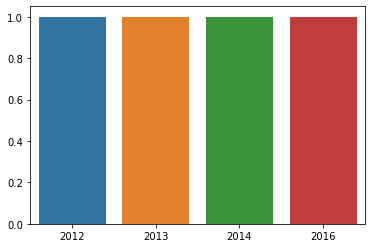

-------------------- 



cqrs 



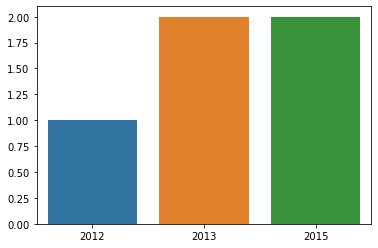

-------------------- 



cron 



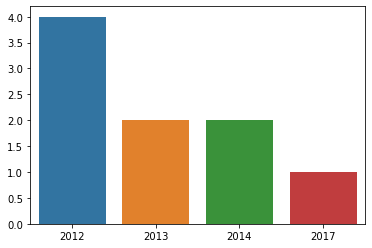

-------------------- 



css 



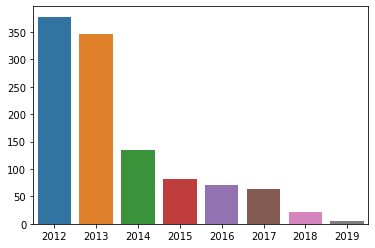

-------------------- 



csv 



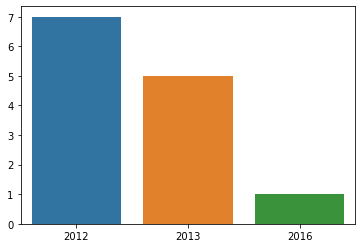

-------------------- 



cuda 



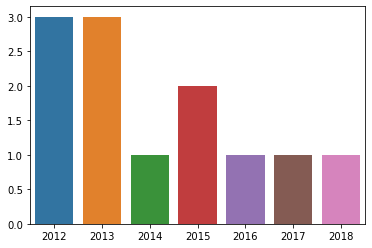

-------------------- 



curl 



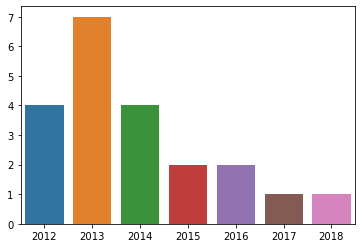

-------------------- 



cygwin 



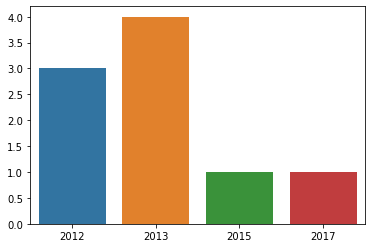

-------------------- 



d3.js 



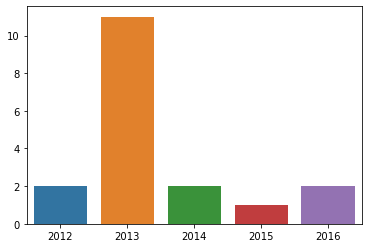

-------------------- 



dapper 



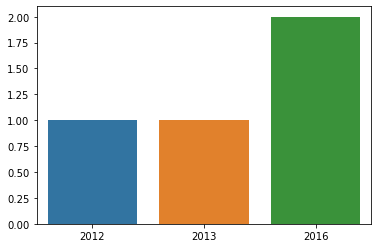

-------------------- 



dart 



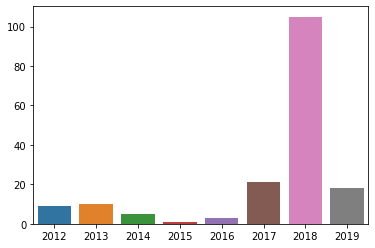

-------------------- 



data-structures 



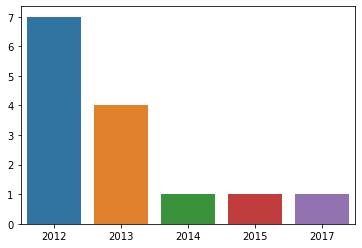

-------------------- 



database 



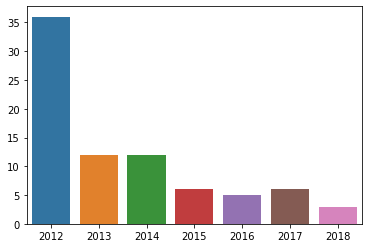

-------------------- 



date 



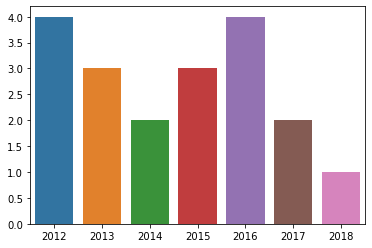

-------------------- 



datetime 



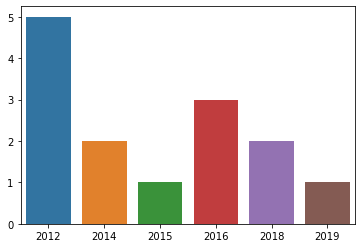

-------------------- 



debian 



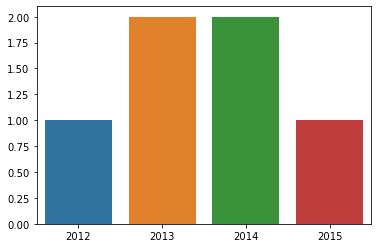

-------------------- 



debugging 



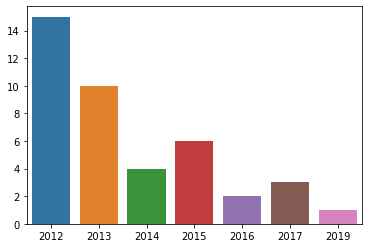

-------------------- 



deep-learning 



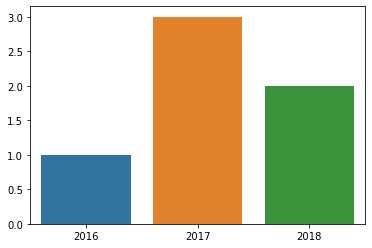

-------------------- 



delphi 



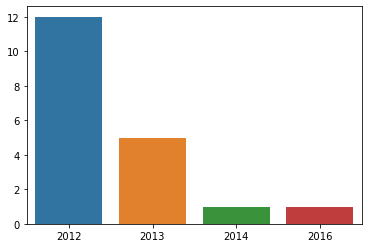

-------------------- 



dependencies 



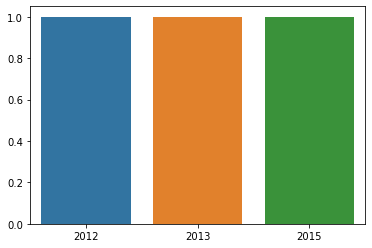

-------------------- 



deployment 



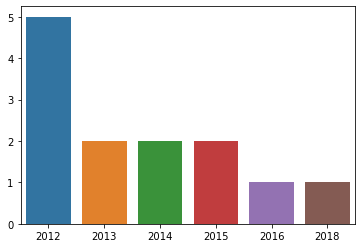

-------------------- 



design-patterns 



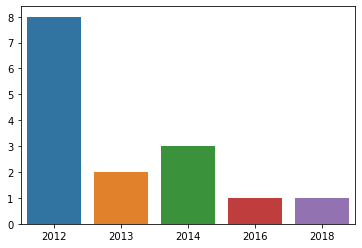

-------------------- 



dictionary 



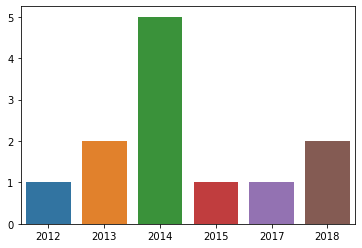

-------------------- 



directory 



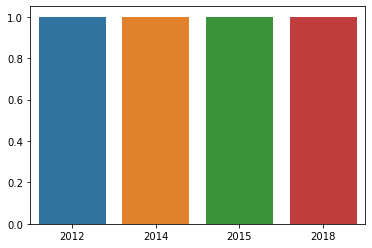

-------------------- 



django 



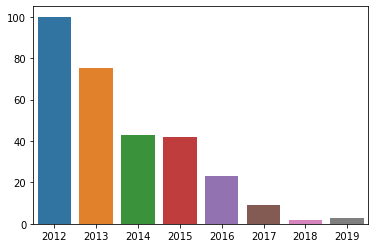

-------------------- 



django-rest-framework 



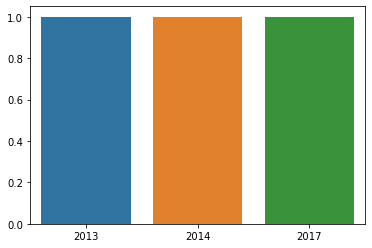

-------------------- 



dll 



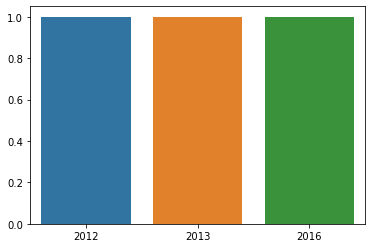

-------------------- 



dns 



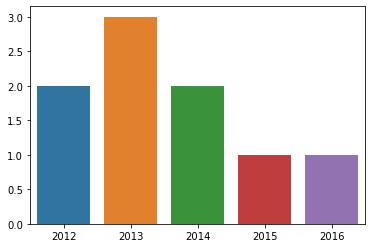

-------------------- 



docker 



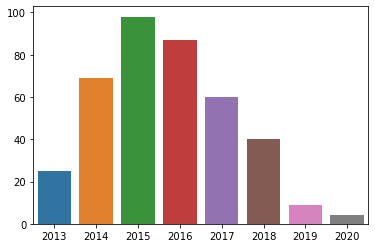

-------------------- 



docker-compose 



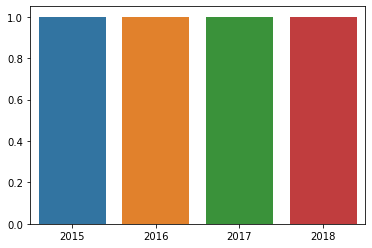

-------------------- 



dom 



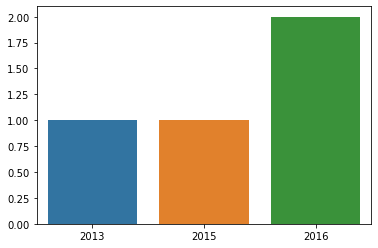

-------------------- 



drop-down-menu 



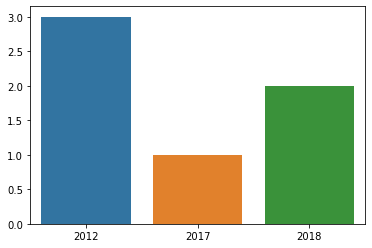

-------------------- 



drupal 



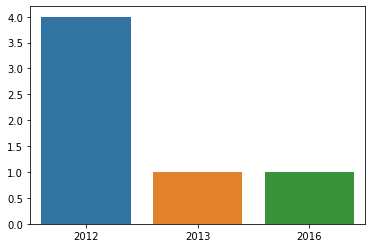

-------------------- 



dynamic 



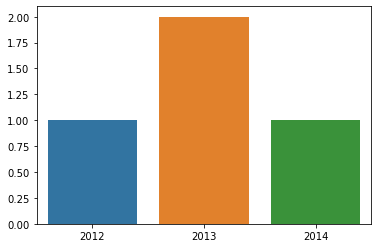

-------------------- 



eclipse 



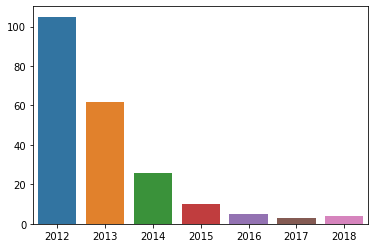

-------------------- 



editor 



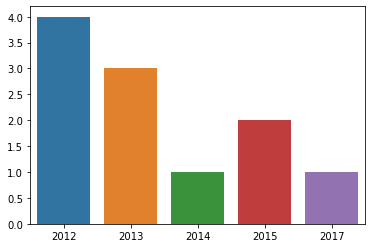

-------------------- 



ef-code-first 



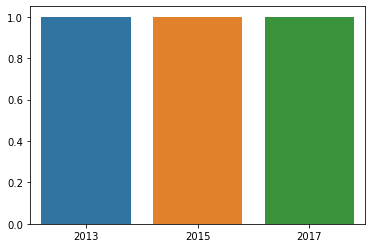

-------------------- 



elasticsearch 



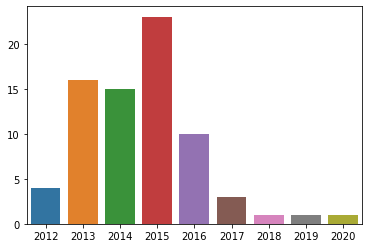

-------------------- 



electron 



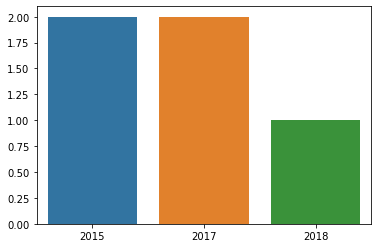

-------------------- 



elixir 



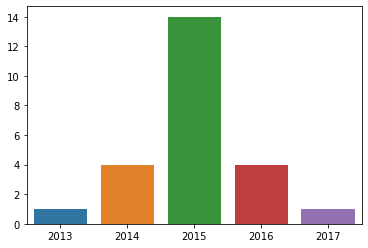

-------------------- 



emacs 



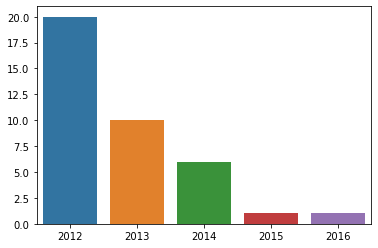

-------------------- 



email 



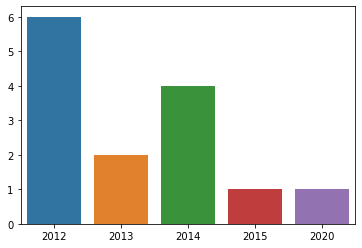

-------------------- 



ember.js 



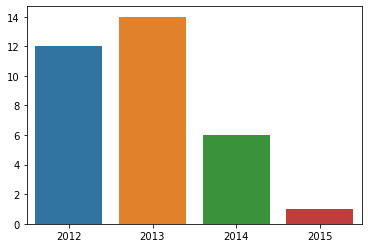

-------------------- 



encoding 



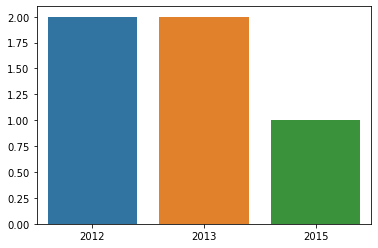

-------------------- 



encryption 



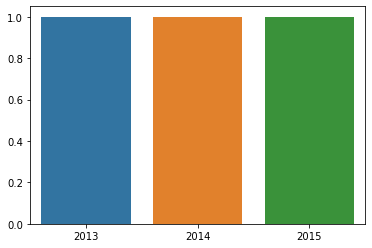

-------------------- 



entity-framework 



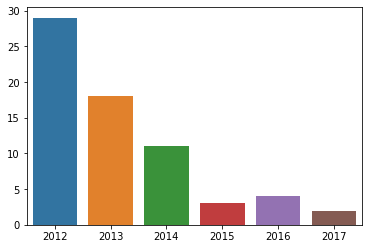

-------------------- 



entity-framework-core 



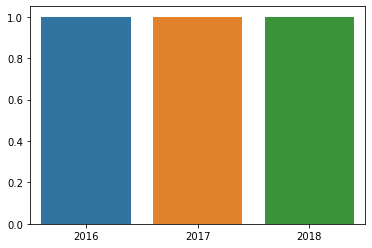

-------------------- 



enums 



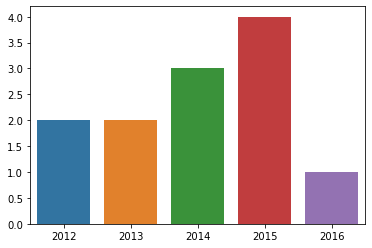

-------------------- 



environment-variables 



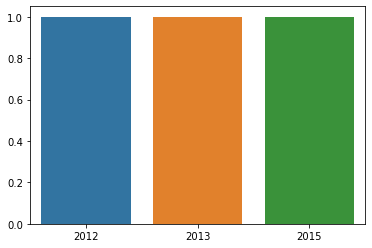

-------------------- 



error-handling 



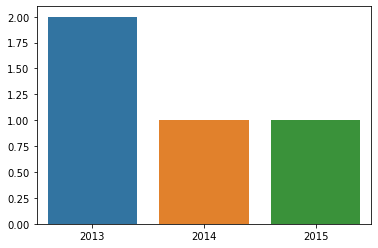

-------------------- 



eslint 



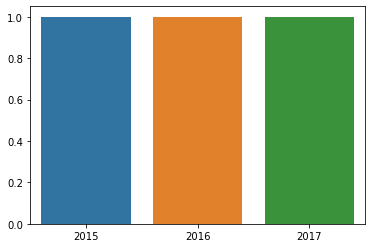

-------------------- 



ethereum 



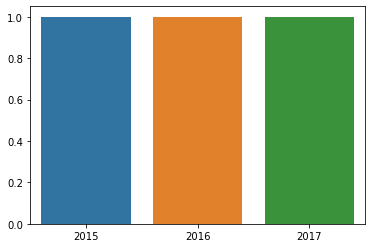

-------------------- 



events 



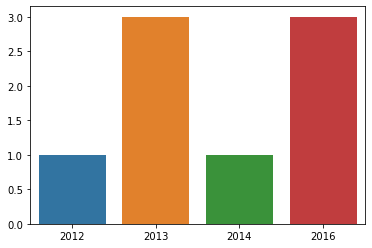

-------------------- 



excel 



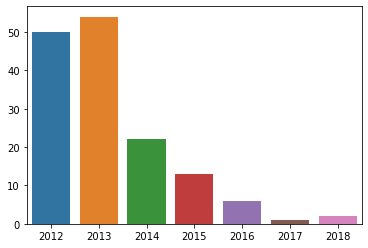

-------------------- 



exception-handling 



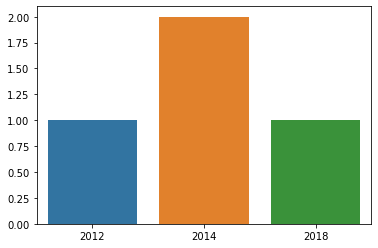

-------------------- 



express 



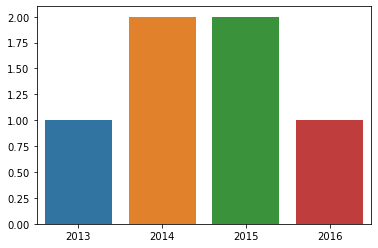

-------------------- 



facebook 



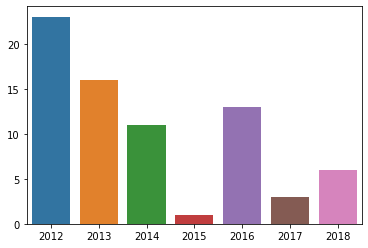

-------------------- 



facebook-graph-api 



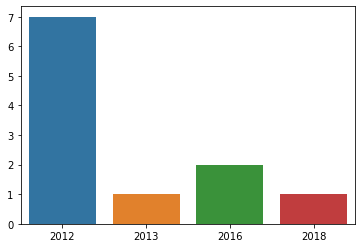

-------------------- 



ffmpeg 



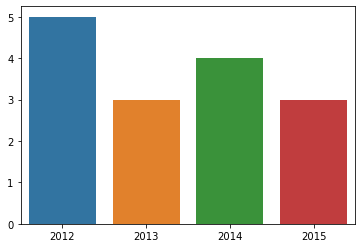

-------------------- 



file 



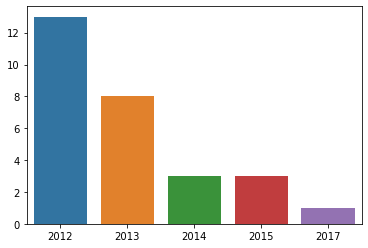

-------------------- 



file-upload 



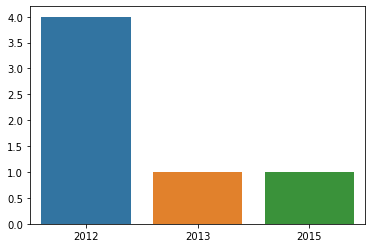

-------------------- 



filter 



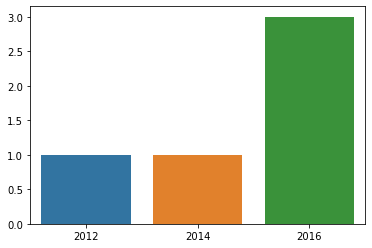

-------------------- 



firebase 



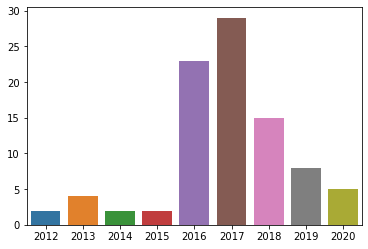

-------------------- 



firefox 



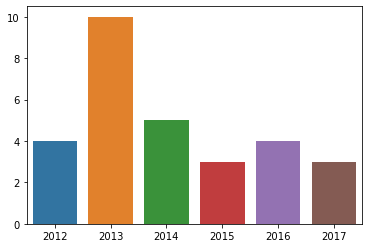

-------------------- 



fish 



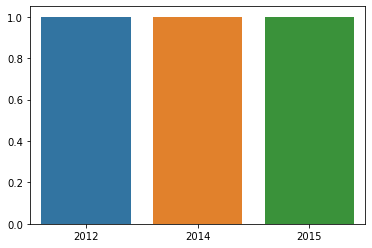

-------------------- 



flask 



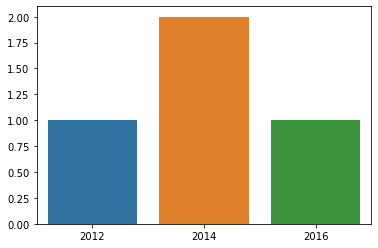

-------------------- 



floating-point 



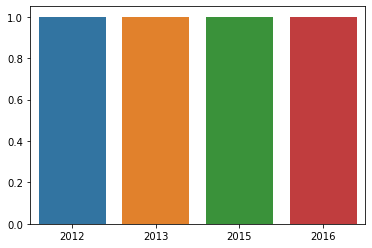

-------------------- 



flutter 



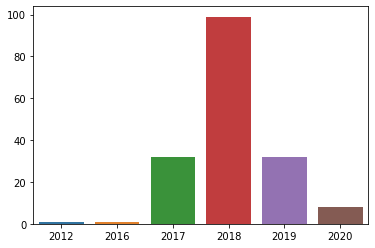

-------------------- 



font-awesome 



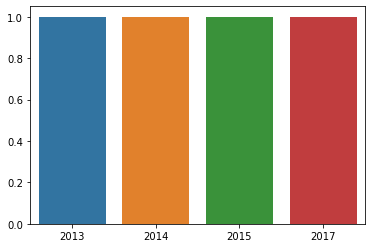

-------------------- 



fonts 



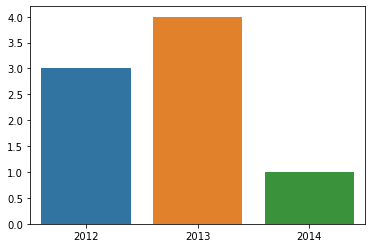

-------------------- 



for-loop 



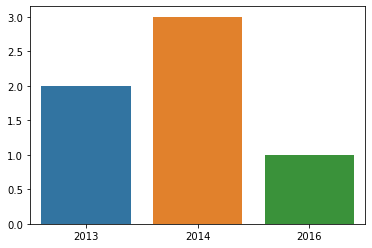

-------------------- 



formatting 



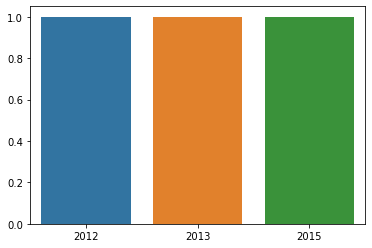

-------------------- 



forms 



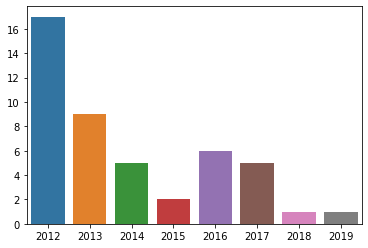

-------------------- 



function 



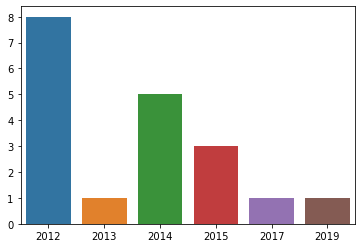

-------------------- 



functional-programming 



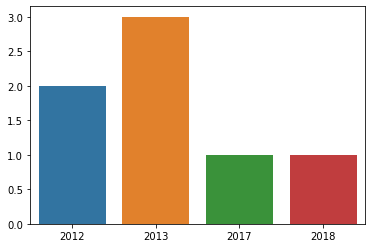

-------------------- 



gcc 



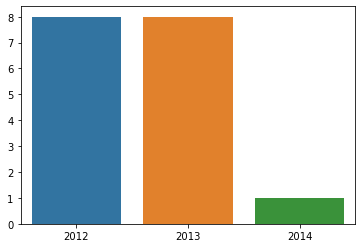

-------------------- 



generics 



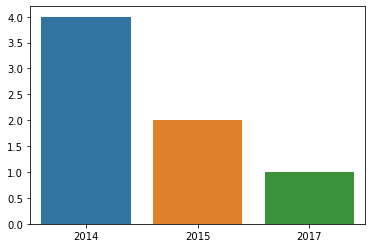

-------------------- 



git 



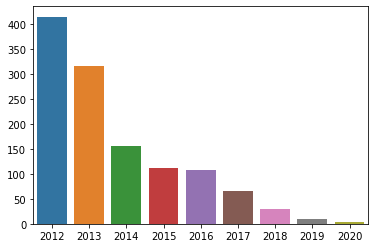

-------------------- 



github 



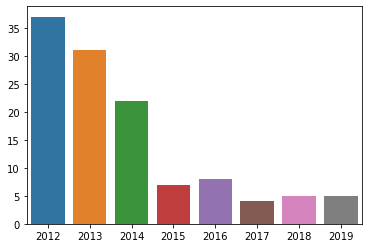

-------------------- 



gitlab 



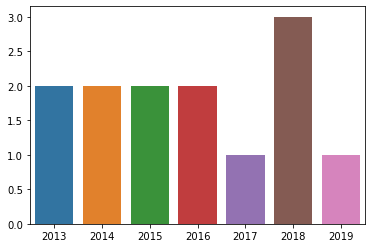

-------------------- 



gitlab-ci 



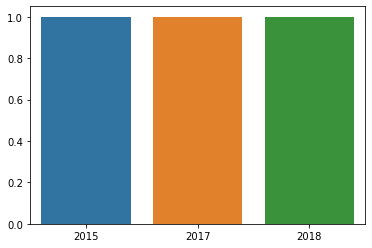

-------------------- 



go 



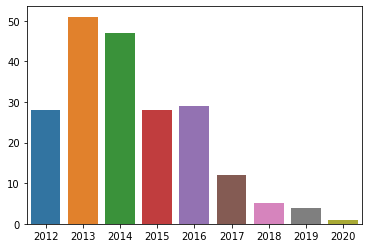

-------------------- 



google-analytics 



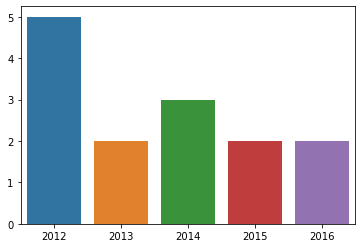

-------------------- 



google-api 



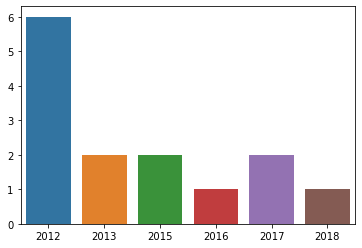

-------------------- 



google-app-engine 



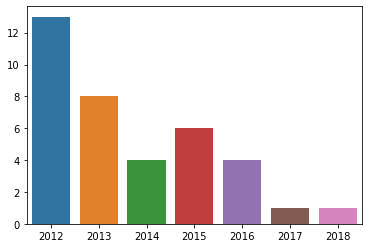

-------------------- 



google-apps-script 



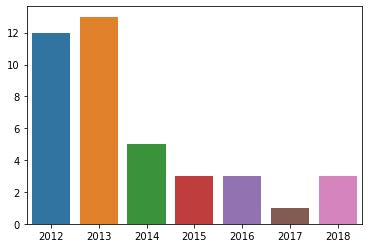

-------------------- 



google-bigquery 



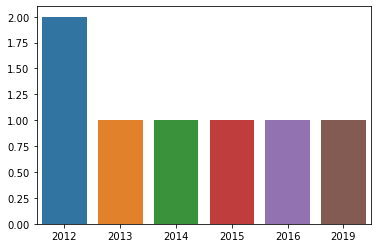

-------------------- 



google-chrome 



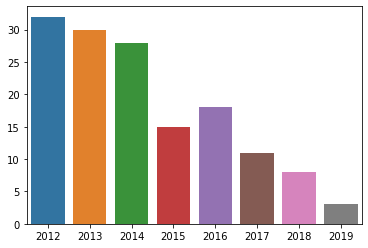

-------------------- 



google-chrome-devtools 



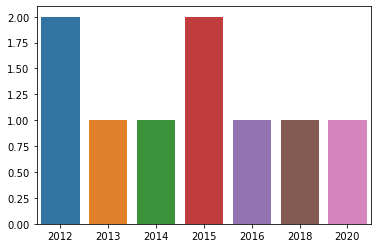

-------------------- 



google-chrome-extension 



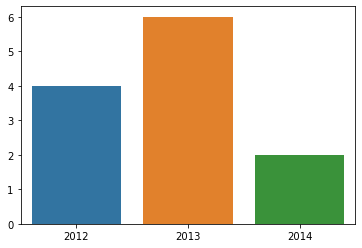

-------------------- 



google-cloud-platform 



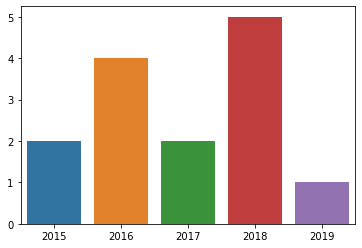

-------------------- 



google-cloud-storage 



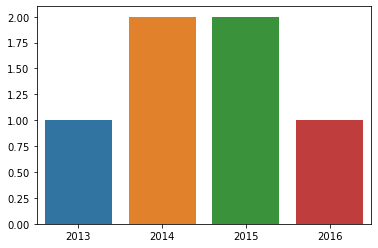

-------------------- 



google-compute-engine 



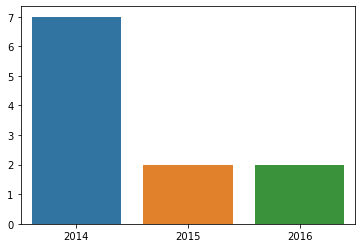

-------------------- 



google-docs 



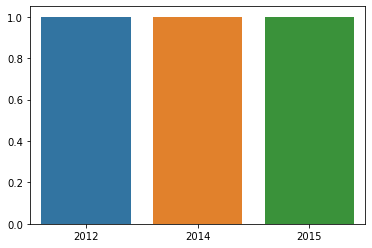

-------------------- 



google-drive-api 



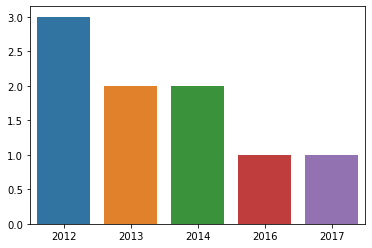

-------------------- 



google-maps 



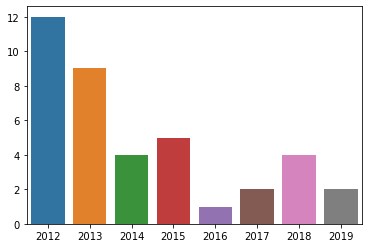

-------------------- 



google-maps-api-3 



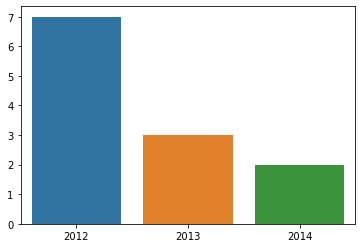

-------------------- 



google-sheets 



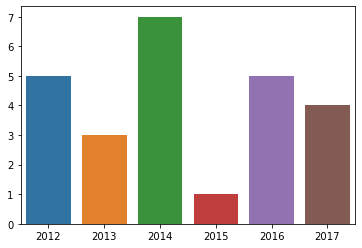

-------------------- 



gradle 



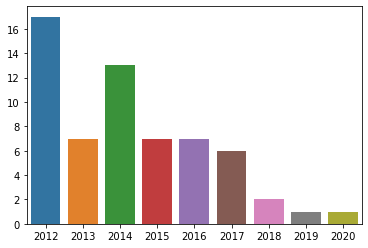

-------------------- 



grafana 



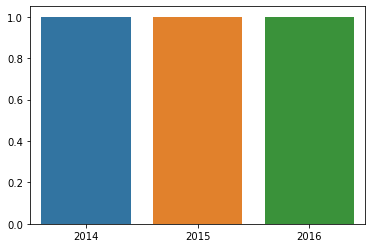

-------------------- 



grails 



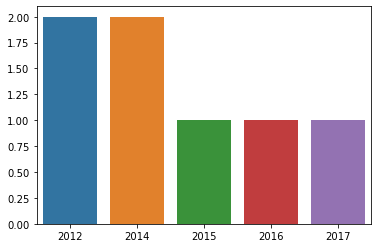

-------------------- 



graph 



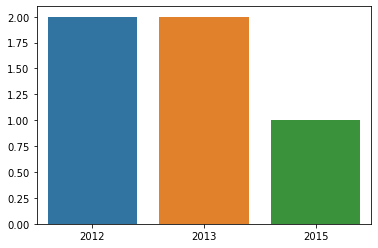

-------------------- 



groovy 



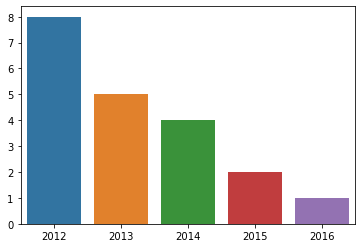

-------------------- 



gruntjs 



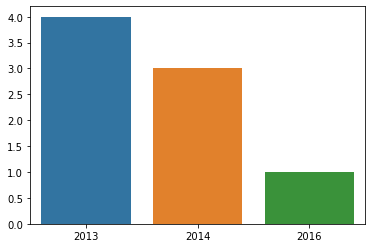

-------------------- 



gulp 



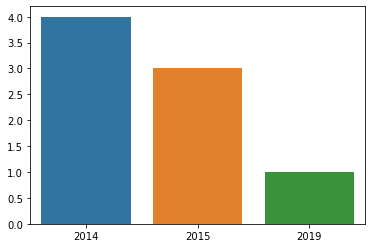

-------------------- 



hadoop 



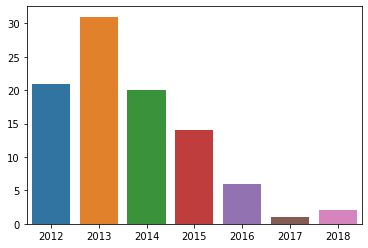

-------------------- 



hash 



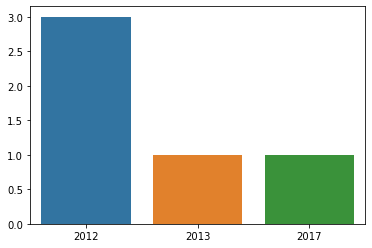

-------------------- 



haskell 



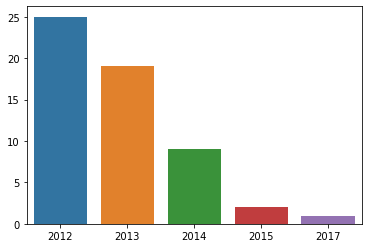

-------------------- 



heroku 



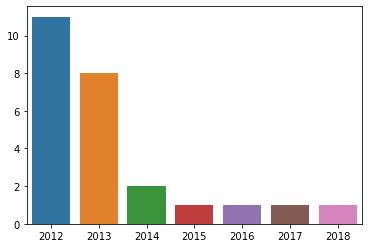

-------------------- 



hibernate 



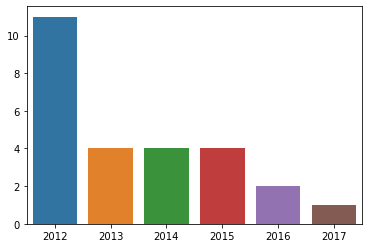

-------------------- 



highcharts 



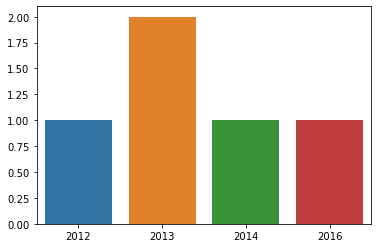

-------------------- 



hive 



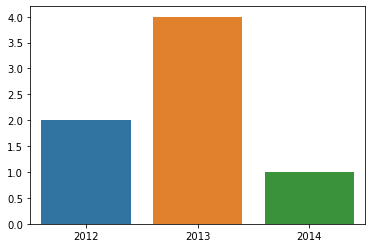

-------------------- 



homebrew 



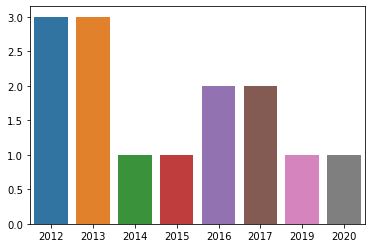

-------------------- 



html 



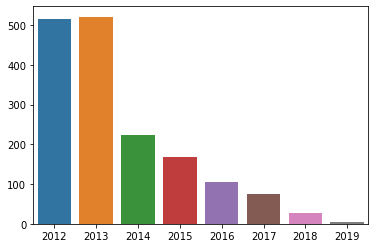

-------------------- 



http 



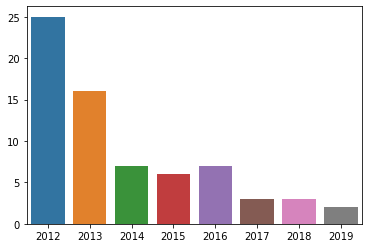

-------------------- 



http-headers 



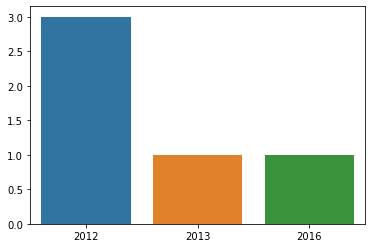

-------------------- 



https 



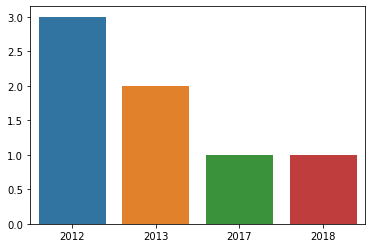

-------------------- 



icons 



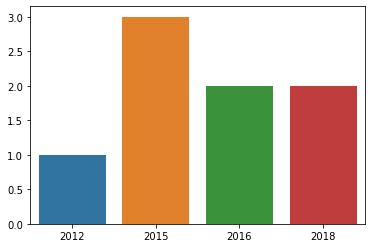

-------------------- 



ide 



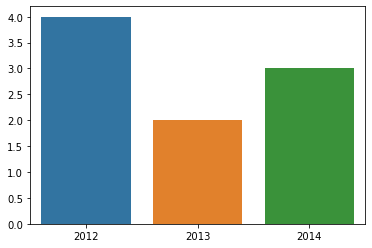

-------------------- 



if-statement 



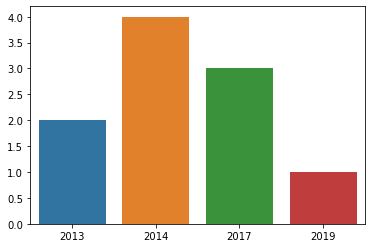

-------------------- 



iis 



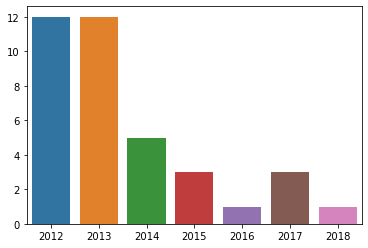

-------------------- 



iis-7 



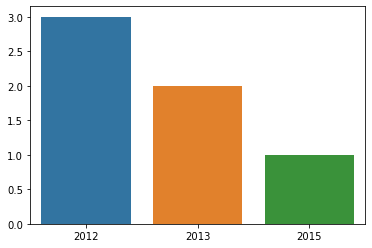

-------------------- 



image 



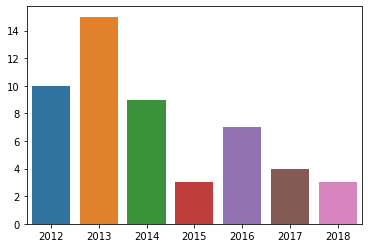

-------------------- 



imagemagick 



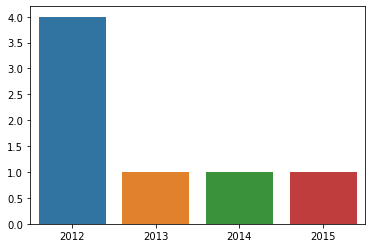

-------------------- 



indexing 



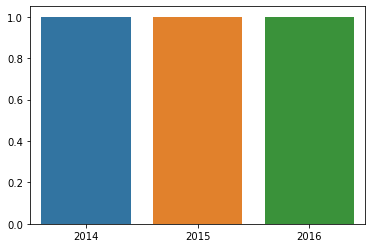

-------------------- 



inheritance 



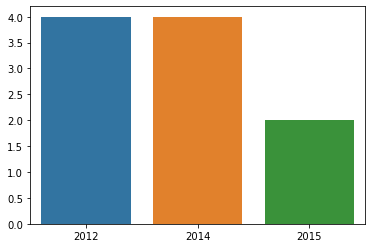

-------------------- 



instagram 



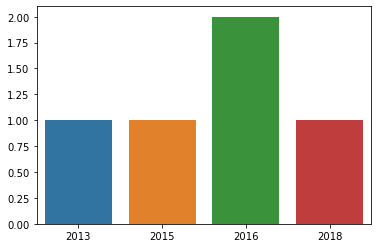

-------------------- 



installation 



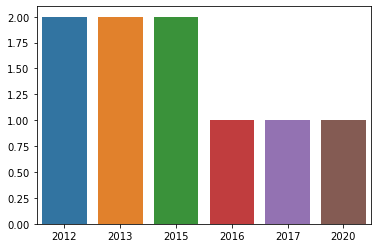

-------------------- 



intellij-idea 



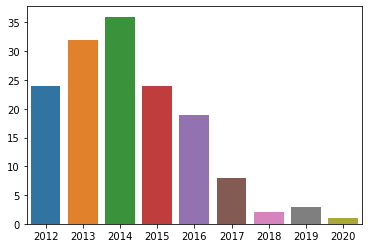

-------------------- 



internet-explorer 



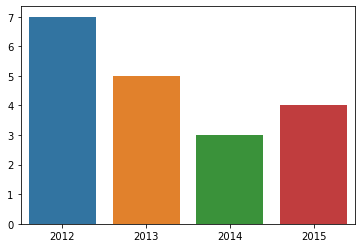

-------------------- 



ionic-framework 



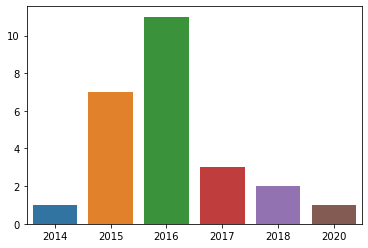

-------------------- 



ios 



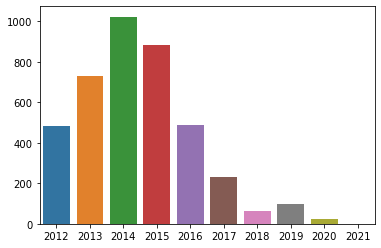

-------------------- 



ios-simulator 



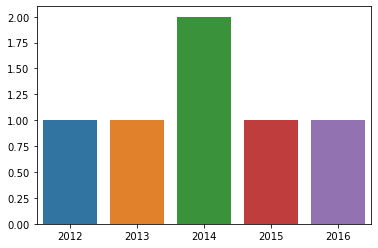

-------------------- 



ipad 



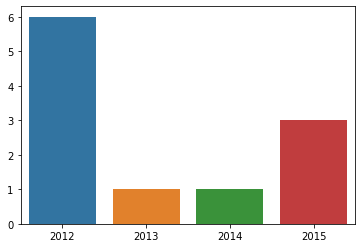

-------------------- 



iphone 



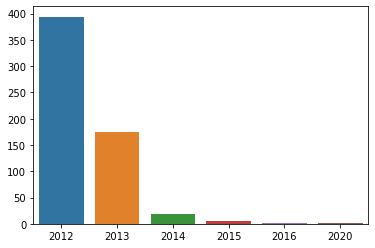

-------------------- 



ipython 



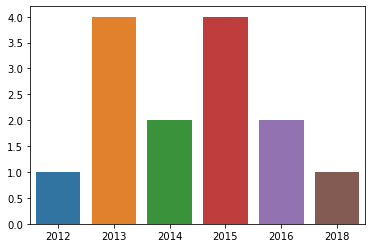

-------------------- 



ipython-notebook 



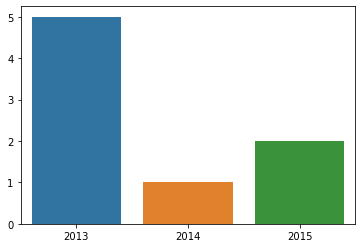

-------------------- 



jasmine 



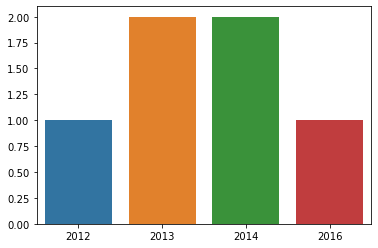

-------------------- 



java 



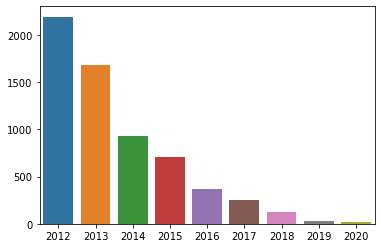

-------------------- 



java-8 



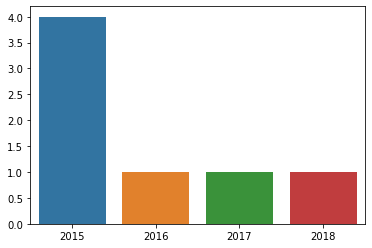

-------------------- 



javafx 



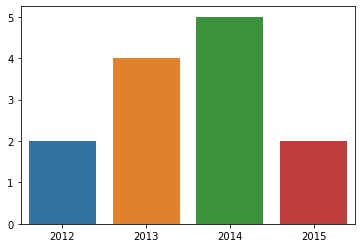

-------------------- 



javascript 



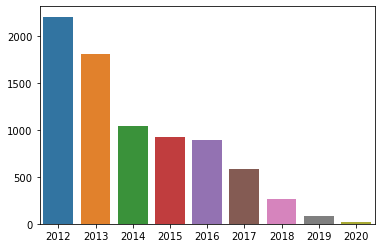

-------------------- 



jboss 



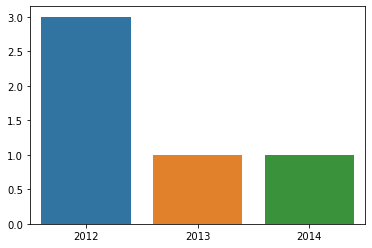

-------------------- 



jekyll 



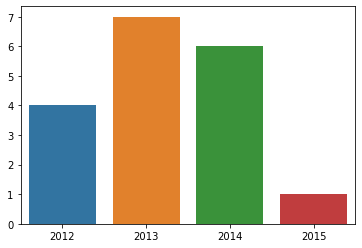

-------------------- 



jenkins 



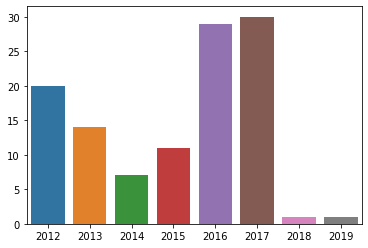

-------------------- 



jestjs 



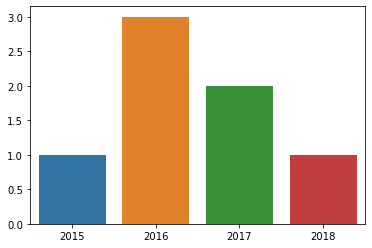

-------------------- 



jinja2 



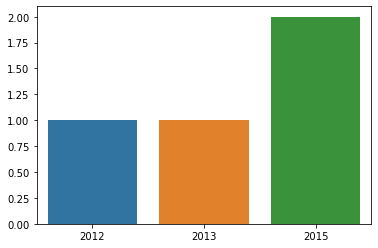

-------------------- 



jpa 



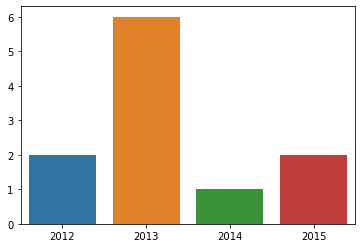

-------------------- 



jquery 



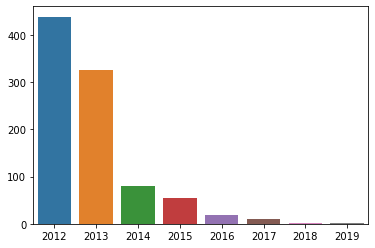

-------------------- 



jquery-select2 



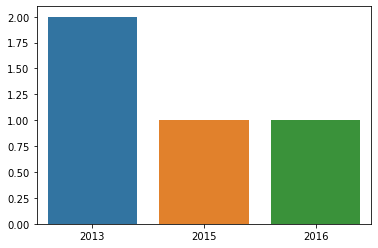

-------------------- 



jquery-ui 



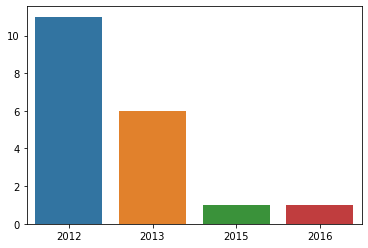

-------------------- 



jsf 



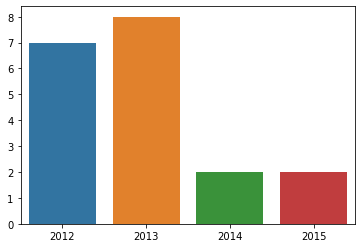

-------------------- 



json 



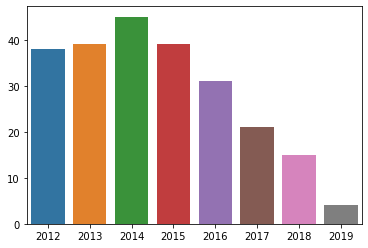

-------------------- 



jsp 



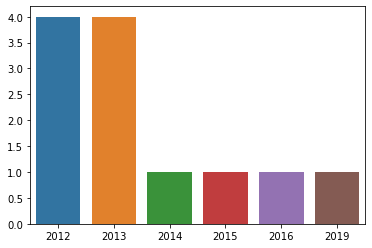

-------------------- 



julia 



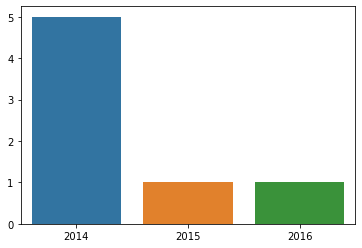

-------------------- 



junit 



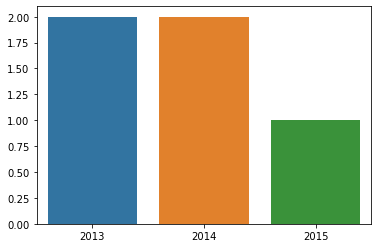

-------------------- 



jupyter-notebook 



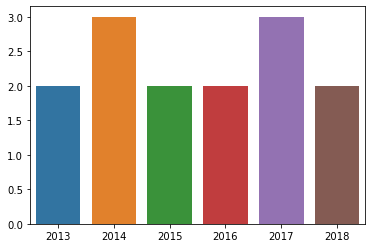

-------------------- 



jvm 



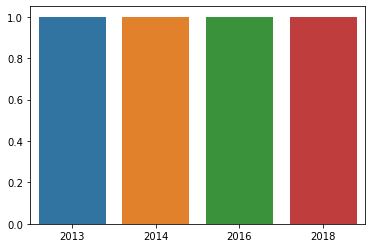

-------------------- 



kendo-ui 



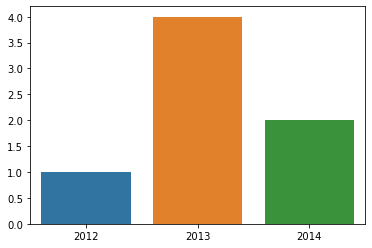

-------------------- 



keyboard 



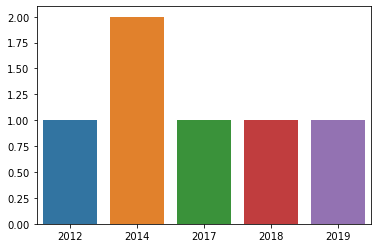

-------------------- 



keyboard-shortcuts 



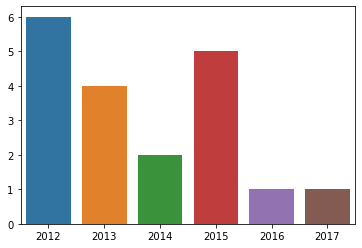

-------------------- 



knockout.js 



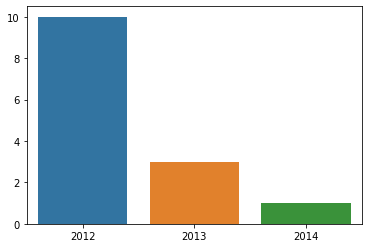

-------------------- 



kotlin 



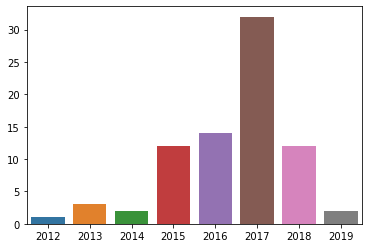

-------------------- 



kubernetes 



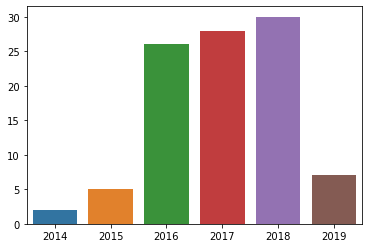

-------------------- 



lambda 



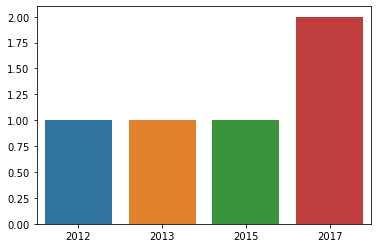

-------------------- 



language-agnostic 



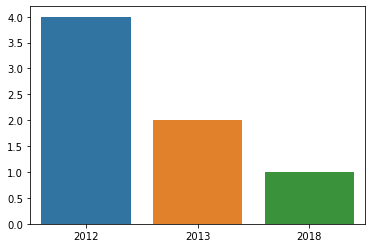

-------------------- 



laravel 



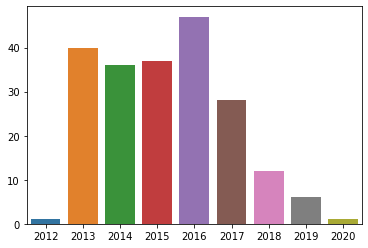

-------------------- 



laravel-5 



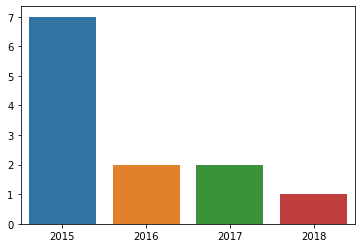

-------------------- 



layout 



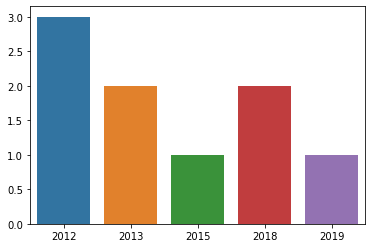

-------------------- 



leaflet 



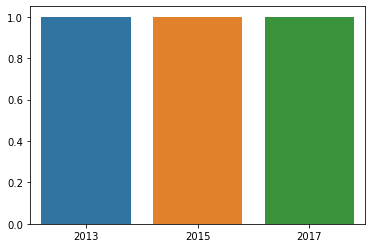

-------------------- 



linq 



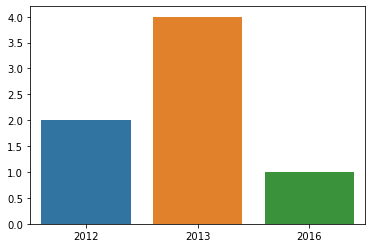

-------------------- 



linux 



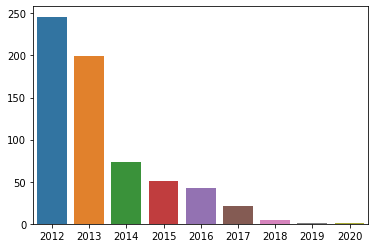

-------------------- 



list 



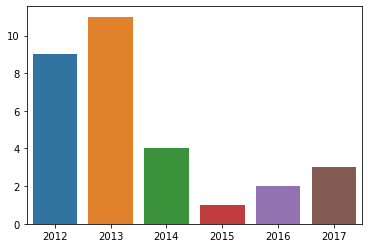

-------------------- 



listview 



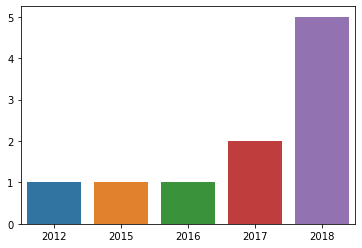

-------------------- 



localhost 



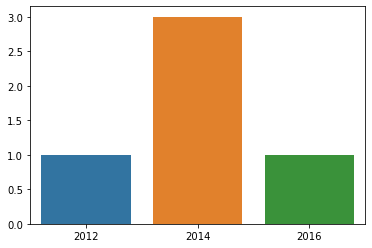

-------------------- 



logging 



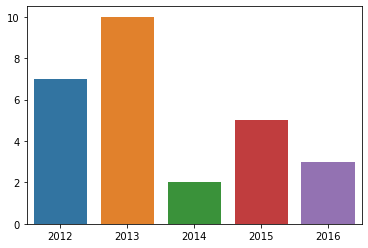

-------------------- 



login 



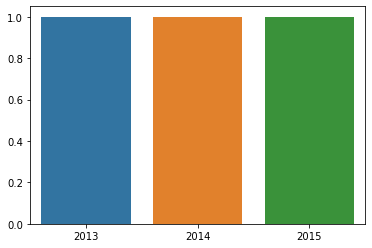

-------------------- 



loops 



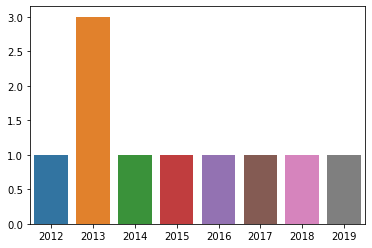

-------------------- 



lua 



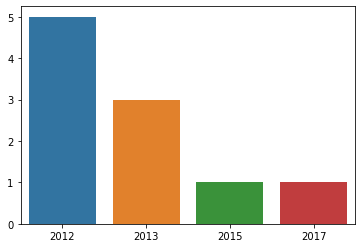

-------------------- 



machine-learning 



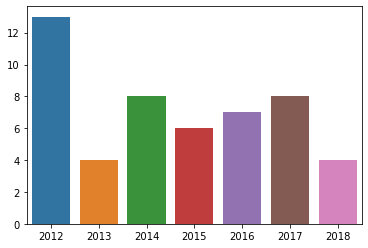

-------------------- 



macos 



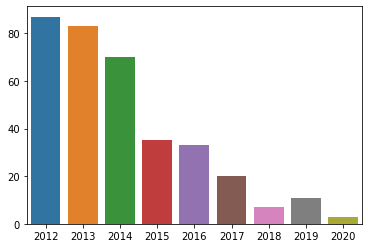

-------------------- 



magento 



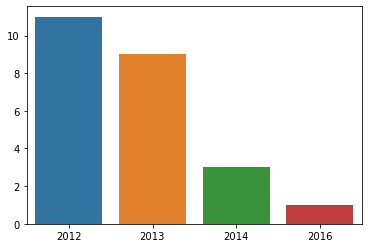

-------------------- 



makefile 



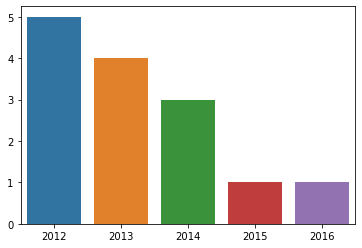

-------------------- 



markdown 



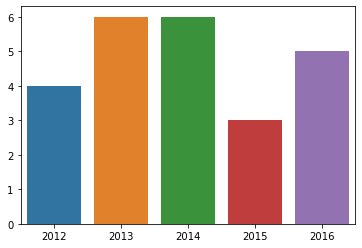

-------------------- 



math 



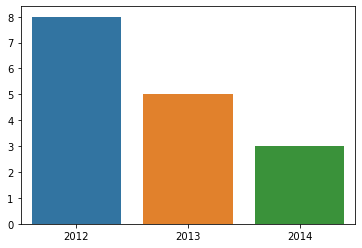

-------------------- 



matlab 



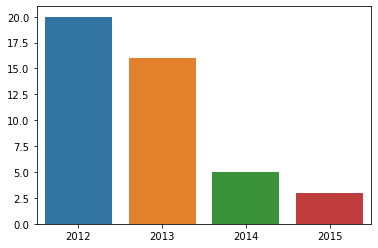

-------------------- 



matplotlib 



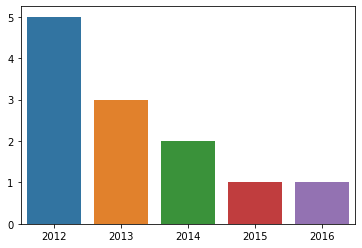

-------------------- 



matrix 



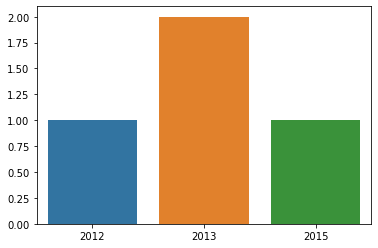

-------------------- 



maven 



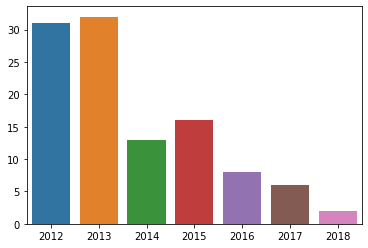

-------------------- 



maven-3 



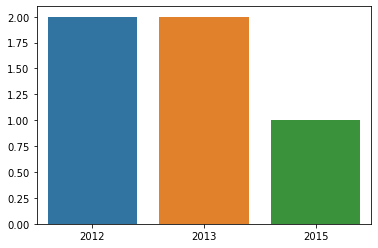

-------------------- 



memory 



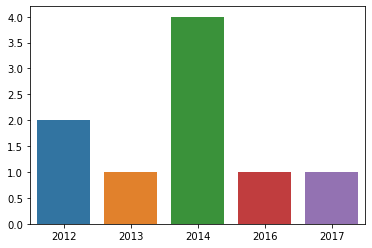

-------------------- 



memory-management 



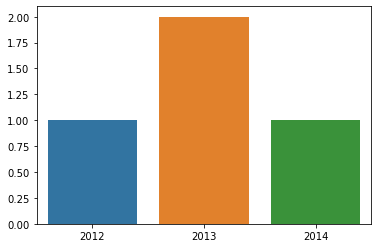

-------------------- 



mercurial 



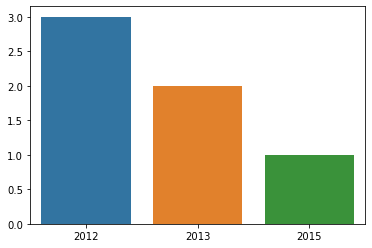

-------------------- 



message-queue 



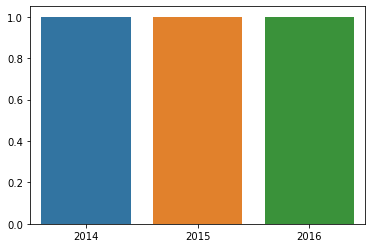

-------------------- 



meteor 



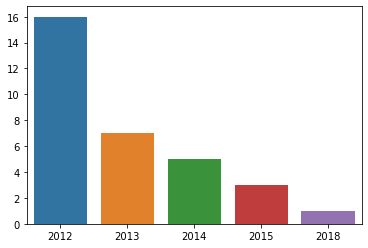

-------------------- 



mobile 



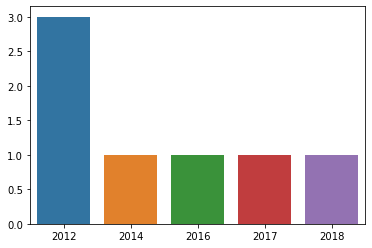

-------------------- 



module 



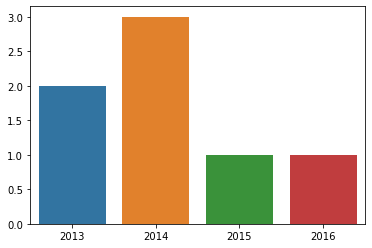

-------------------- 



mongodb 



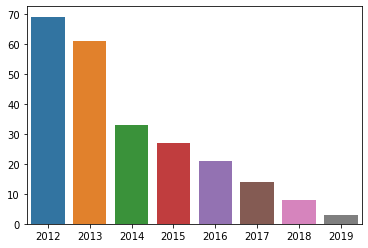

-------------------- 



mongoose 



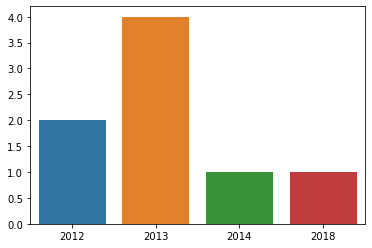

-------------------- 



msbuild 



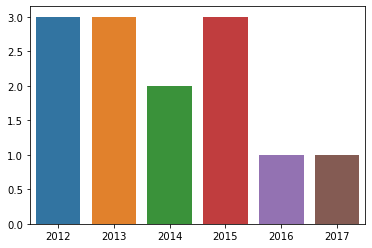

-------------------- 



multithreading 



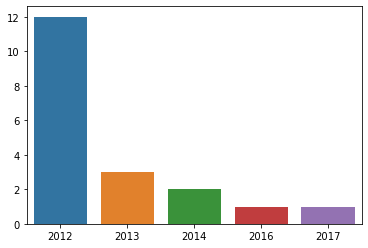

-------------------- 



mysql 



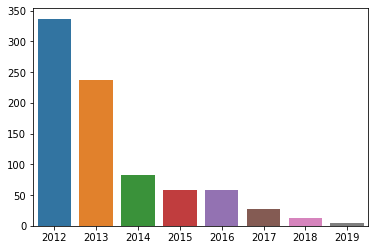

-------------------- 



namespaces 



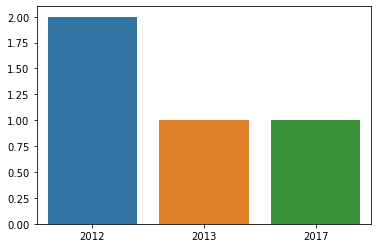

-------------------- 



neo4j 



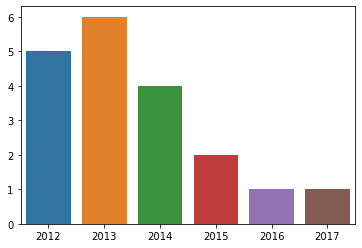

-------------------- 



netbeans 



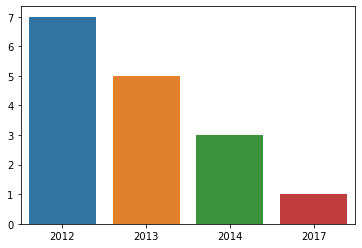

-------------------- 



networking 



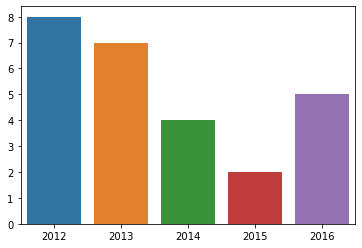

-------------------- 



neural-network 



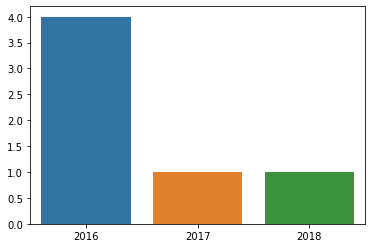

-------------------- 



nginx 



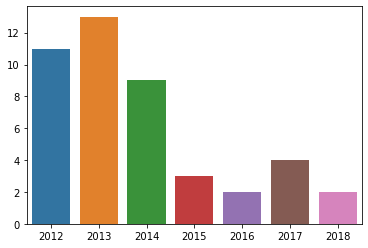

-------------------- 



nlp 



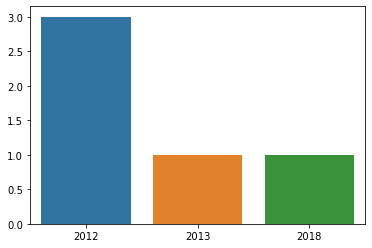

-------------------- 



node.js 



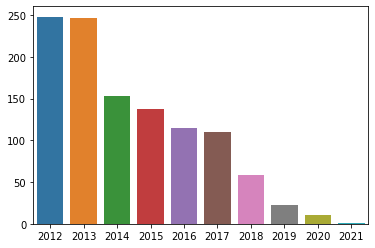

-------------------- 



notepad++ 



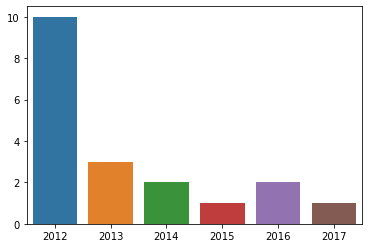

-------------------- 



npm 



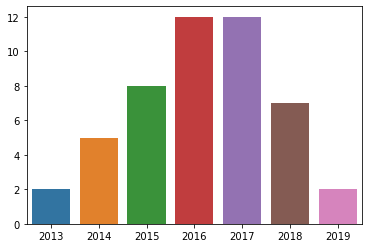

-------------------- 



nuget 



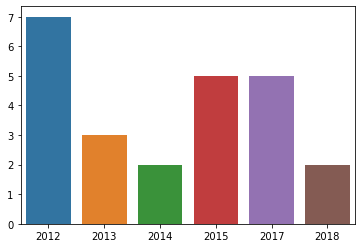

-------------------- 



numpy 



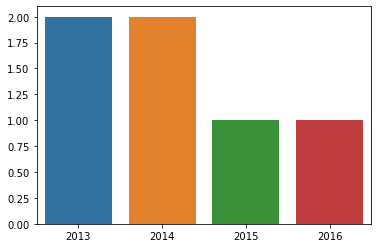

-------------------- 



oauth 



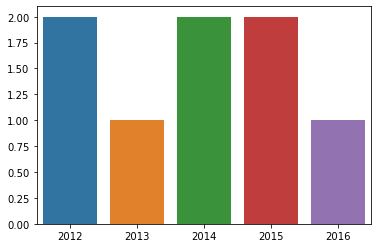

-------------------- 



oauth-2.0 



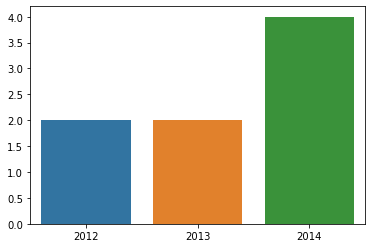

-------------------- 



object 



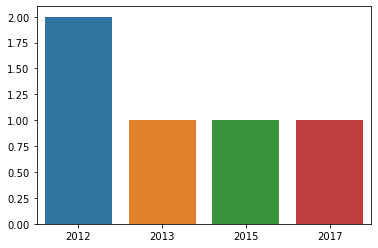

-------------------- 



objective-c 



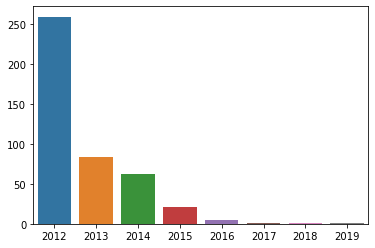

-------------------- 



oop 



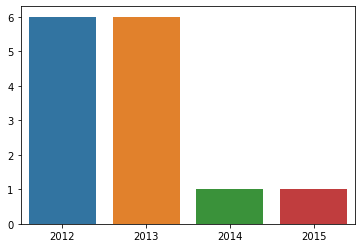

-------------------- 



opencv 



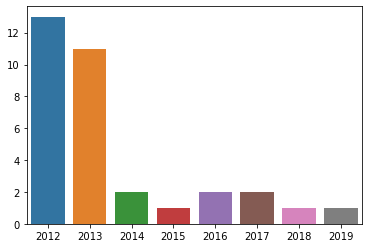

-------------------- 



opengl 



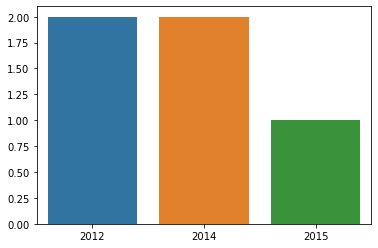

-------------------- 



openshift 



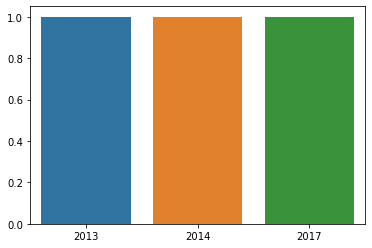

-------------------- 



openssl 



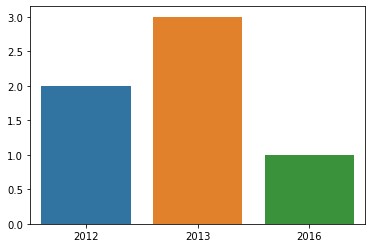

-------------------- 



operating-system 



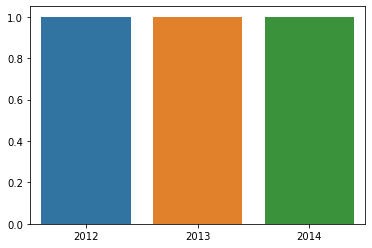

-------------------- 



optimization 



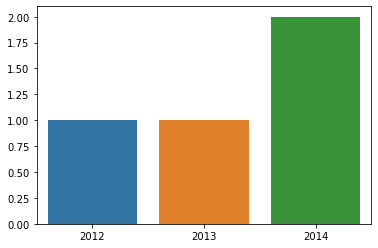

-------------------- 



oracle 



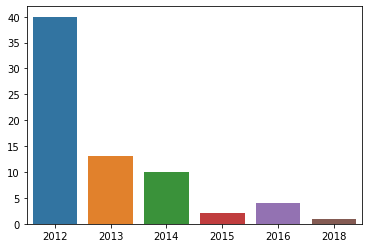

-------------------- 



oracle-sqldeveloper 



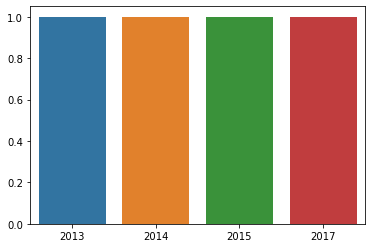

-------------------- 



package 



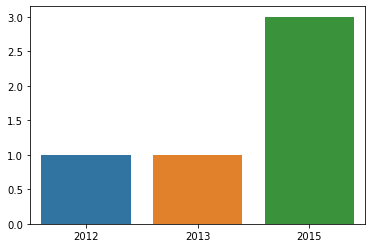

-------------------- 



pandas 



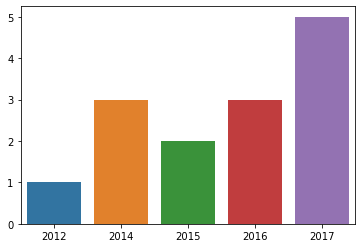

-------------------- 



path 



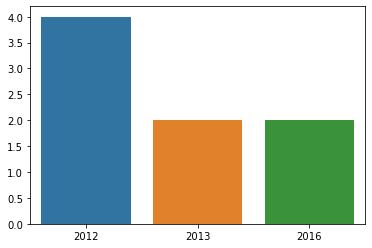

-------------------- 



paypal 



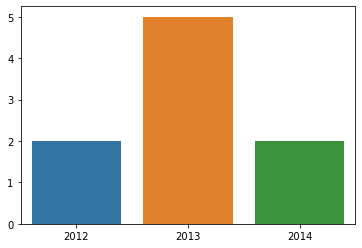

-------------------- 



pdf 



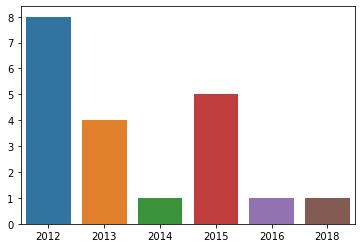

-------------------- 



performance 



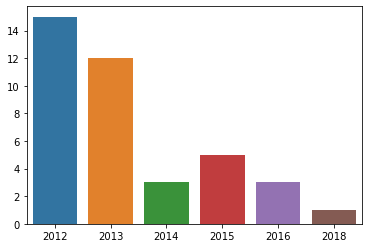

-------------------- 



perl 



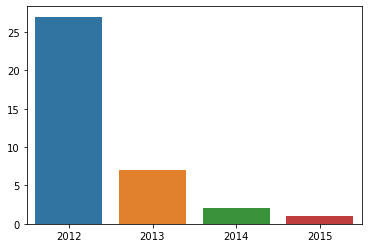

-------------------- 



permissions 



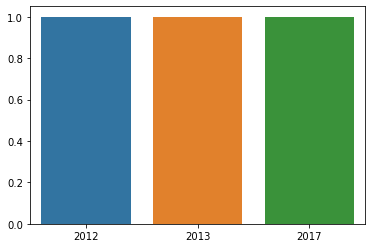

-------------------- 



pgadmin-4 



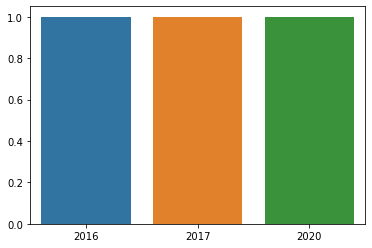

-------------------- 



phantomjs 



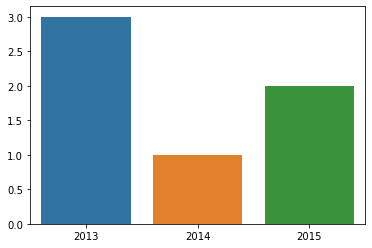

-------------------- 



php 



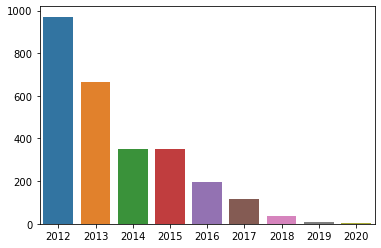

-------------------- 



phpmyadmin 



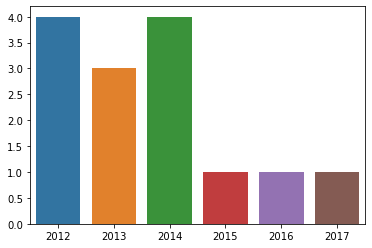

-------------------- 



phpstorm 



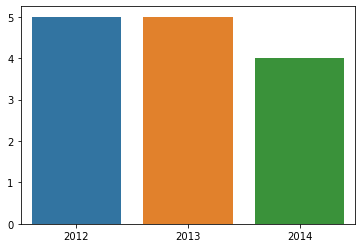

-------------------- 



phpunit 



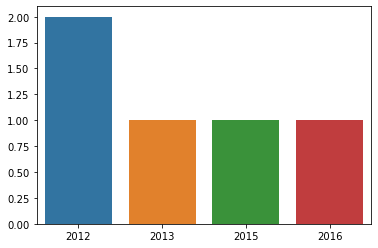

-------------------- 



pip 



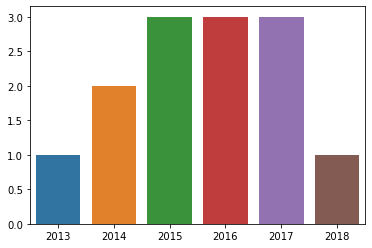

-------------------- 



playframework 



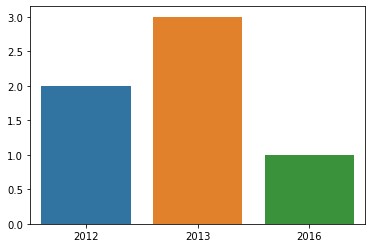

-------------------- 



plugins 



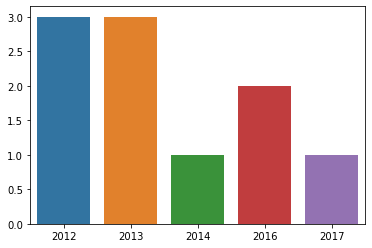

-------------------- 



post 



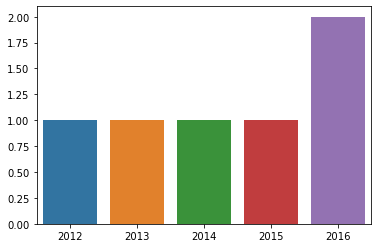

-------------------- 



postgresql 



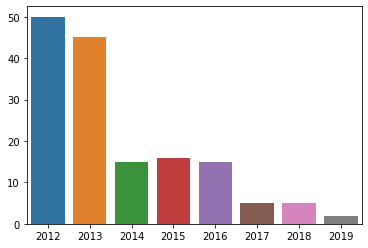

-------------------- 



postman 



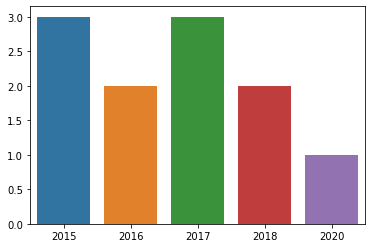

-------------------- 



powershell 



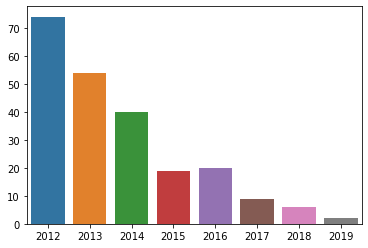

-------------------- 



printing 



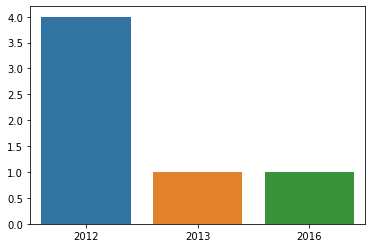

-------------------- 



prometheus 



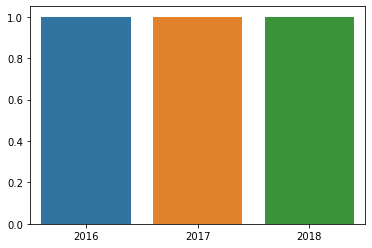

-------------------- 



protocol-buffers 



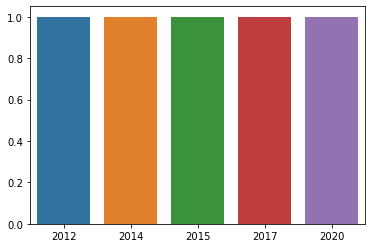

-------------------- 



proxy 



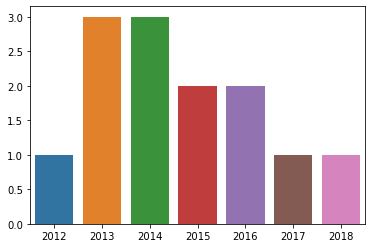

-------------------- 



puppet 



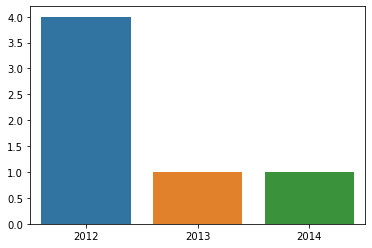

-------------------- 



push-notification 



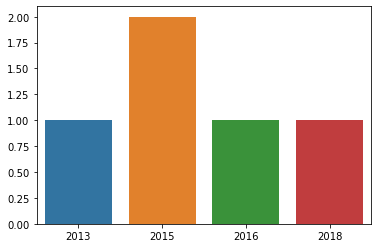

-------------------- 



pycharm 



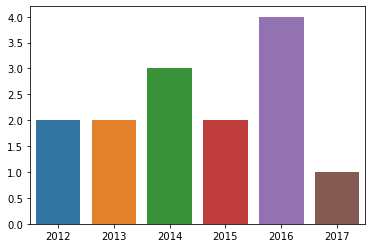

-------------------- 



pyspark 



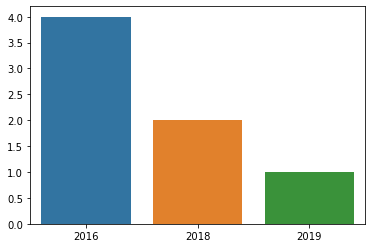

-------------------- 



python 



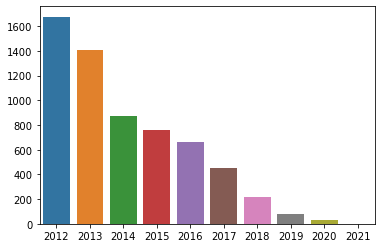

-------------------- 



python-2.7 



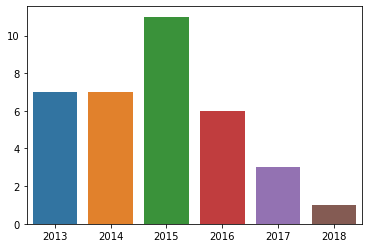

-------------------- 



python-3.x 



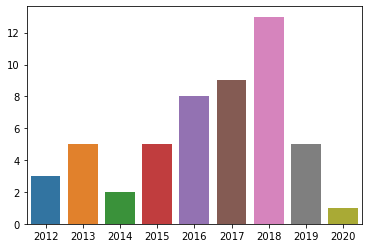

-------------------- 



qt 



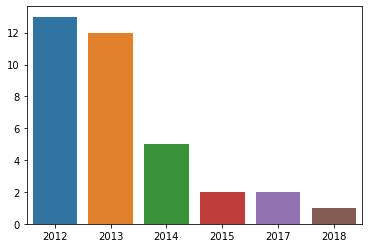

-------------------- 



r 



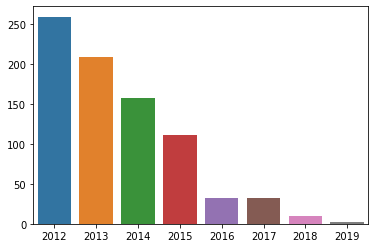

-------------------- 



rabbitmq 



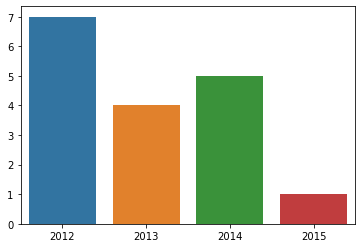

-------------------- 



random 



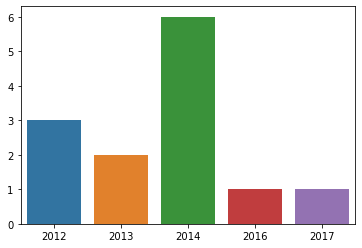

-------------------- 



raspberry-pi 



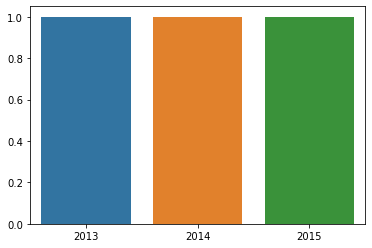

-------------------- 



razor 



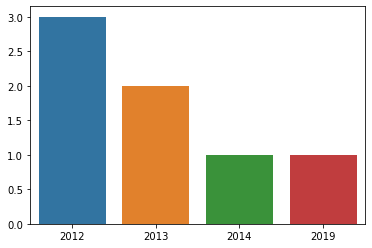

-------------------- 



react-native 



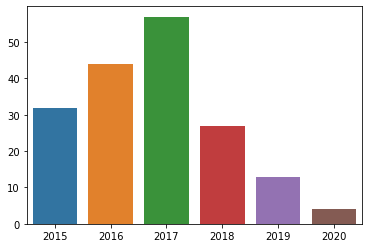

-------------------- 



react-router 



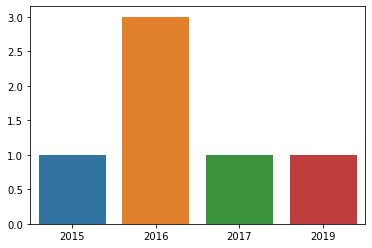

-------------------- 



reactjs 



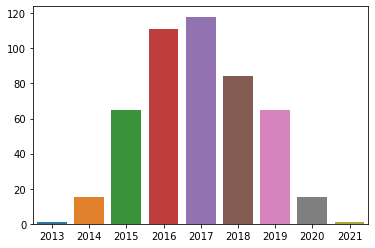

-------------------- 



recaptcha 



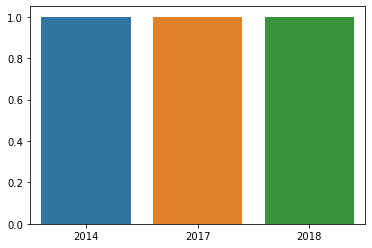

-------------------- 



redirect 



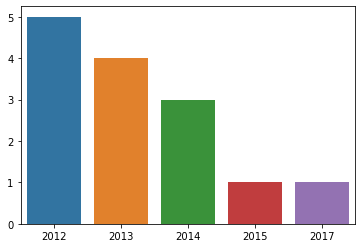

-------------------- 



redis 



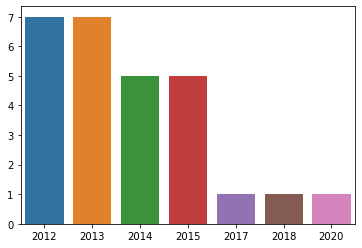

-------------------- 



redux 



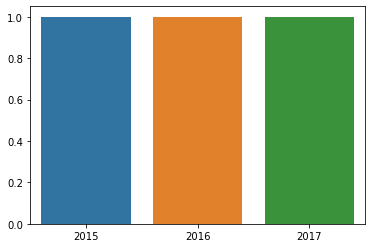

-------------------- 



regex 



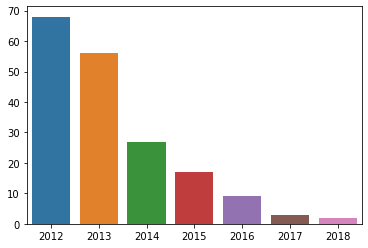

-------------------- 



replace 



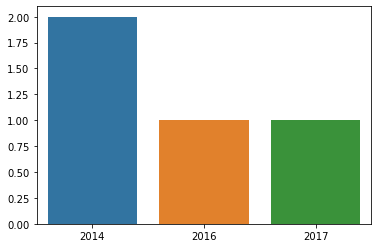

-------------------- 



reporting-services 



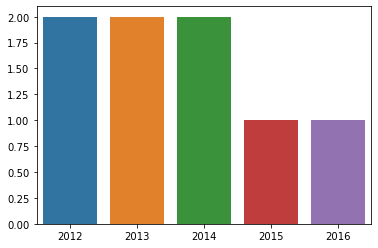

-------------------- 



rest 



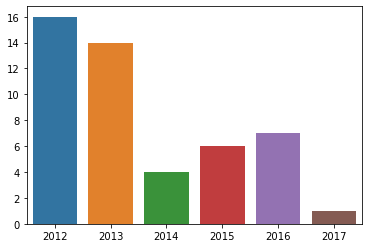

-------------------- 



ruby 



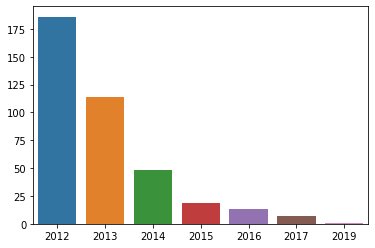

-------------------- 



ruby-on-rails 



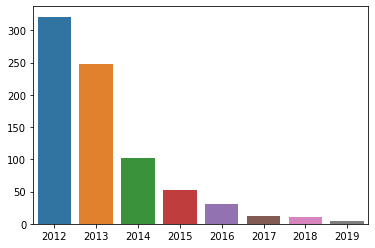

-------------------- 



ruby-on-rails-3 



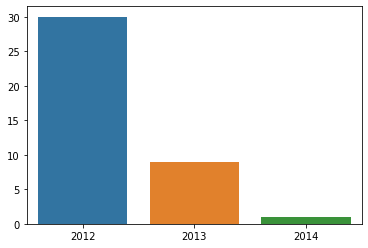

-------------------- 



ruby-on-rails-4 



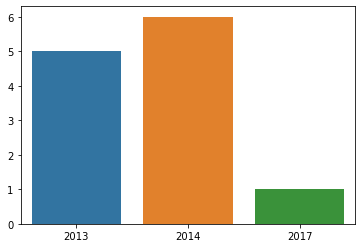

-------------------- 



rubygems 



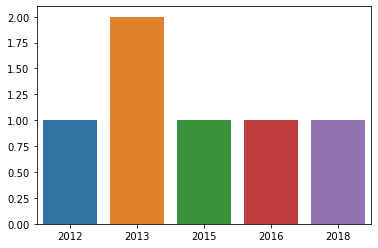

-------------------- 



rust 



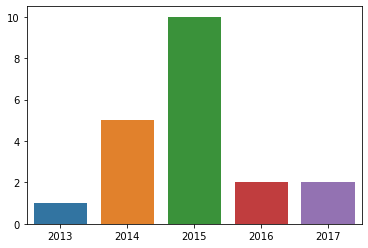

-------------------- 



rxjs 



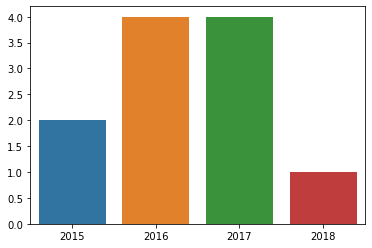

-------------------- 



sass 



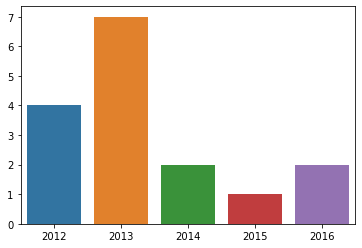

-------------------- 



sbt 



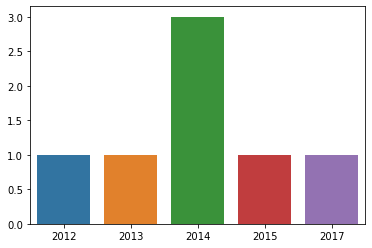

-------------------- 



scala 



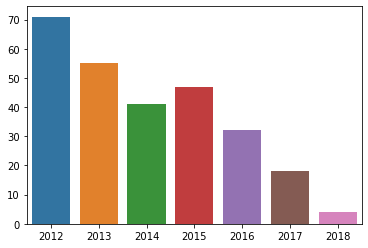

-------------------- 



scheduled-tasks 



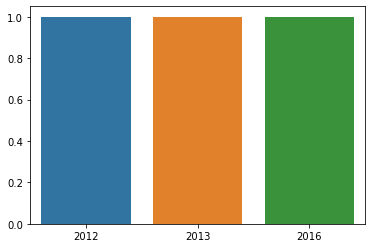

-------------------- 



scroll 



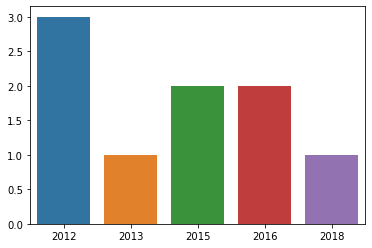

-------------------- 



sdk 



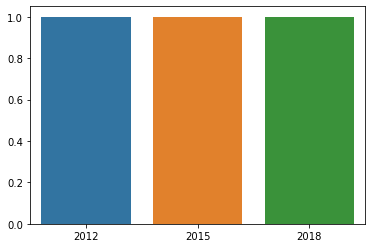

-------------------- 



search 



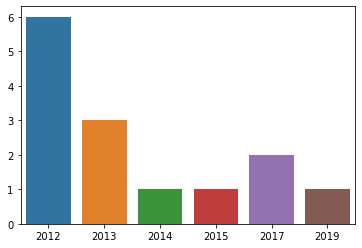

-------------------- 



security 



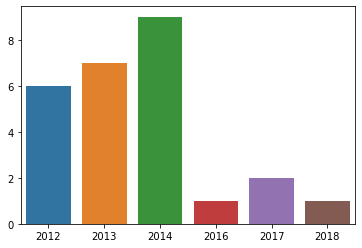

-------------------- 



sed 



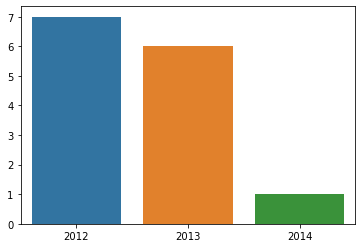

-------------------- 



select 



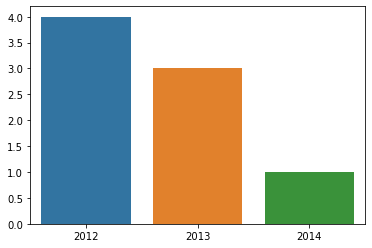

-------------------- 



selenium 



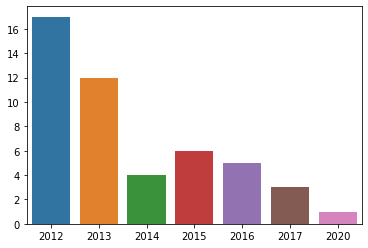

-------------------- 



selenium-webdriver 



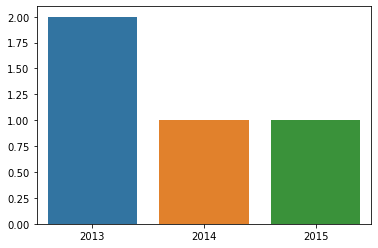

-------------------- 



serialization 



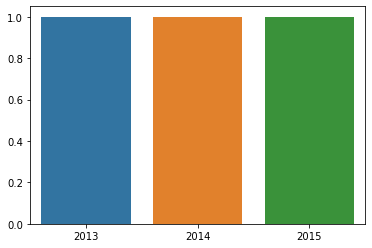

-------------------- 



server 



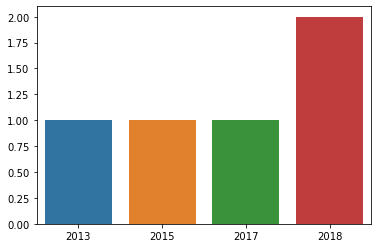

-------------------- 



service 



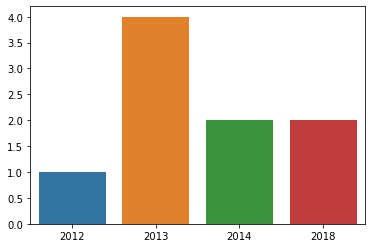

-------------------- 



servlets 



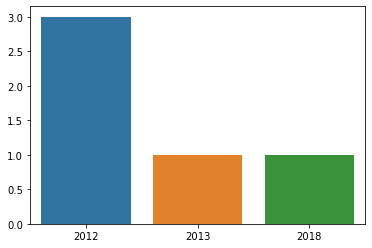

-------------------- 



session 



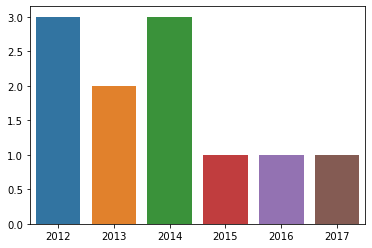

-------------------- 



shell 



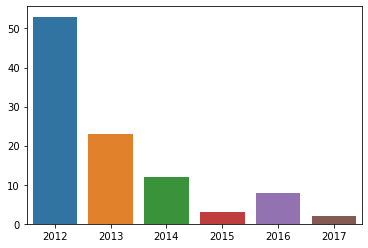

-------------------- 



sockets 



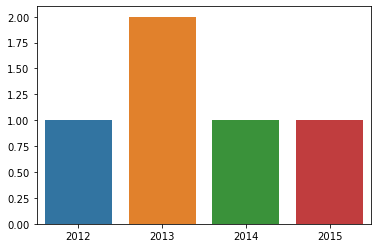

-------------------- 



solr 



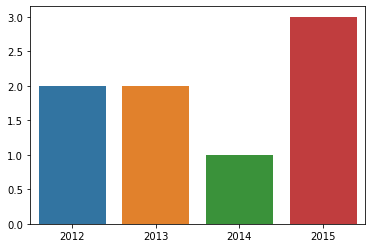

-------------------- 



sonarqube 



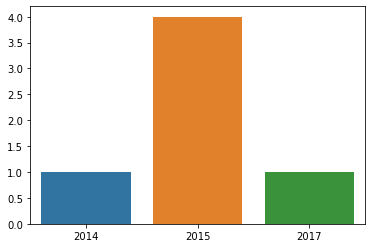

-------------------- 



sorting 



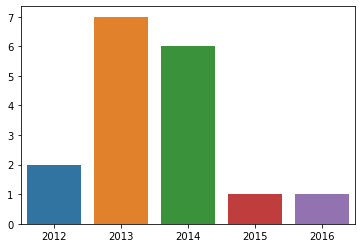

-------------------- 



split 



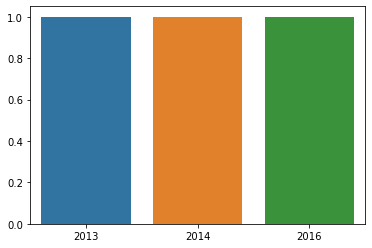

-------------------- 



spring 



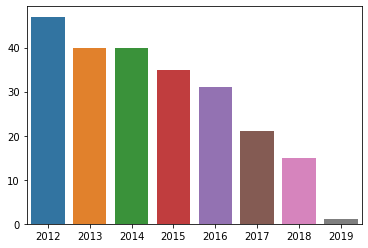

-------------------- 



spring-boot 



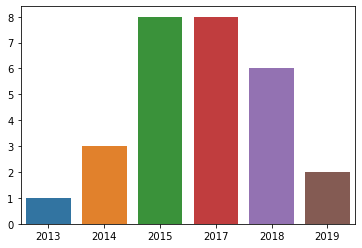

-------------------- 



spring-data 



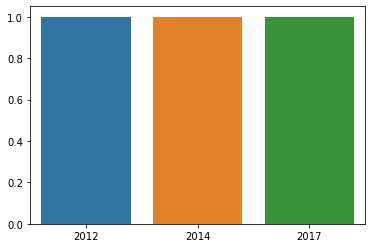

-------------------- 



spring-mvc 



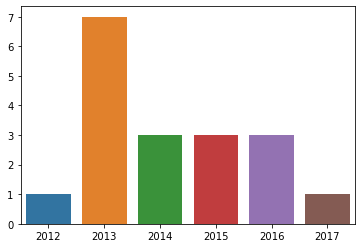

-------------------- 



sql 



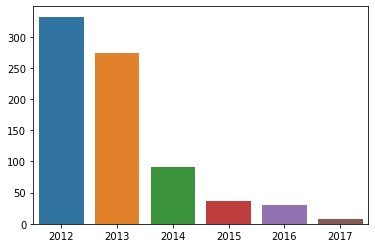

-------------------- 



sql-server 



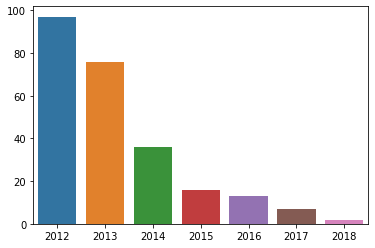

-------------------- 



sql-server-2005 



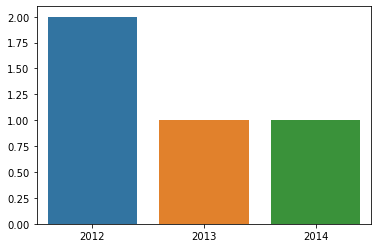

-------------------- 



sql-server-2008-r2 



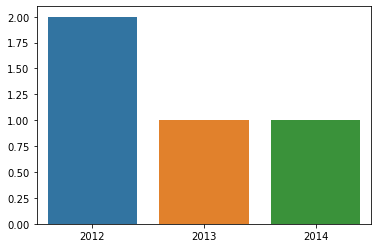

-------------------- 



sql-server-2012 



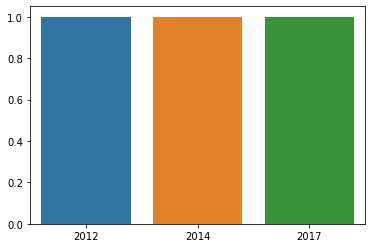

-------------------- 



sqlite 



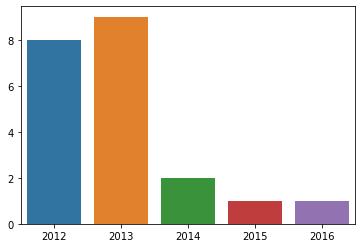

-------------------- 



ssh 



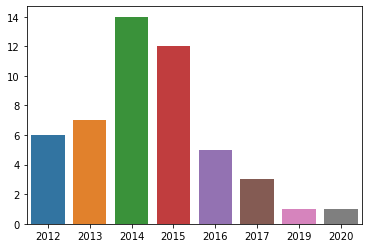

-------------------- 



ssl 



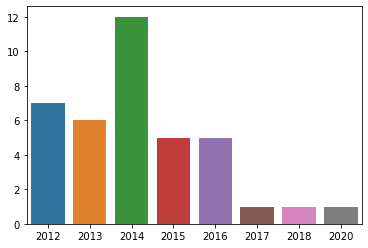

-------------------- 



stm32 



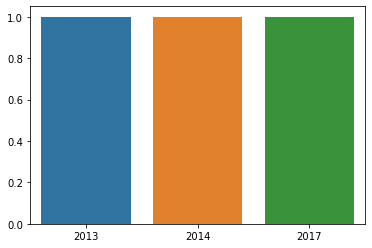

-------------------- 



storyboard 



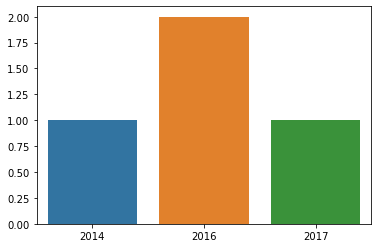

-------------------- 



string 



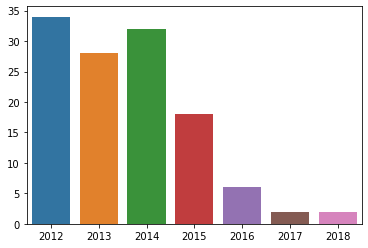

-------------------- 



sublimetext 



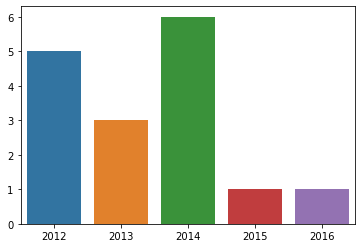

-------------------- 



sublimetext2 



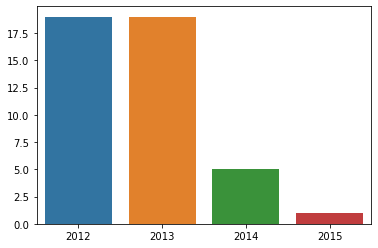

-------------------- 



sublimetext3 



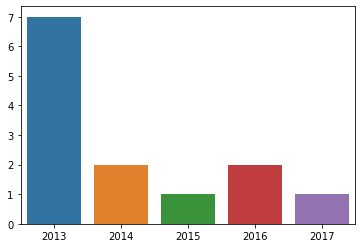

-------------------- 



svg 



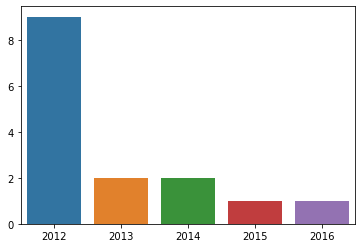

-------------------- 



svn 



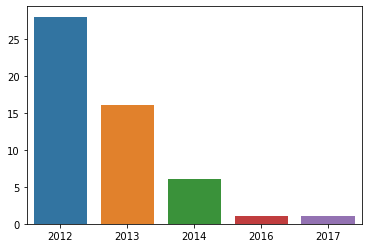

-------------------- 



swagger 



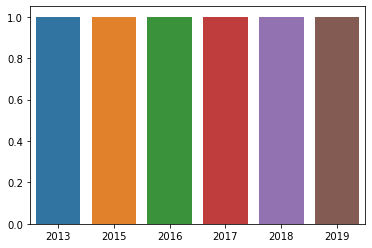

-------------------- 



swift 



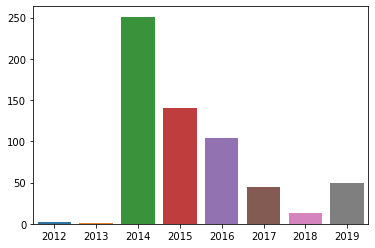

-------------------- 



symfony 



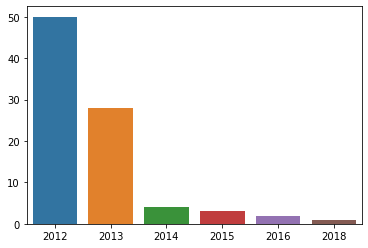

-------------------- 



syntax 



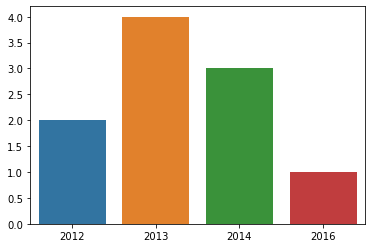

-------------------- 



syntax-highlighting 



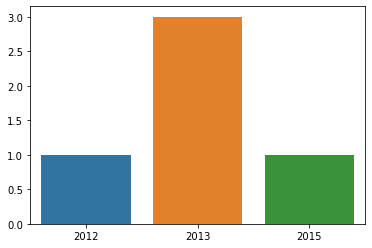

-------------------- 



tcp 



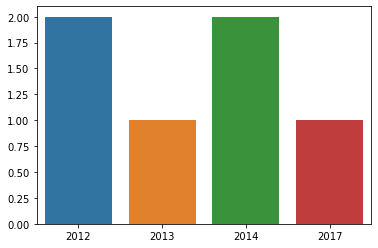

-------------------- 



teamcity 



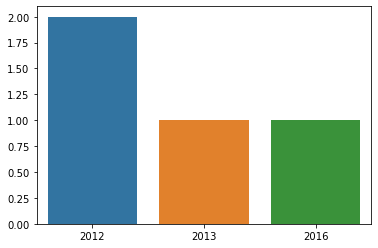

-------------------- 



templates 



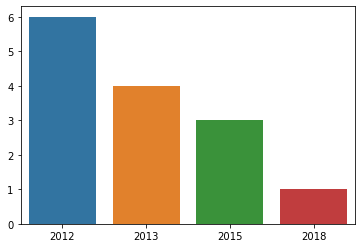

-------------------- 



tensorflow 



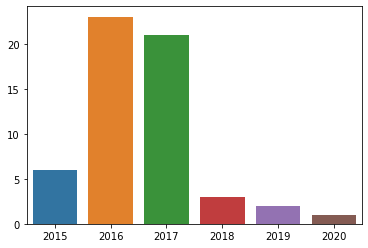

-------------------- 



terminal 



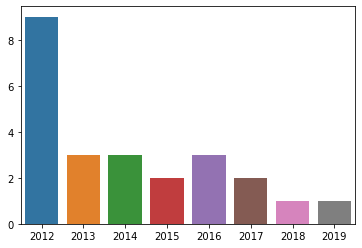

-------------------- 



terraform 



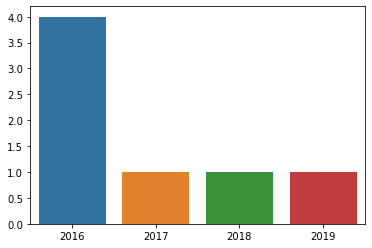

-------------------- 



testing 



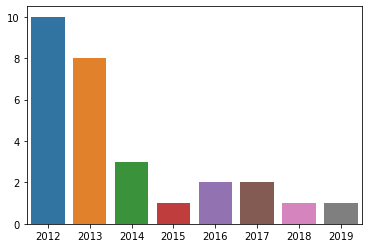

-------------------- 



text 



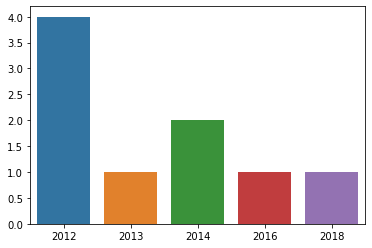

-------------------- 



tfs 



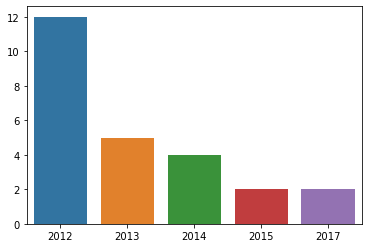

-------------------- 



themes 



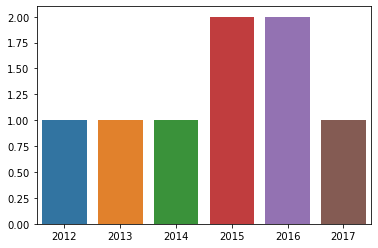

-------------------- 



time 



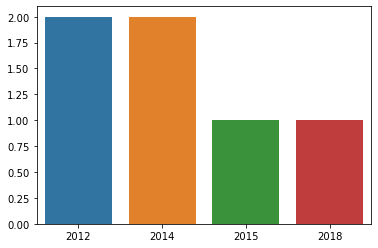

-------------------- 



tmux 



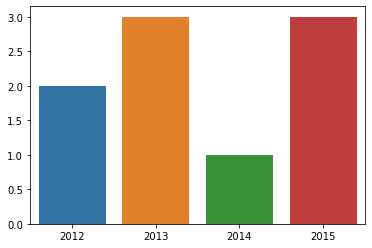

-------------------- 



tomcat 



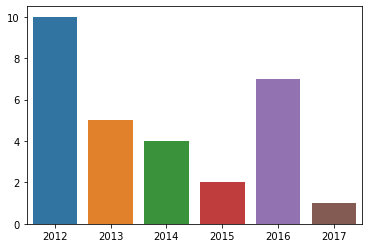

-------------------- 



travis-ci 



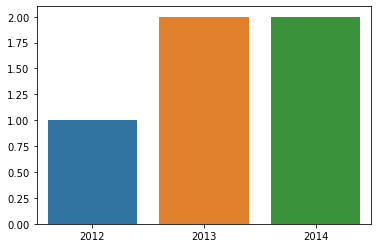

-------------------- 



twitter 



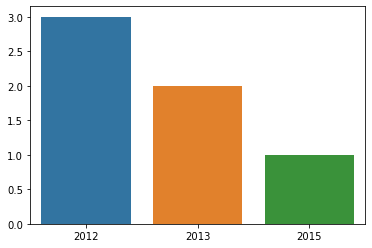

-------------------- 



twitter-bootstrap 



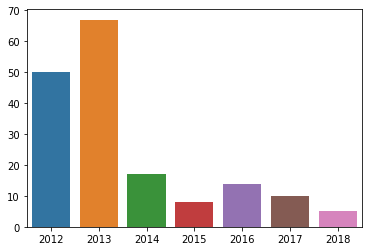

-------------------- 



twitter-bootstrap-3 



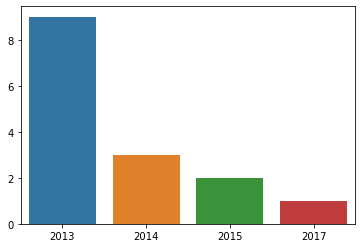

-------------------- 



typescript 



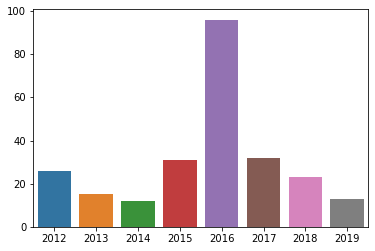

-------------------- 



ubuntu 



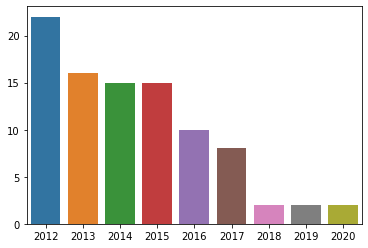

-------------------- 



uicollectionview 



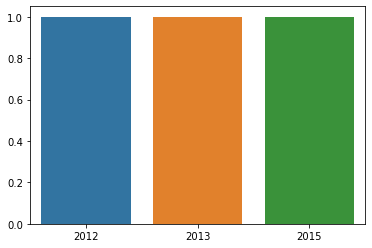

-------------------- 



uinavigationbar 



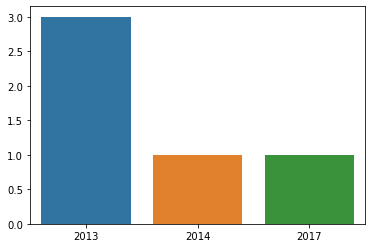

-------------------- 



uitableview 



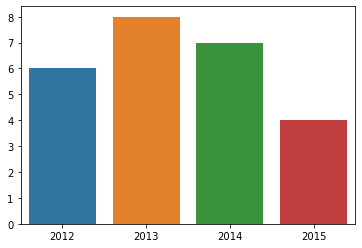

-------------------- 



uitextfield 



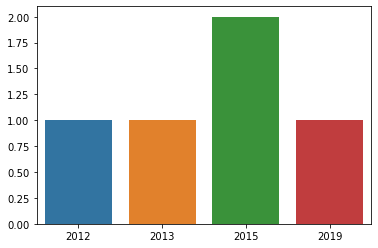

-------------------- 



uiview 



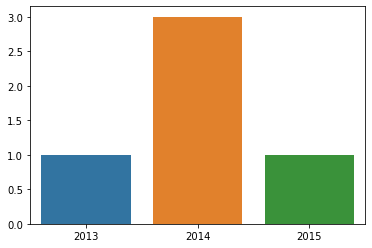

-------------------- 



unicode 



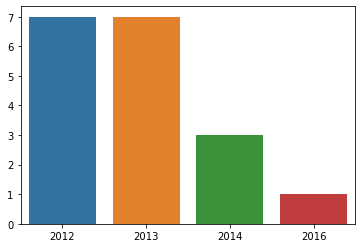

-------------------- 



unit-testing 



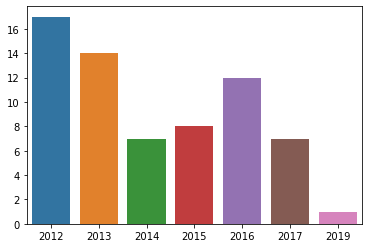

-------------------- 



unity3d 



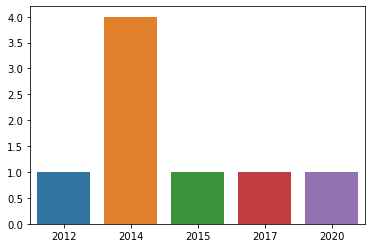

-------------------- 



unix 



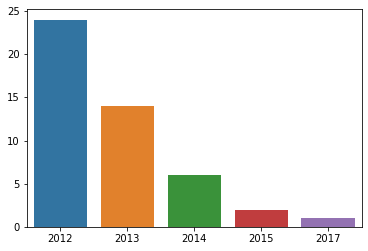

-------------------- 



url 



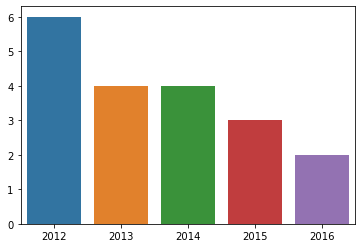

-------------------- 



user-interface 



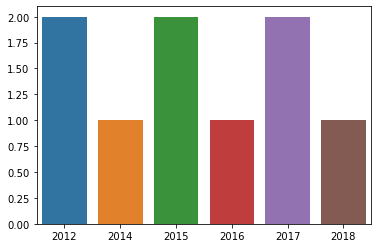

-------------------- 



vagrant 



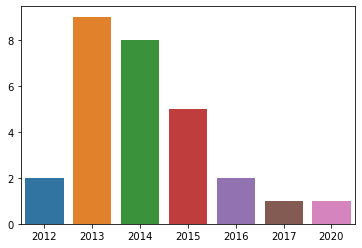

-------------------- 



validation 



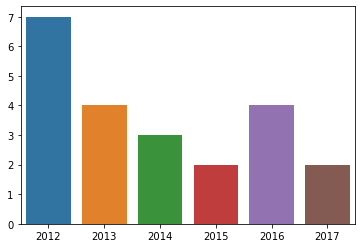

-------------------- 



variables 



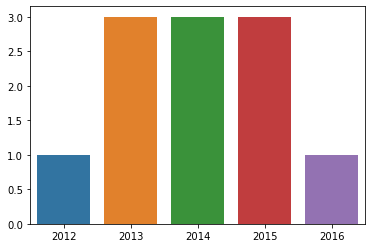

-------------------- 



vb.net 



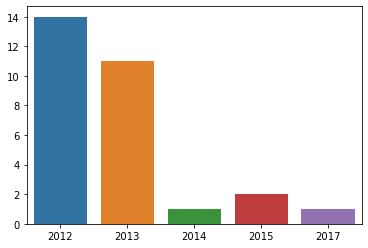

-------------------- 



vba 



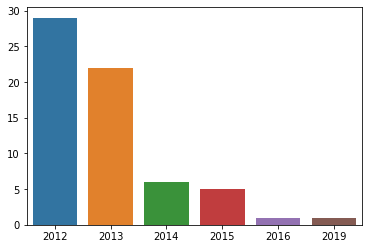

-------------------- 



vbscript 



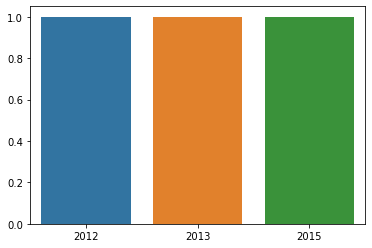

-------------------- 



video 



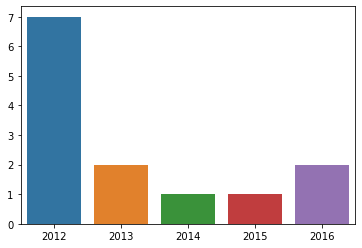

-------------------- 



vim 



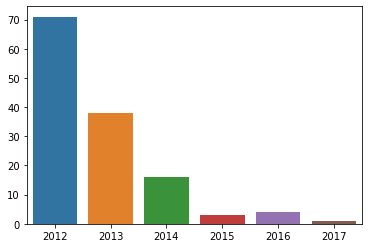

-------------------- 



virtual-machine 



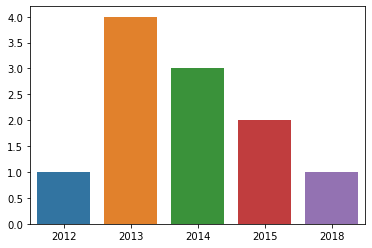

-------------------- 



virtualbox 



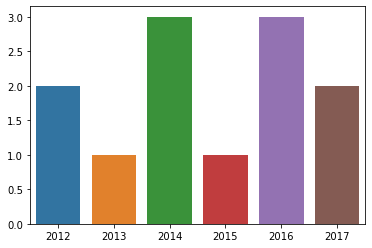

-------------------- 



virtualenv 



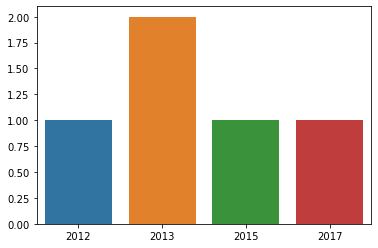

-------------------- 



visual-studio 



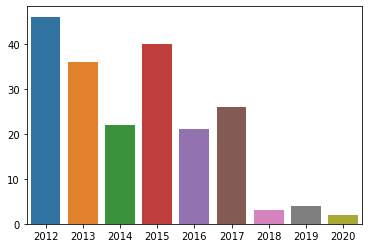

-------------------- 



visual-studio-2010 



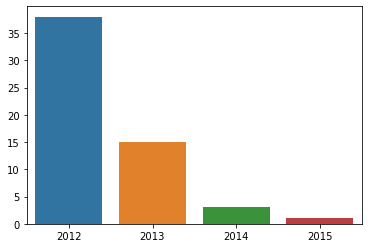

-------------------- 



visual-studio-2012 



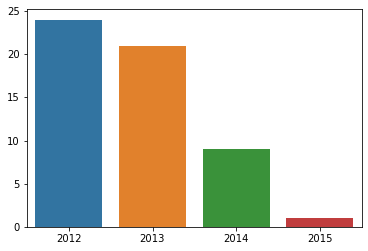

-------------------- 



visual-studio-2013 



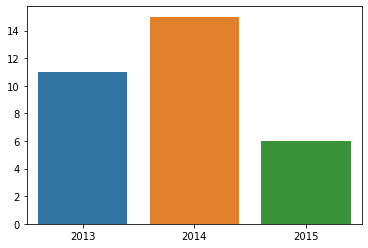

-------------------- 



visual-studio-2015 



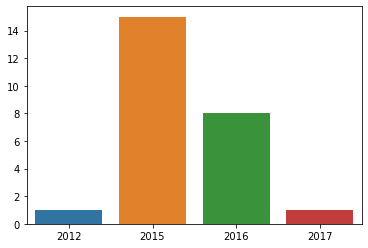

-------------------- 



visual-studio-2017 



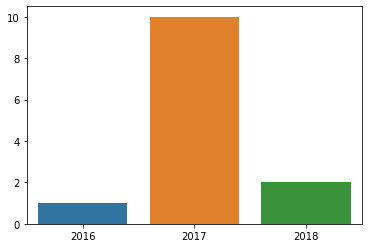

-------------------- 



visual-studio-code 



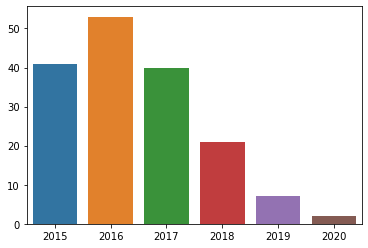

-------------------- 



vue.js 



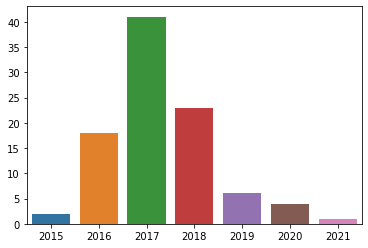

-------------------- 



web 



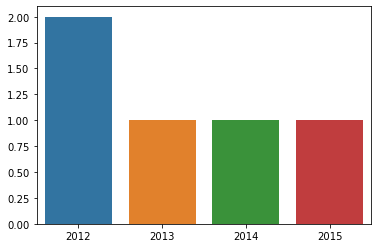

-------------------- 



web-services 



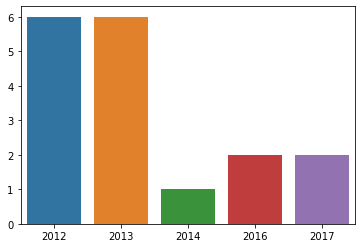

-------------------- 



webpack 



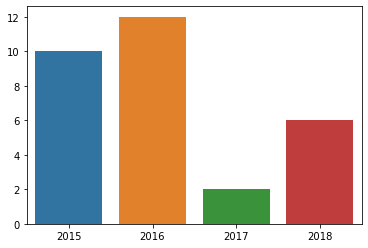

-------------------- 



webrtc 



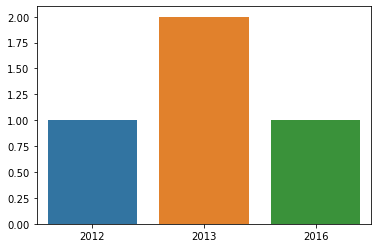

-------------------- 



websocket 



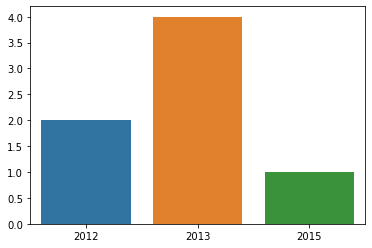

-------------------- 



webstorm 



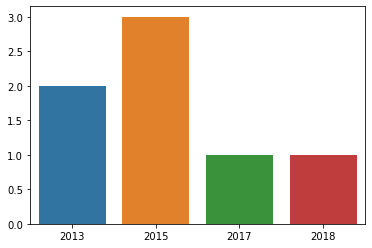

-------------------- 



webview 



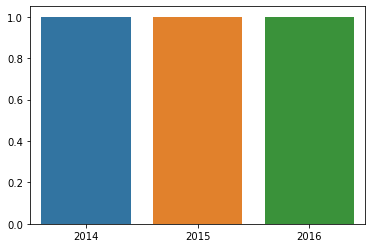

-------------------- 



windows 



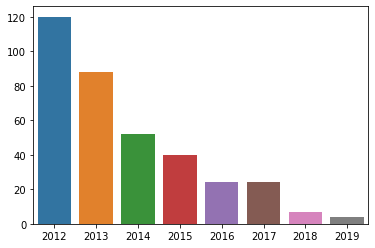

-------------------- 



windows-10 



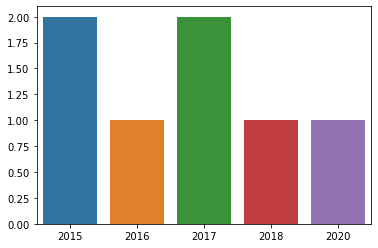

-------------------- 



windows-7 



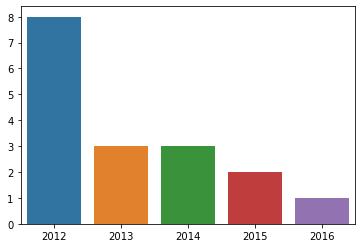

-------------------- 



windows-8 



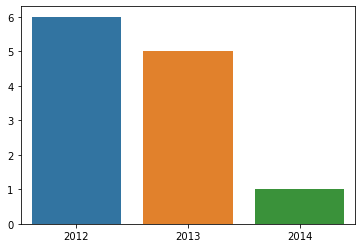

-------------------- 



windows-services 



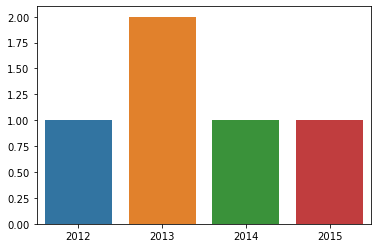

-------------------- 



winforms 



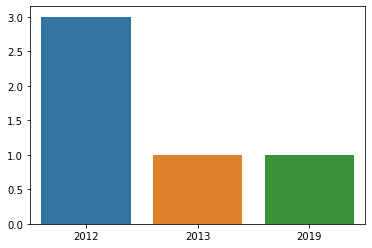

-------------------- 



wix 



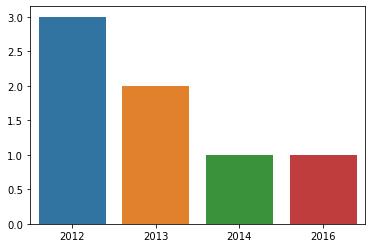

-------------------- 



wordpress 



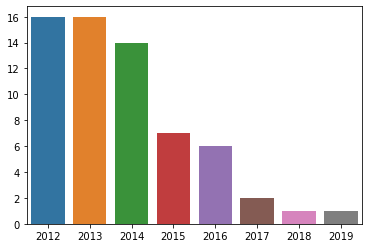

-------------------- 



wpf 



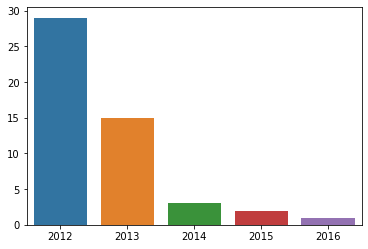

-------------------- 



xamarin 



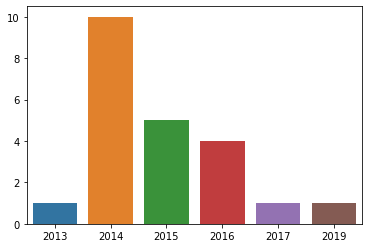

-------------------- 



xamarin.ios 



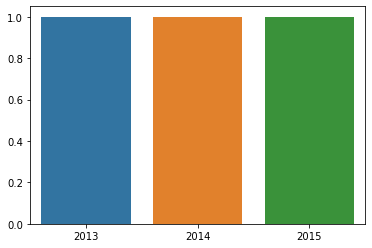

-------------------- 



xaml 



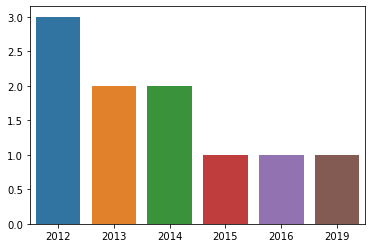

-------------------- 



xcode 



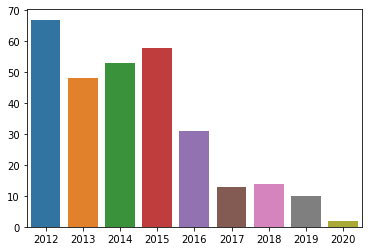

-------------------- 



xml 



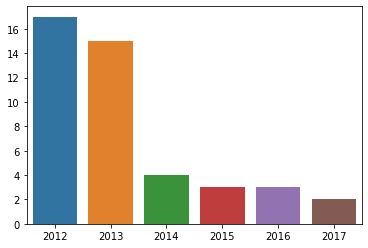

-------------------- 



yaml 



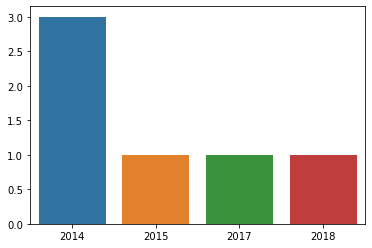

-------------------- 



yarnpkg 



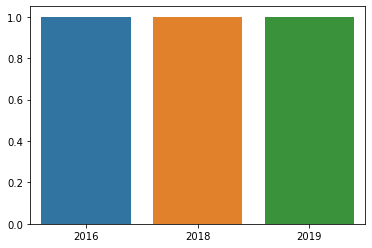

-------------------- 



yii2 



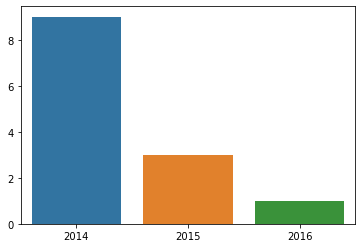

-------------------- 



youtube 



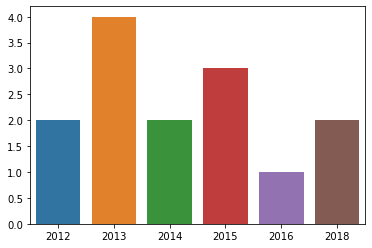

-------------------- 



zsh 



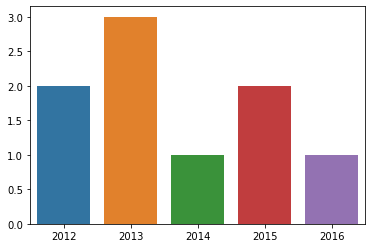

-------------------- 





In [127]:
for i in query.groupby('Tag_list0'):
    if i[1].CreationDate.apply(pd.to_datetime).dt.year.value_counts().shape[0]>=3:
        print(i[0],'\n')
        plt.figure()
        sns.barplot(x=i[1].CreationDate.apply(pd.to_datetime).dt.year.value_counts().index,y=i[1]
                    .CreationDate.apply(pd.to_datetime).dt.year.value_counts().values)
        plt.show()
        print(10*'--',3*'\n')

## Suppression des tags les moins courants.

En utilisant les observation que l'on a fait on va épurer notre dataset en ne conservant que :
<ul>
    <li>Les tags les plus fréquents
    <li>Les tags présents sur plusieurs années
</ul>        
On va aussi remplacer certains tags par des tags synonymes.

### Tags synonymes.

Commençons par remplacer les tag par leur synonymes.

In [128]:
for i in query.columns:
    if 'Tag_l' in i:
        query[i].replace(map_dict,inplace=True)

### Tags les plus fréquents.

<AxesSubplot:>

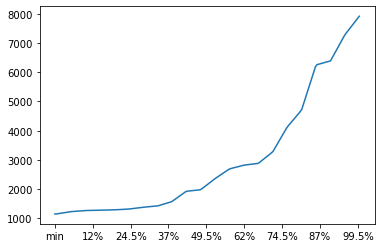

In [129]:
tags_frequency[tags_frequency>tags_frequency.sum()/200].describe(percentiles=np.arange(200)/200)[3:].plot()

In [130]:
tags_frequency[tags_frequency>tags_frequency.sum()/1000]

javascript            7916.0
android               7281.0
java                  6384.0
python                6249.0
ios                   4708.0
                       ...  
sql-server-2008        227.0
matplotlib             222.0
csv                    224.0
exception              265.0
selenium-webdriver     496.0
Length: 127, dtype: float64

In [131]:
tags_frequency.sum()/1000

220.326

On va supprimer les entrées qui n'ont pas au moins un de leurs tags avec plus de 225 incidences.

In [132]:
tag_set=set(tags_frequency[tags_frequency>tags_frequency.sum()/1000].index)
new_index=[]
for i in query.index:
    if set(query.loc[i,[j for j in query.columns if 'Tag_l' in j]])&tag_set:
        new_index.append(i)

In [133]:
query=query.loc[new_index]

### Tags présents sur plusieurs années.

In [134]:
tag_set=[]
for j in query.columns:
    if 'Tag_l' in j:
        for i in query.groupby(j):
            if i[1].CreationDate.apply(pd.to_datetime).dt.year.value_counts().shape[0]>=5:
                tag_set.append(i[0])

In [135]:
len(set(tag_set))

1040

In [136]:
tag_set=set(tag_set)

In [137]:
new_index=[]
for i in query.index:
    if set(query.loc[i,[j for j in query.columns if 'Tag_l' in j]])&tag_set:
        new_index.append(i)

In [138]:
query=query.loc[new_index]

## Selection de colonnes et ajout de nouvelles features.

On va maintenant ajouter de nouvelles feature en prévision d'un apprentissage supervisé.

Rappelons les colonnes du jeu de données.

In [139]:
query.columns

Index(['AcceptedAnswerId', 'AnswerCount', 'Body', 'ClosedDate', 'CommentCount',
       'CreationDate', 'FavoriteCount', 'Id', 'LastActivityDate',
       'LastEditDate', 'LastEditorDisplayName', 'LastEditorUserId',
       'OwnerUserId', 'Score', 'Tags', 'Title', 'ViewCount', 'Body_text',
       'first_paragraph_uncleaned', 'all_paragraphs', 'Body_words',
       'Title_words', 'Tag_list0', 'Tag_list1', 'Tag_list2', 'Tag_list3',
       'Tag_list4', 'Body_Bigrams', 'Body_Trigrams'],
      dtype='object')

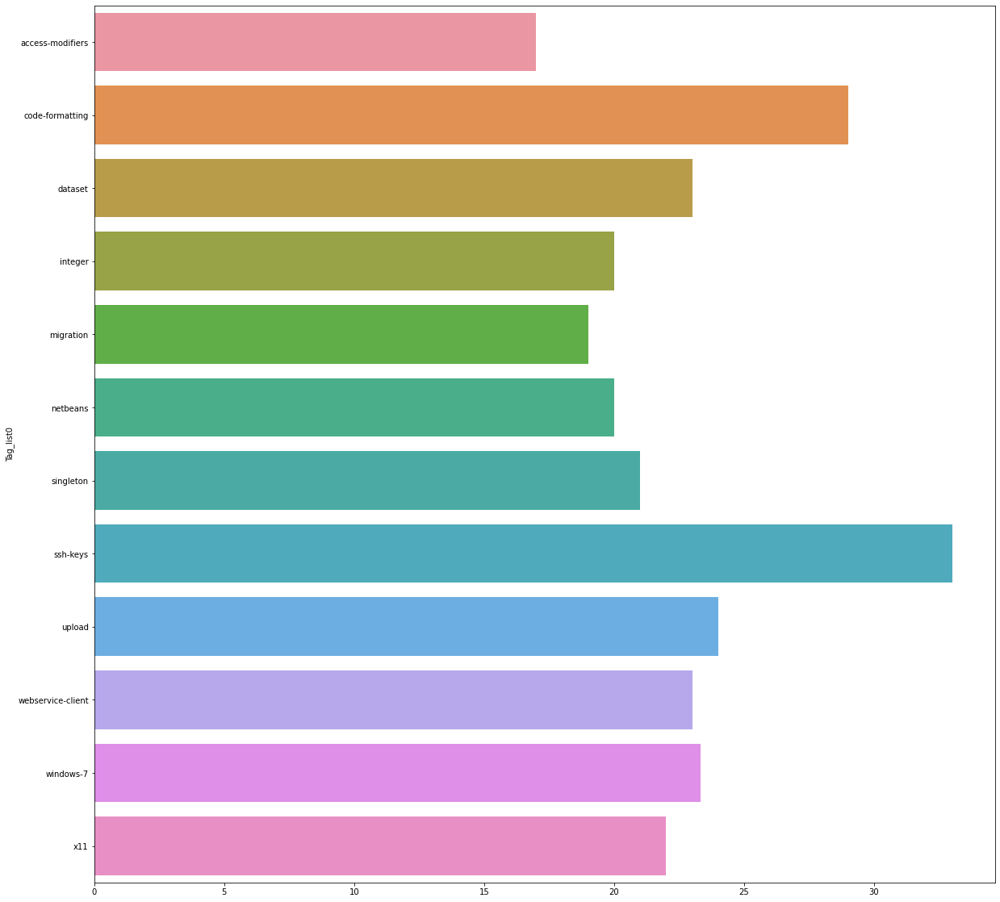

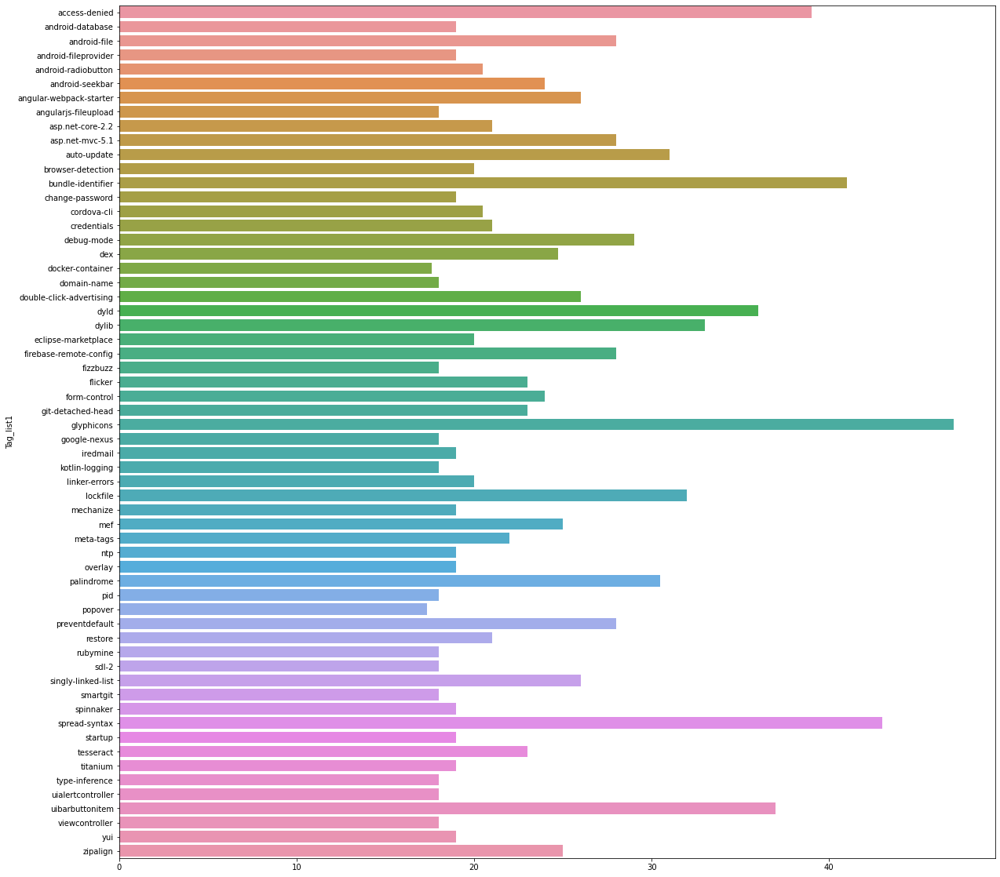

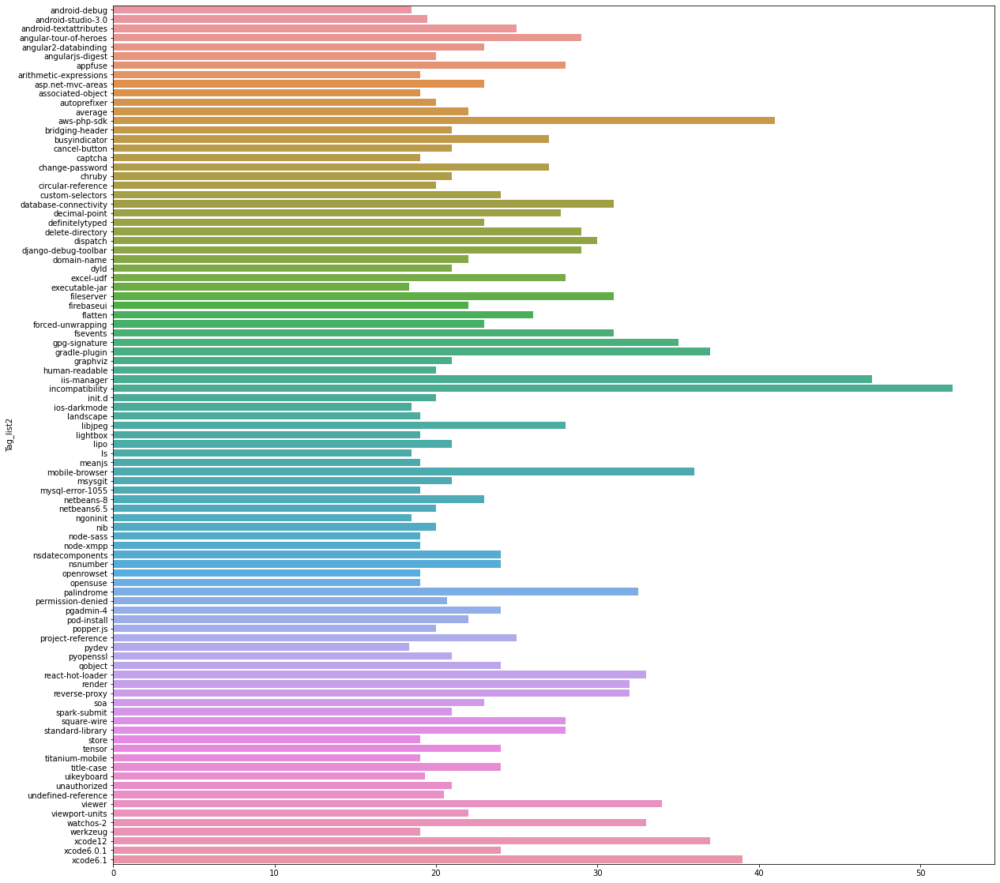

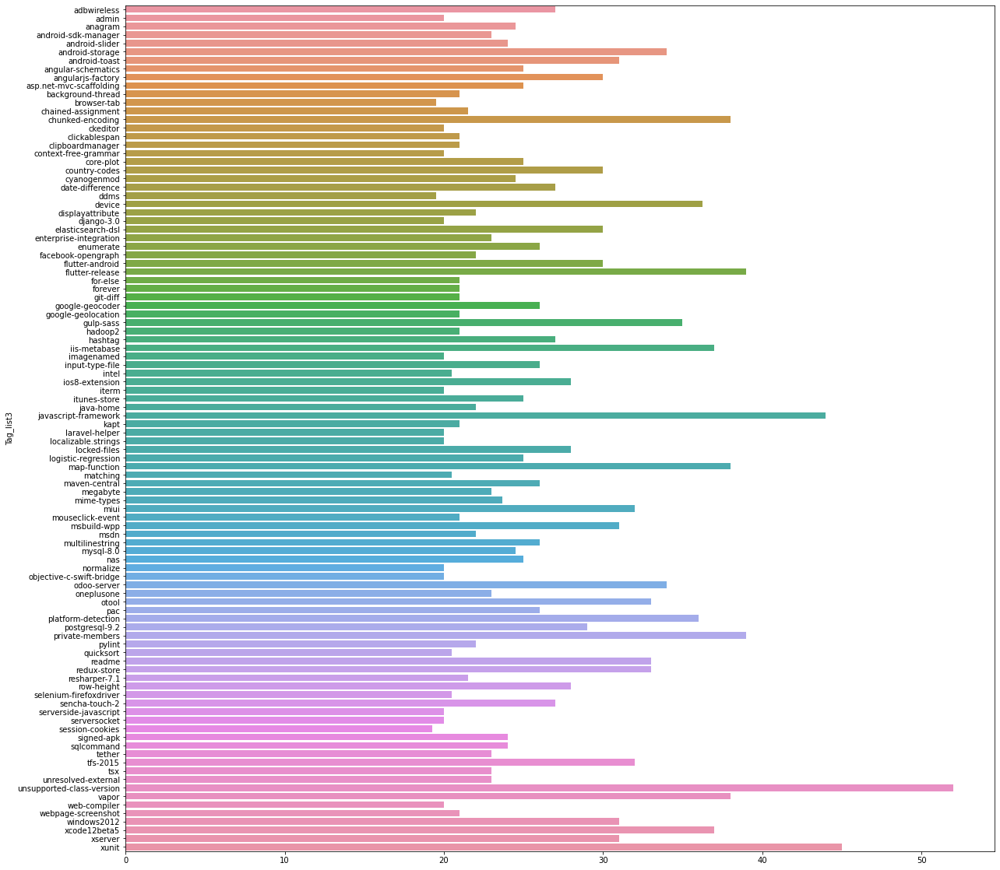

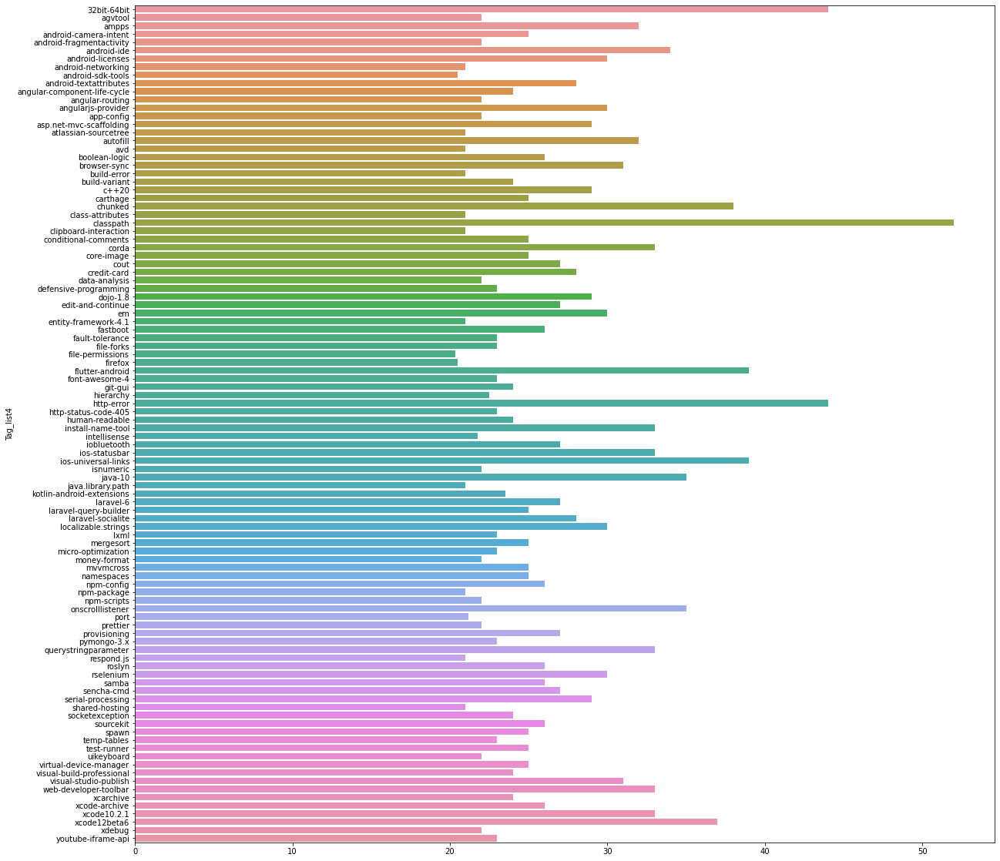

In [140]:
x=dict()
for i in query.columns:
    if 'Tag_l' in i:
        plt.figure(figsize=(20,20))
        sns.barplot(y=query.groupby(i).AnswerCount.mean()[query.groupby(i).AnswerCount.mean()>20 +int(i[-1])-4].index,
                    x=query.groupby(i).AnswerCount.mean()[query.groupby(i).AnswerCount.mean()>20+int(i[-1])-4].values,
                    orient='horizontal')
        plt.show()
del x

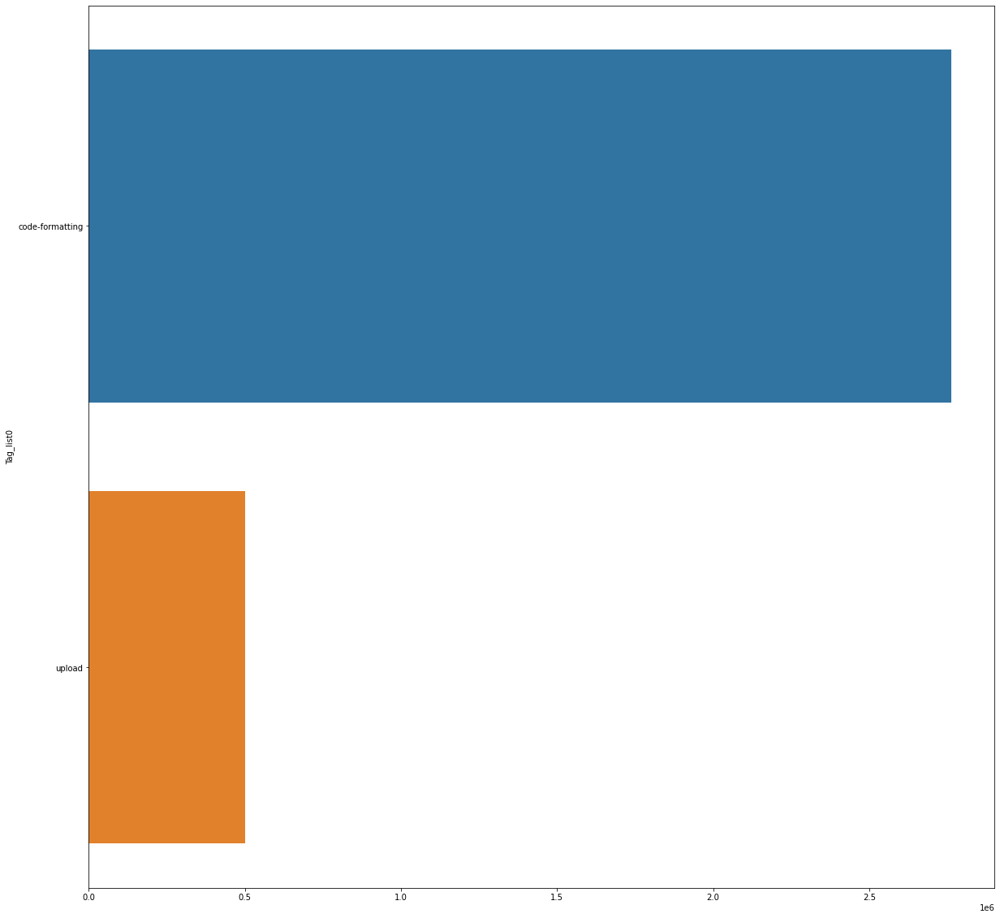

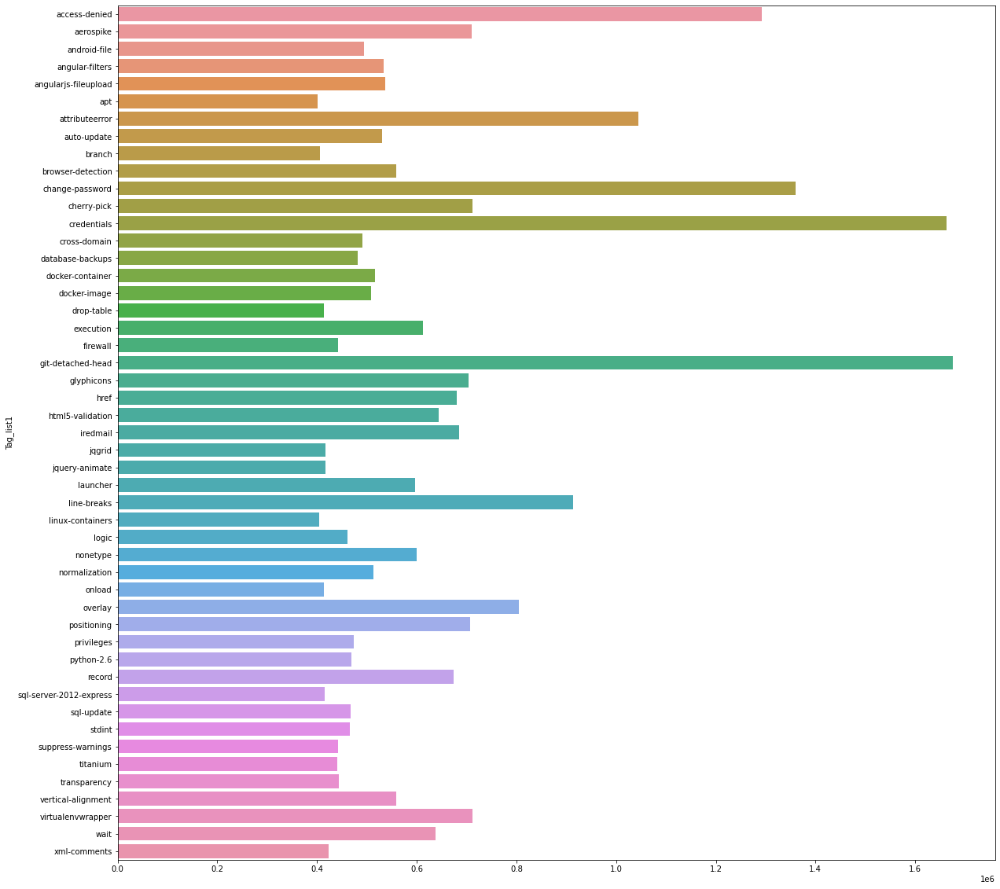

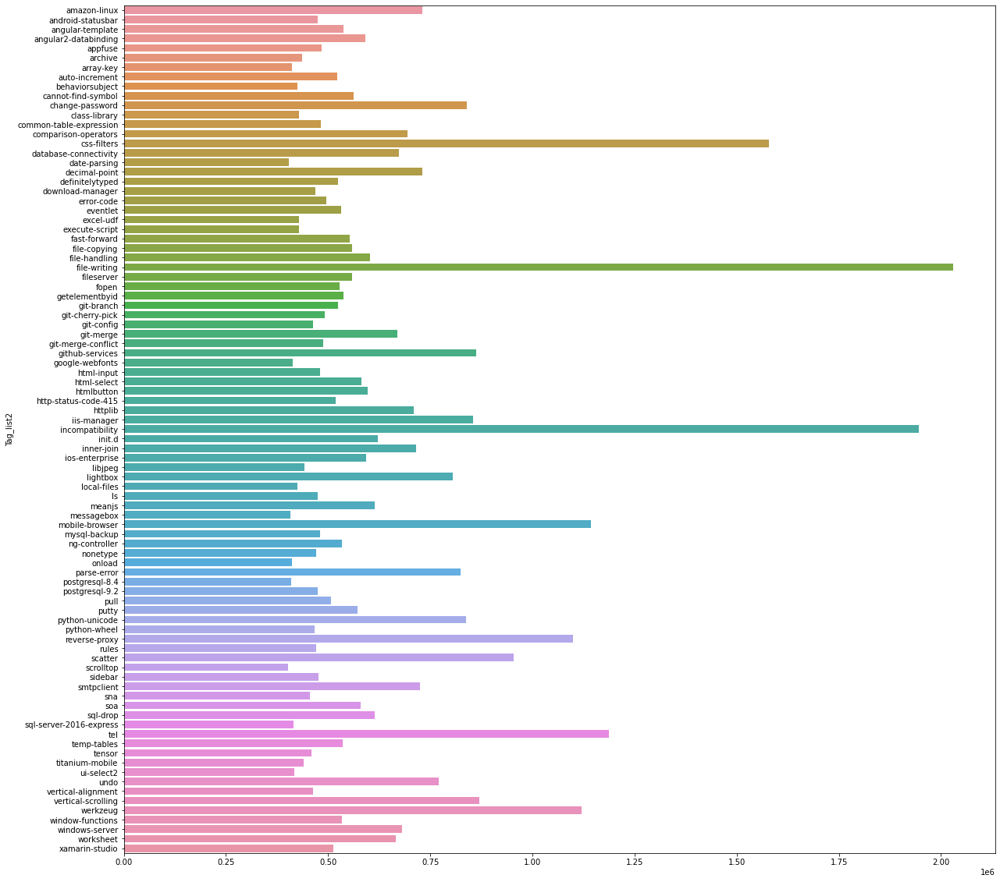

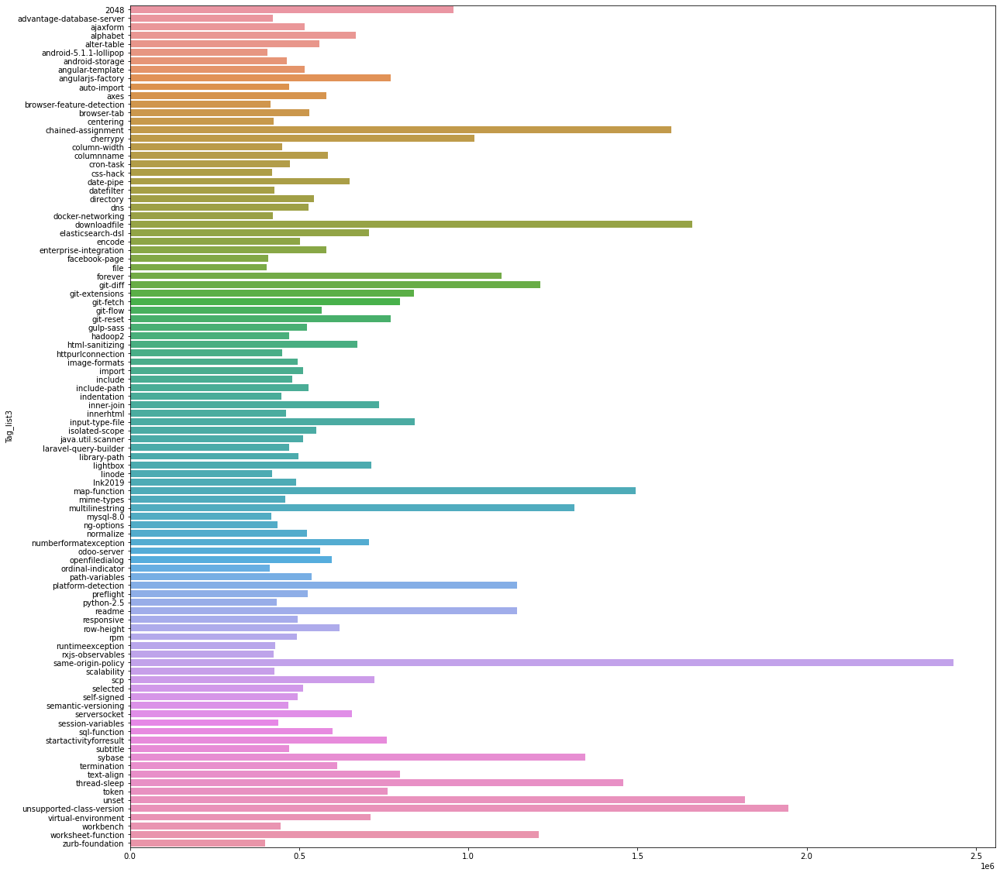

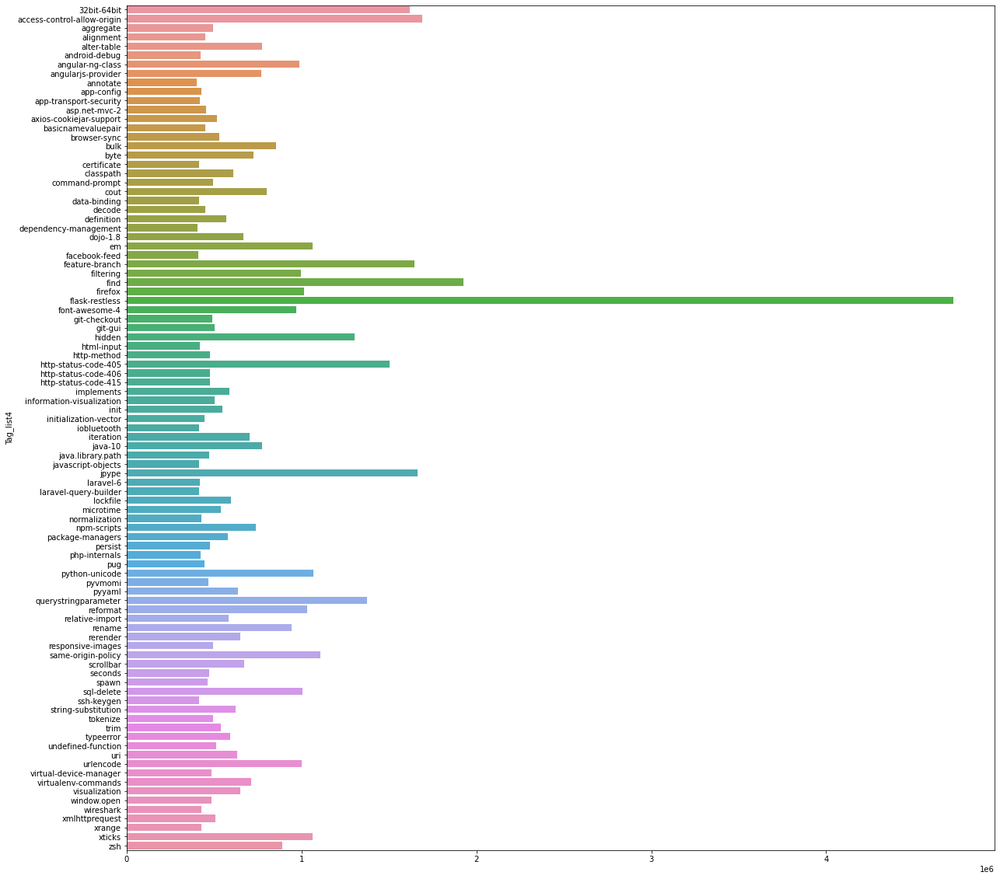

In [141]:
x=dict()
for i in query.columns:
    if 'Tag_l' in i:
        plt.figure(figsize=(20,20))
        sns.barplot(y=query.groupby(i).ViewCount.mean()[query.groupby(i).ViewCount.mean()>0.4*1e6].index,
                    x=query.groupby(i).ViewCount.mean()[query.groupby(i).ViewCount.mean()>0.4*1e6].values,
                    orient='horizontal')
        plt.show()
del x

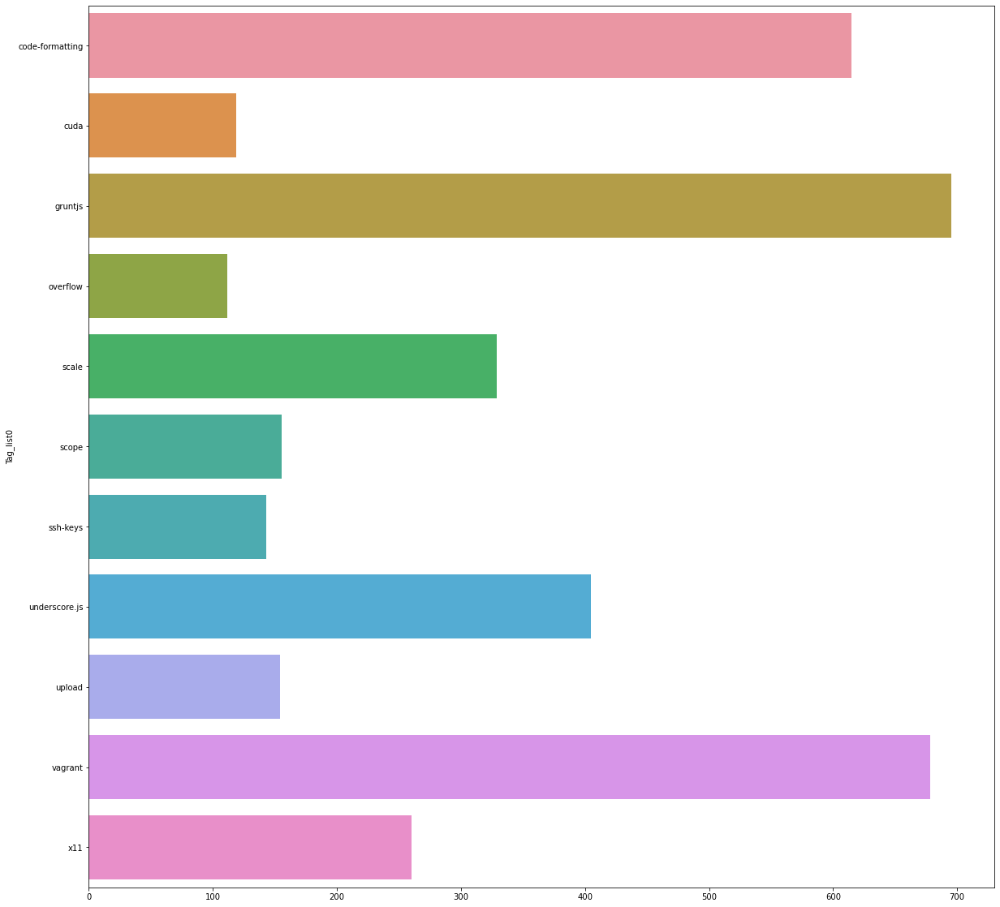

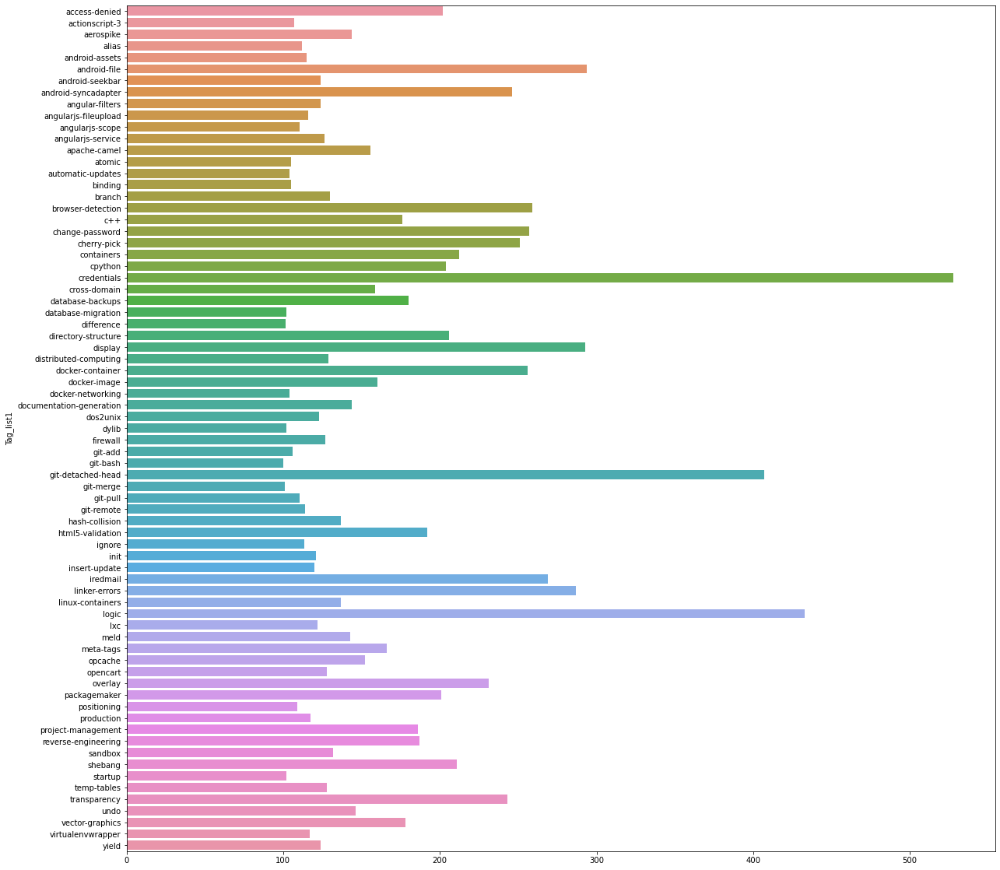

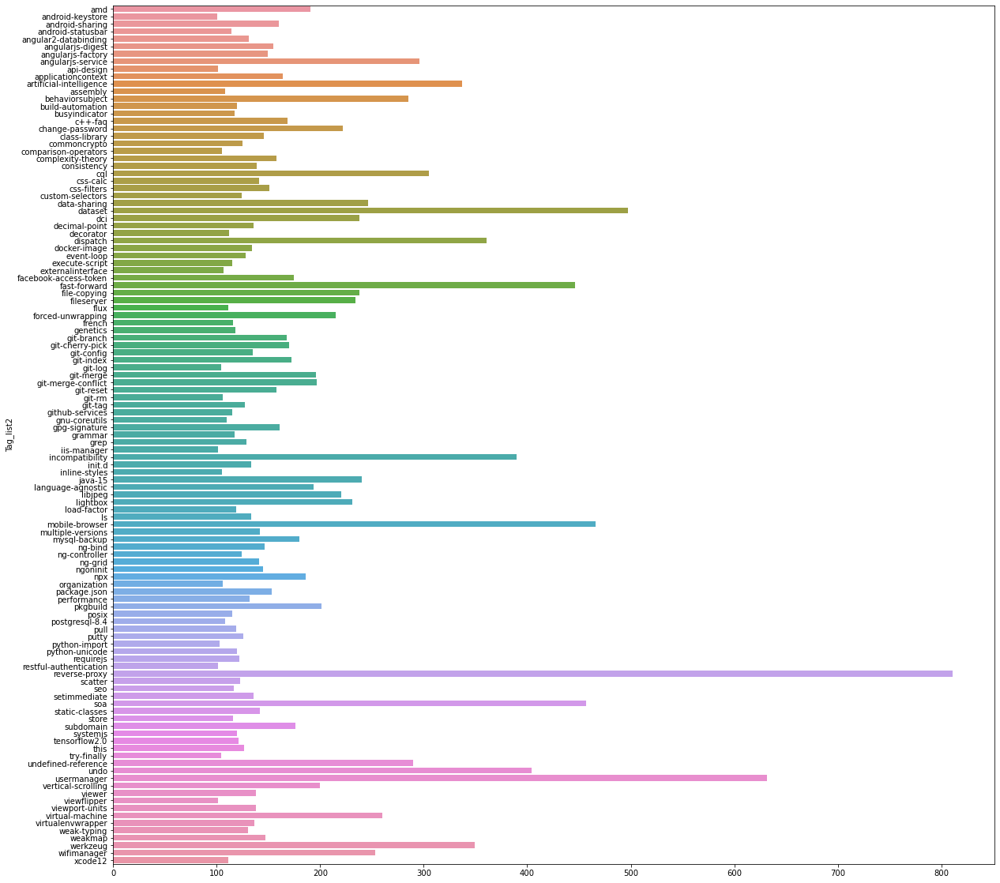

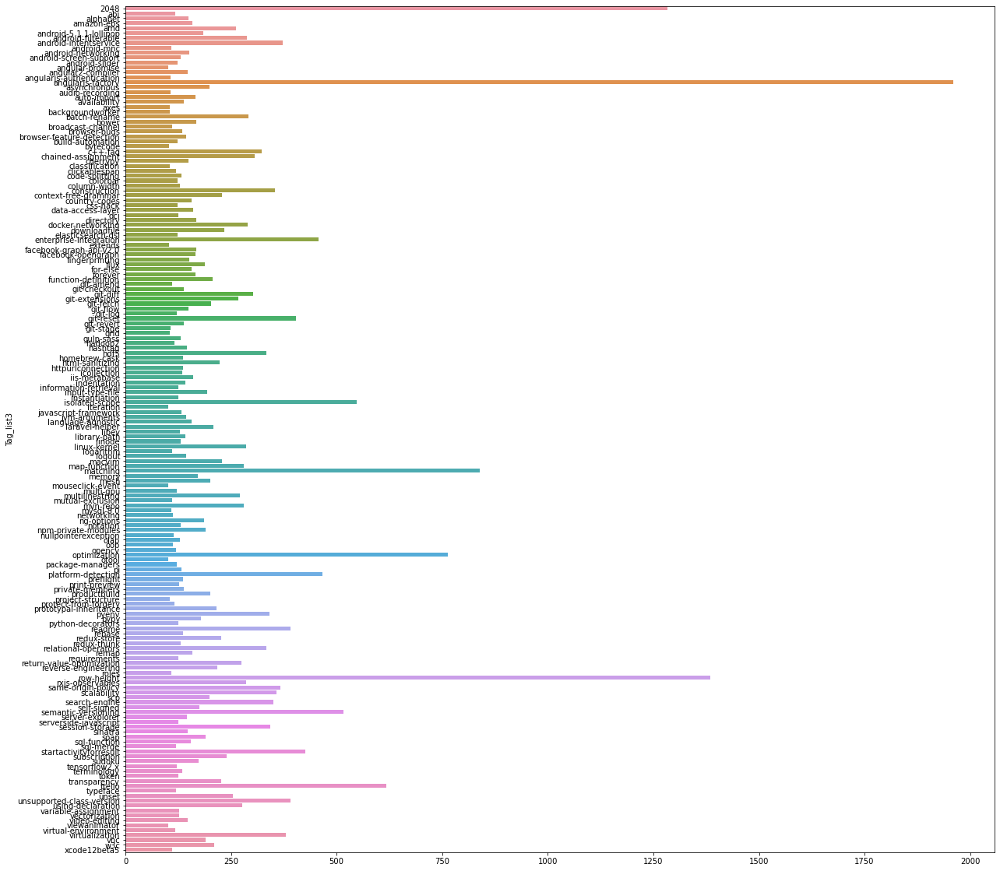

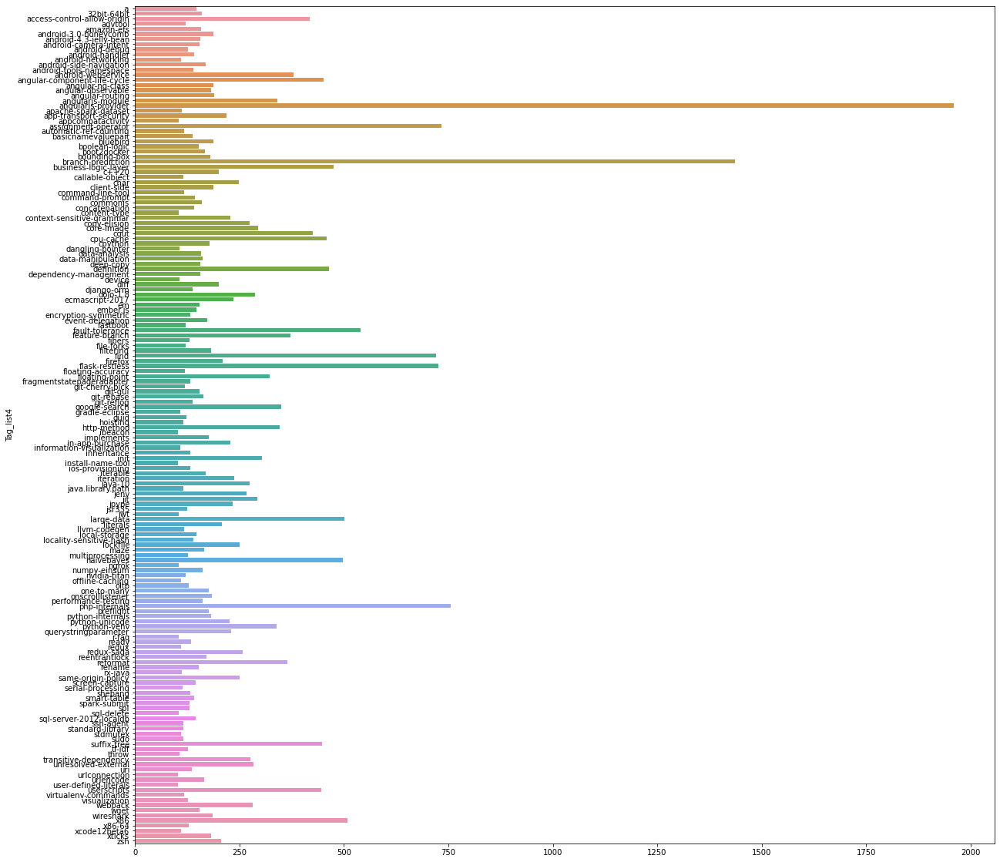

In [142]:
x=dict()
for i in query.columns:
    if 'Tag_l' in i:
        plt.figure(figsize=(20,20))
        sns.barplot(y=query.groupby(i).FavoriteCount.mean()[query.groupby(i).FavoriteCount.mean()>100].index,
                    x=query.groupby(i).FavoriteCount.mean()[query.groupby(i).FavoriteCount.mean()>100].values,
                    orient='horizontal')
        plt.show()
del x

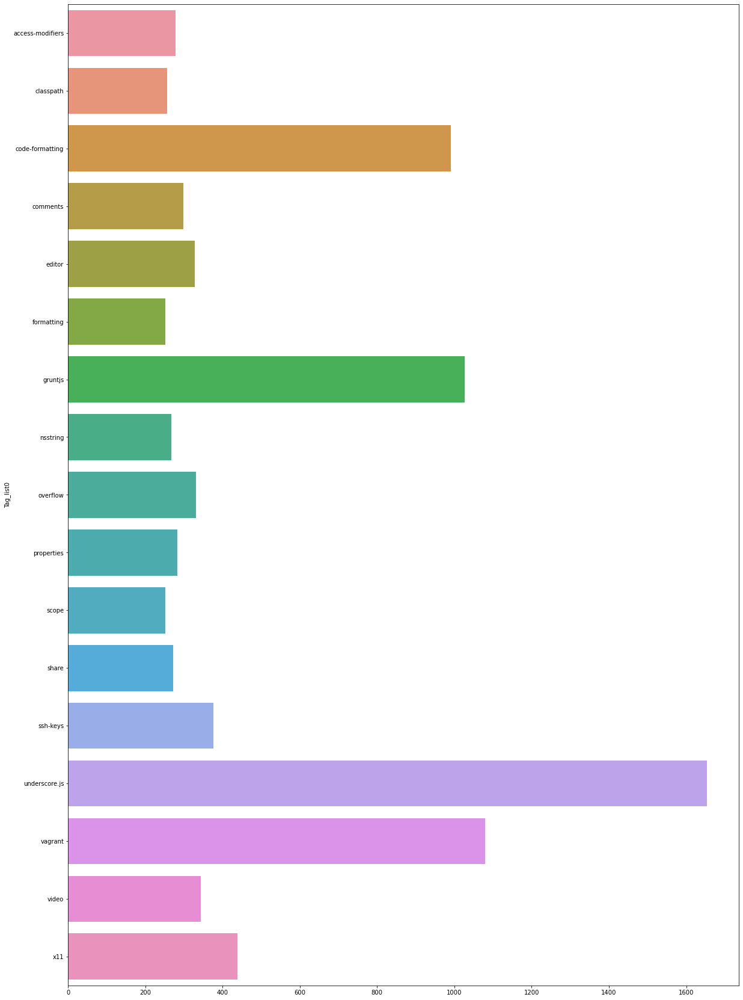

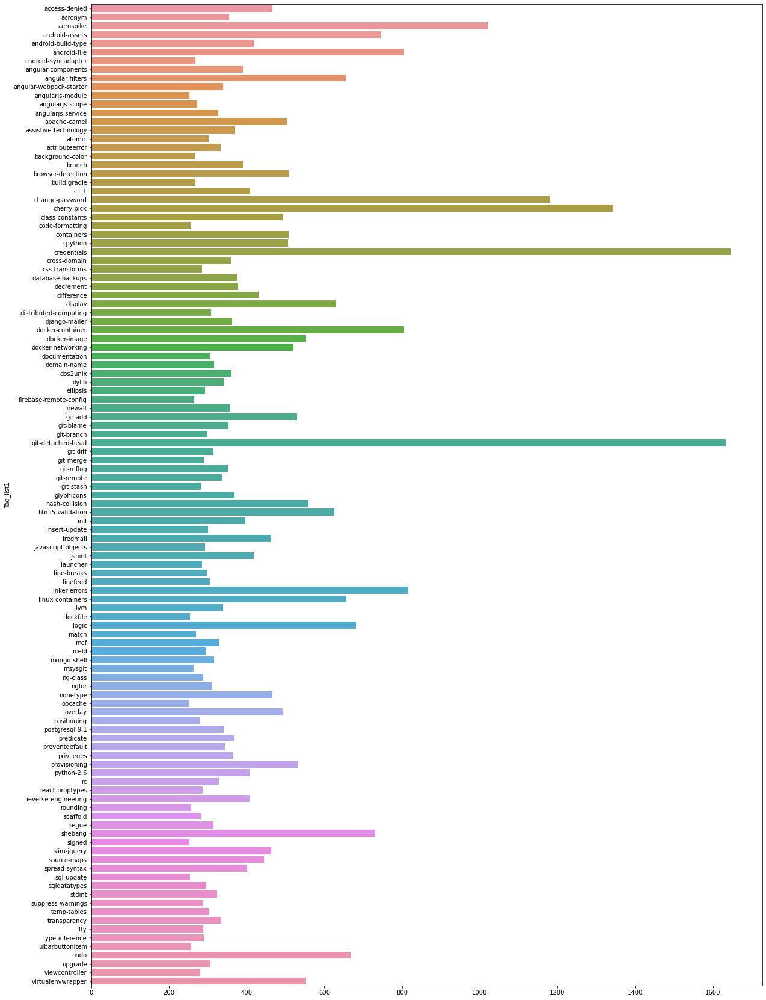

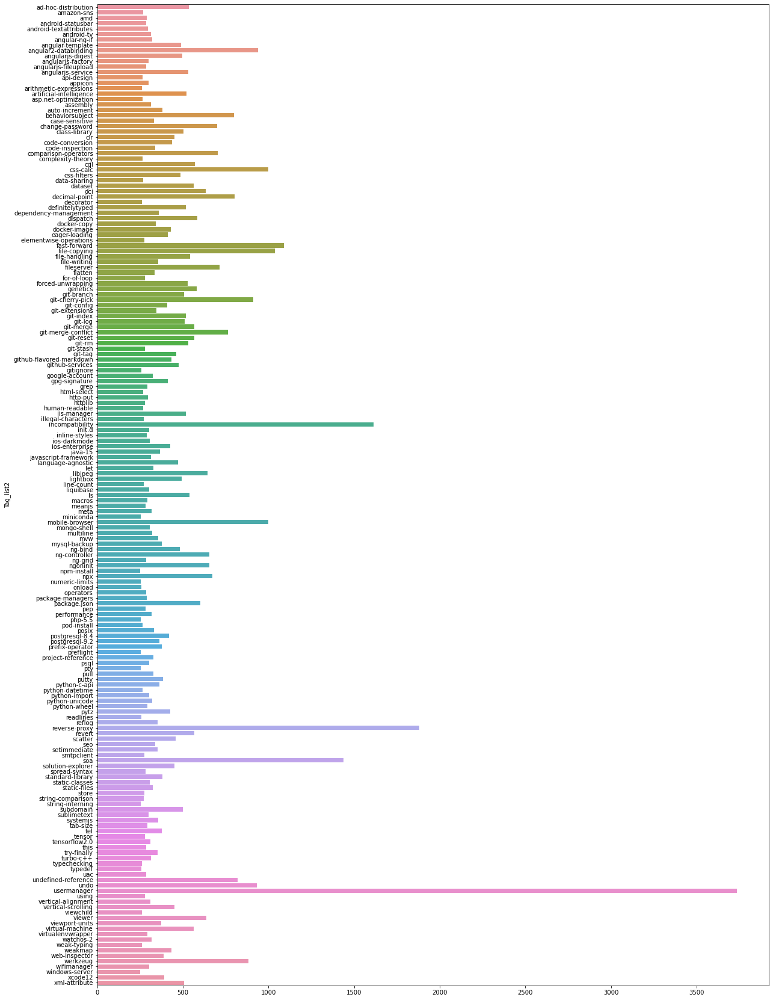

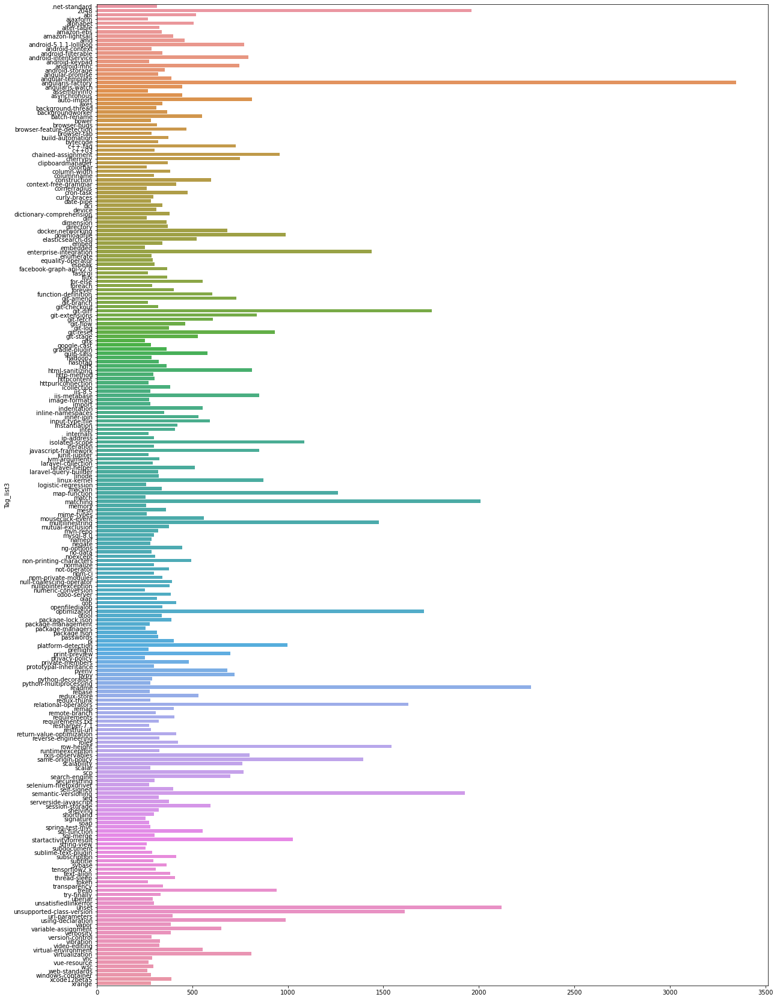

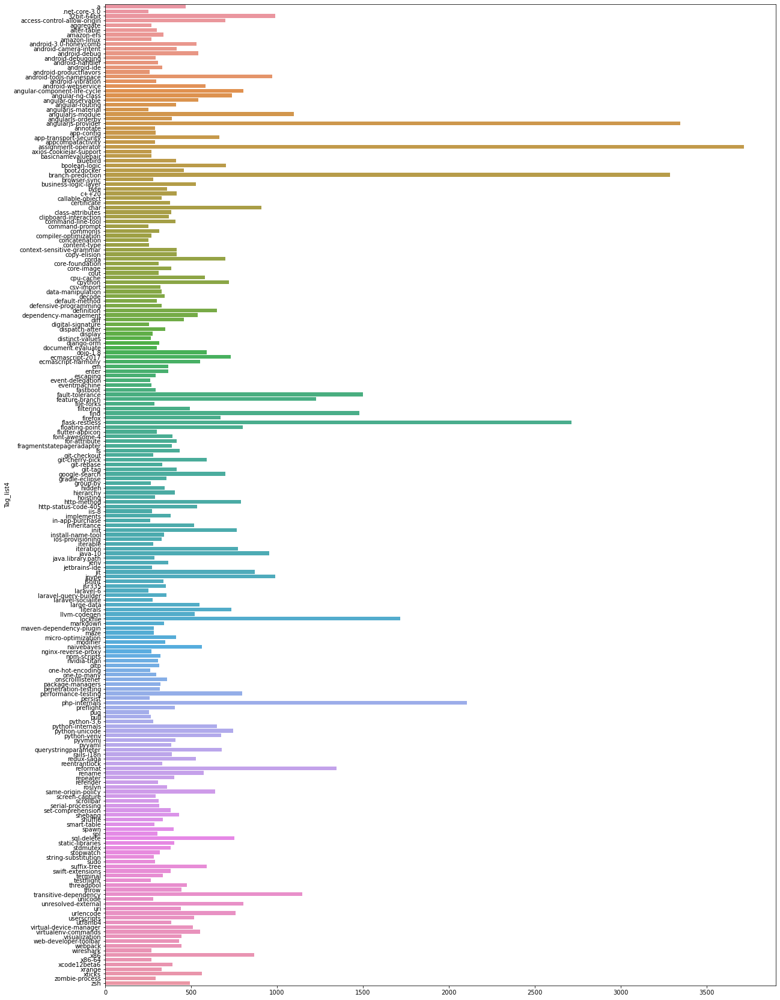

In [143]:
x=dict()
for i in query.columns:
    if 'Tag_l' in i:
        plt.figure(figsize=(20,30))
        sns.barplot(y=query.groupby(i).Score.mean()[query.groupby(i).Score.mean()>250].index,
                    x=query.groupby(i).Score.mean()[query.groupby(i).Score.mean()>250].values,
                    orient='horizontal')
        plt.show()
del x

In [144]:
pd.Series(tag_similarity_df).apply(str).to_csv('corpus_by_tag.csv',)

query.columns

query_to_export= query[['Id','CreationDate','AnswerCount', 'Body','CommentCount','FavoriteCount','Score',
                        'Title', 'ViewCount', 'Body_text',
                        'Tag_list0', 'Tag_list1', 'Tag_list2', 'Tag_list3',
                       'Tag_list4', ]]
query_to_export.to_csv("exported_query_df.csv",index=False)

In [145]:
query_to_export

,Id,CreationDate,AnswerCount,Body,CommentCount,FavoriteCount,Score,Title,ViewCount,Body_text,Tag_list0,Tag_list1,Tag_list2,Tag_list3,Tag_list4
0,19014250,2013-09-25 20:06:06,20,<p>How can I get React to re-render the view w...,0,110,373,Rerender view on browser resize with React,307174,How can I get React to re-render the view when...,javascript,reactjs,resize,NaN,NaN
1,10996237,2012-06-12 12:00:50,6,<p>In following example:</p>\n\n<pre><code>Lin...,5,3,27,What is the alternative to <br /> if I want to...,70586,In following example:\nLine1 <br /> Line2\n\nI...,html,css,NaN,NaN,NaN
2,10996248,2012-06-12 12:01:21,5,<p>Let's say I have a develop branch. I create...,1,6,26,Freezing a Git branch,29044,Let's say I have a develop branch. I create a ...,git,branch,git-branch,NaN,NaN
3,16775197,2013-05-27 14:20:09,28,<p>I have a multi-project (~10 modules) of whi...,12,258,464,Building and running app via Gradle and Androi...,222538,I have a multi-project (~10 modules) of which ...,android,gradle,android-studio,build.gradle,NaN
4,10826541,2012-05-31 01:59:56,5,<p>If I declare an object wrapped in a shared ...,11,47,89,Passing shared pointers as arguments,64214,If I declare an object wrapped in a shared poi...,c++,c++11,shared-ptr,c++-faq,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95509,22696886,2014-03-27 19:05:35,6,<p>This might seem a silly question but I can'...,2,21,115,How to iterate over array of objects in Handle...,180970,This might seem a silly question but I can't s...,arrays,loops,each,handlebars.js,NaN
95510,30626735,2015-06-03 17:22:47,13,<p>I am trying to upload a new build to TestFl...,0,4,28,Application Loader: ERROR ITMS-90502,18413,I am trying to upload a new build to TestFligh...,ios,xcode,app-store-connect,application-loader,NaN
95512,38811923,2016-08-07 07:25:29,6,<p>I'm using RxJava and I want to combine 12 d...,1,3,13,How to use RxJava combineLatest operator with ...,15227,I'm using RxJava and I want to combine 12 diff...,java,rx-java,NaN,NaN,NaN
95516,47984603,2017-12-26 23:03:33,6,<p><strong>Context</strong>: I am trying to bu...,7,6,44,Using SQL Server Management Studio to remote c...,28003,Context: I am trying to build a development SQ...,sql-server,docker,digital-ocean,NaN,NaN
